In [22]:
from matplotlib import pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve, precision_recall_curve, auc, recall_score, confusion_matrix
import sys 
sys.path.append('/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/')
from RF_atomver import *
from VisUtils import *
import pandas as pd
import numpy as np

In [23]:
neks = ['NEK2_binding', 'NEK2_inhibition', 'NEK3_binding', 'NEK5_binding', 'NEK9_binding', 'NEK9_inhibition'] 
nek_list = ["2", "3", "5", "9"]
nektype = ['binding','inhibition']
feat_types = ['moe', 'mfp']
samplings = ['scaled', 'UNDER' , 'SMOTE', 'ADASYN']
model_types = ['RF','RF_BCW', 'BRFC', 'BRFC_BCW']
RF_types = ['RF','RF_BCW', 'BRFC', 'BRFC_BCW']
model_palette = sns.cubehelix_palette(start=.5, rot=-.5, n_colors=2)
category_order = ['TP', 'TN', 'FP', 'FN']
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
k=7
prob_path = '/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/RF/RF_results/proba_dfs/'
col_names = ['prediction_type', 'ADdist', 'model_type']
result_path = '/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/RF/RF_results/'
# result_path = '/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/RF/RF_grid_search/rf_results/'
# pickle_path ='/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/RF/RF_grid_search/rf_results'
# prob_path = '/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/RF/RF_grid_search/rf_results/proba_dfs_GS/'

In [24]:
import scipy as sp
from sklearn.metrics import pairwise_distances

# ---------------------------------------------
def calc_AD_kmean_dist(train_dset, pred_dset, k, train_dset_pair_distance=None, dist_metric="euclidean"):
    """
    calculate the probability of the prediction dataset fall in the the domain of traning set. Use Euclidean distance of the K nearest neighbours.
    train_dset and pred_dset should be in 2D numpy array format where each row is a compound.
    """
    if train_dset_pair_distance is None:
        # calcualate the pairwise distance of training set
        train_dset_pair_distance = pairwise_distances(X=train_dset, metric=dist_metric)
    train_kmean_dis = []
    for i in range(len(train_dset_pair_distance)):
        kn_idx = np.argpartition(train_dset_pair_distance[i], k+1)
        dis = np.mean(train_dset_pair_distance[i][kn_idx[:k+1]])
        train_kmean_dis.append(dis)
    train_dset_distribution = sp.stats.norm.fit(train_kmean_dis)
    # pairwise distance between train and pred set
    pred_size = len(pred_dset)
    train_pred_dis = pairwise_distances(X=pred_dset, Y=train_dset, metric=dist_metric)
    pred_kmean_dis_score = np.zeros(pred_size)
    for i in range(pred_size):
        pred_km_dis = np.mean(np.sort(train_pred_dis[i])[:k])
        train_dset_std = train_dset_distribution[1] if train_dset_distribution[1] != 0 else 1e-6
        pred_kmean_dis_score[i] = max(1e-6, (pred_km_dis - train_dset_distribution[0]) / train_dset_std)
    return pred_kmean_dis_score

In [74]:
pred_palette = {'TP':'#1B512D', 'FP':'#B1CF5F', 'TN': '#EBA6A9', 'FN': '#880044'}
pred_markers = {'TP': 'o','TN': 's', 'FP': '^', 'FN': 'D'}
pred_sizes = {'TP': 100, 'TN': 95, 'FP': 97, 'FN': 97}

In [25]:

def RF_scatter_stdprob_AD_simple(predictions, true_labels,std1, std0, ad_dist, title, figure_path=None, filename=None):
    # works for one at a time
    print(predictions.shape, true_labels.shape)
    
    true_pos = np.where((predictions == 1) & (true_labels == 1).flatten())[0] 
    true_neg = np.where((predictions == 0) & (true_labels == 0).flatten())[0]
    false_pos = np.where((predictions == 1) & (true_labels == 0).flatten())[0] 
    false_neg = np.where((predictions == 0) & (true_labels == 1).flatten())[0] 
    tp_std1 = std1[true_pos]
    tn_std0 = std0[true_neg]
    fp_std1 = std1[false_pos]
    fn_std1 = std1[false_neg]
    tp_ad = ad_dist[true_pos]
    tn_ad = ad_dist[true_neg]
    fp_ad = ad_dist[false_pos]
    fn_ad = ad_dist[false_neg]

    data = {
        'std of probabilities': np.concatenate([tp_std1,tn_std0,fp_std1, fn_std1]),
        'prediction_type': ['TP'] * len(true_pos) + ['TN'] * len(true_neg) + ['FP'] * len(false_pos) + ['FN'] * len(false_neg),
        'ADdist': np.concatenate([tp_ad, tn_ad, fp_ad,fn_ad]) 
    }
    df=pd.DataFrame(data) 

    plt.figure(figsize=(10, 6))
    ax = sns.scatterplot(data=df,x='ADdist', y='std of probabilities',hue='prediction_type',palette= pred_palette)
   
    # if ax.legend_:
    #     ax.legend_.remove()
    plt.title(title)
    plt.xlabel('ADdist')
    plt.ylabel('Std of probability')
    plt.ylim(-0.01, 0.51)
    

    if figure_path is not None: 
        plt.savefig(f'{figure_path}{filename}.png')
    plt.show();


NEK2 moe scaled RF
(409,) (409,)


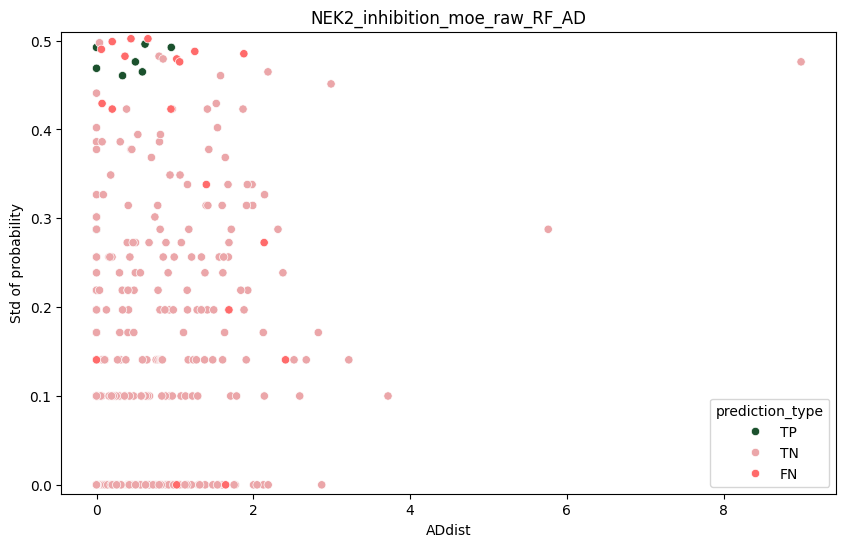

NEK2 moe scaled RF_BCW
(409,) (409,)


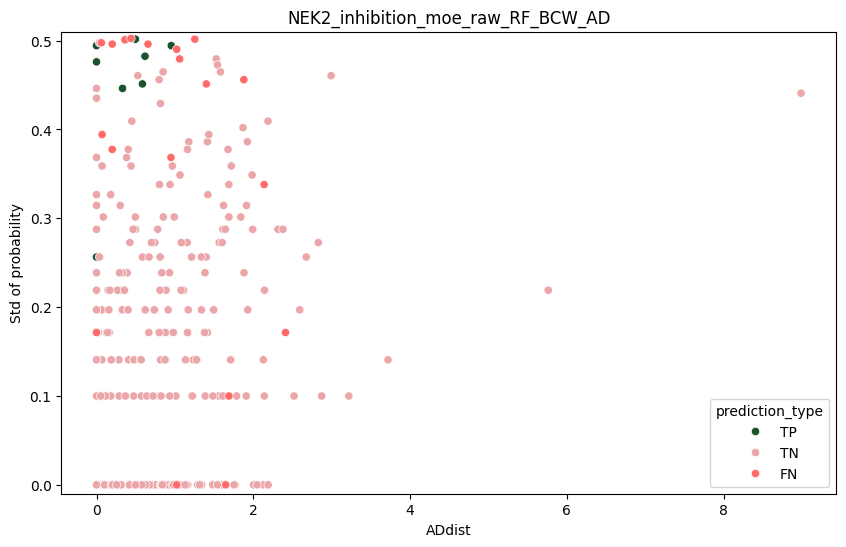

NEK2 moe scaled BRFC
(409,) (409,)


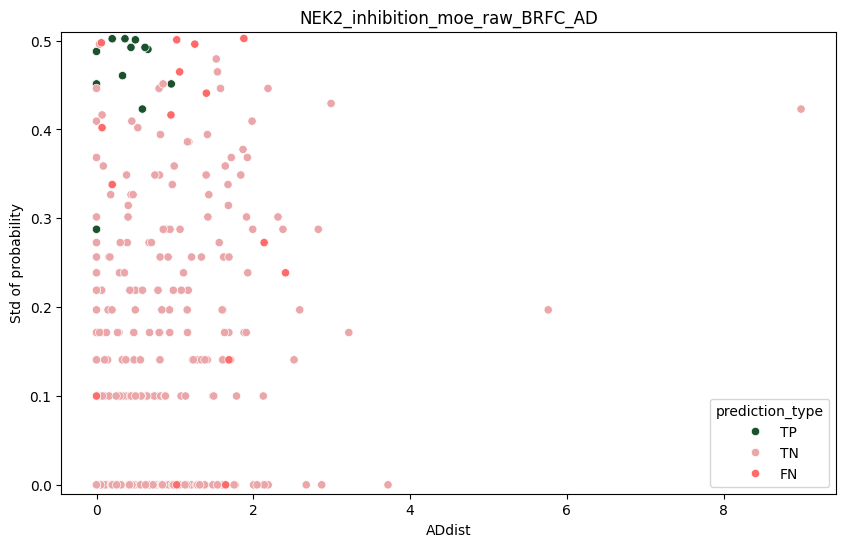

NEK2 moe scaled BRFC_BCW
(409,) (409,)


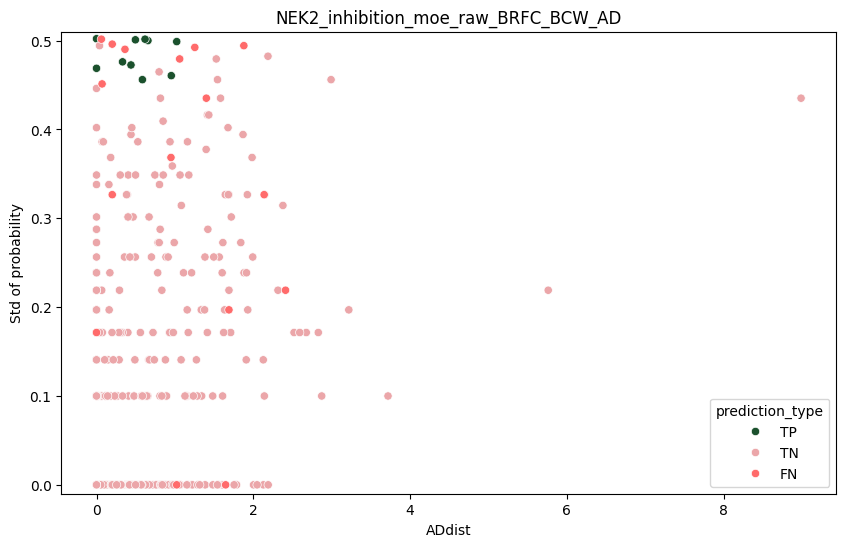

NEK2 moe UNDER RF
(409,) (409,)


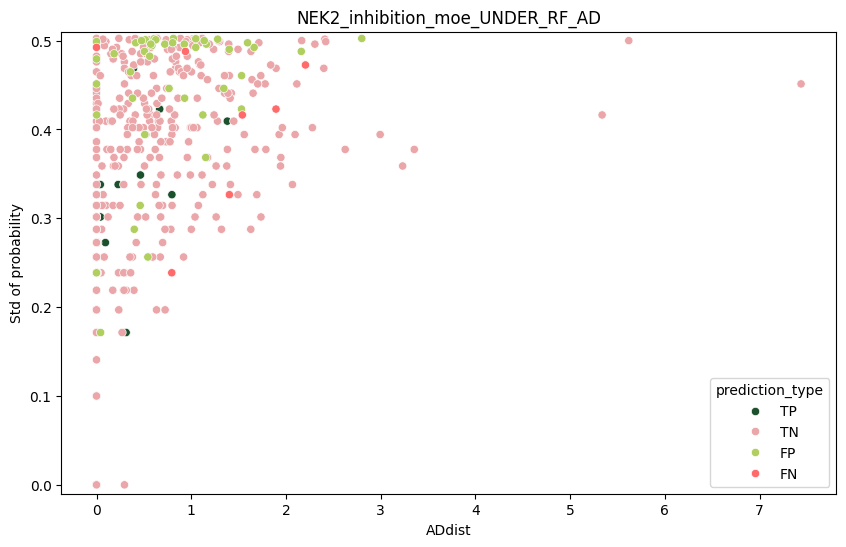

NEK2 moe UNDER RF_BCW
(409,) (409,)


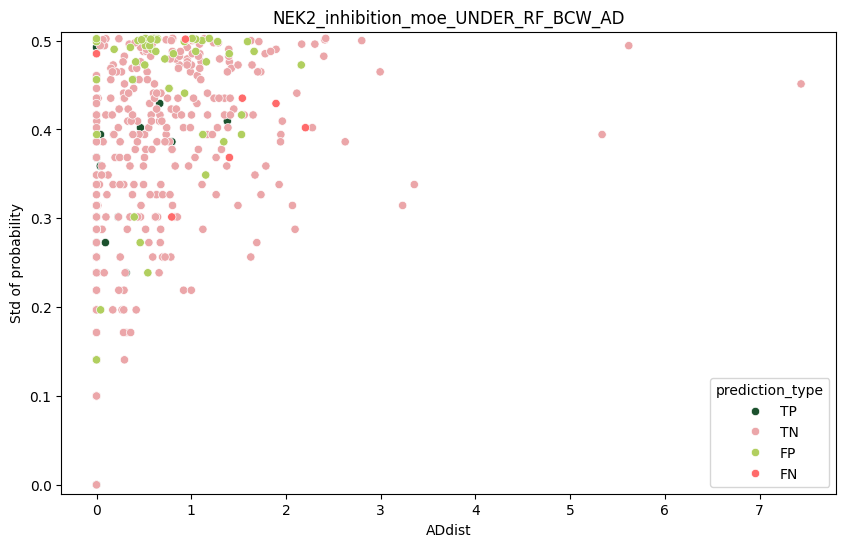

NEK2 moe UNDER BRFC
(409,) (409,)


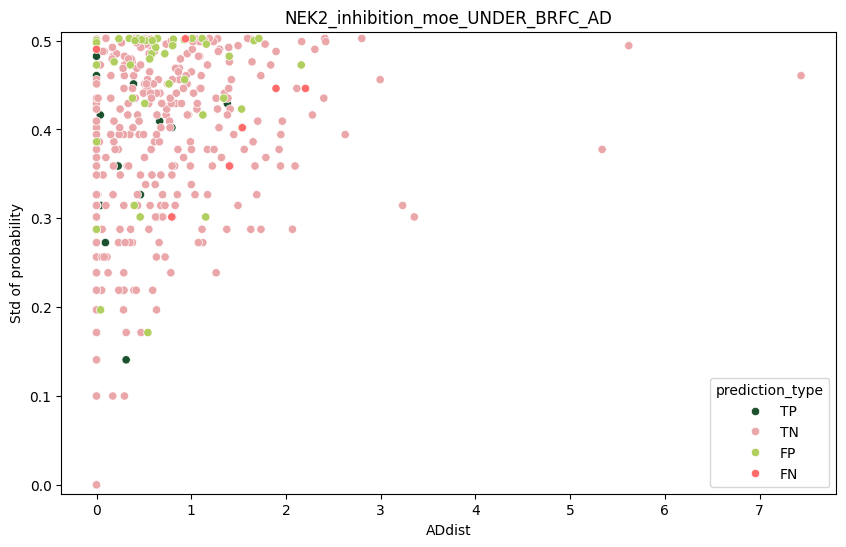

NEK2 moe UNDER BRFC_BCW
(409,) (409,)


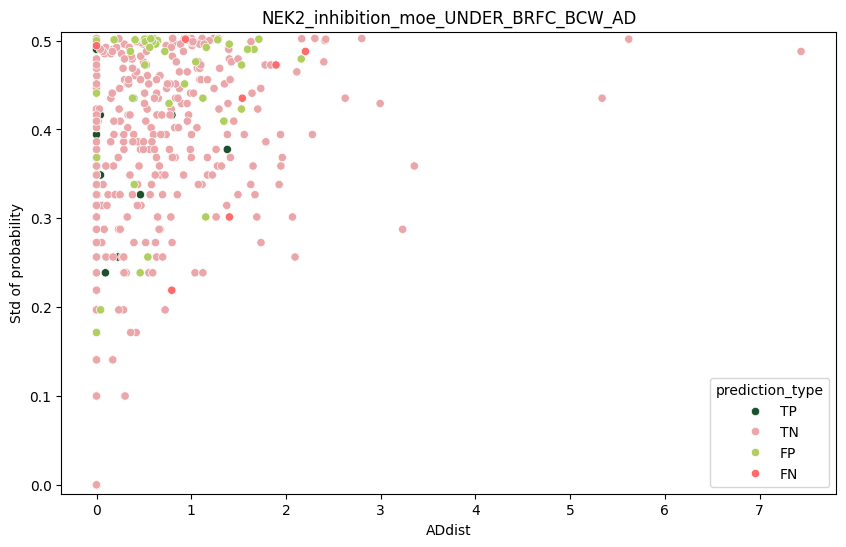

NEK2 moe SMOTE RF
(409,) (409,)


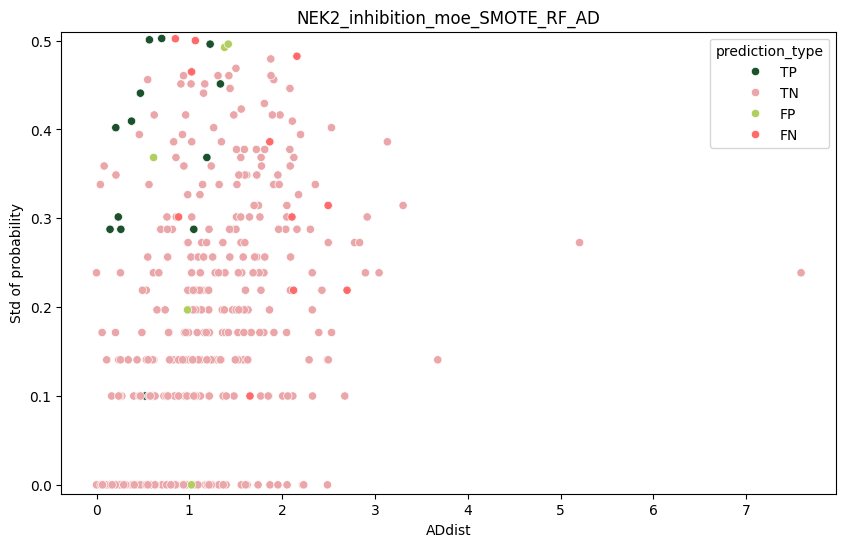

NEK2 moe SMOTE RF_BCW
(409,) (409,)


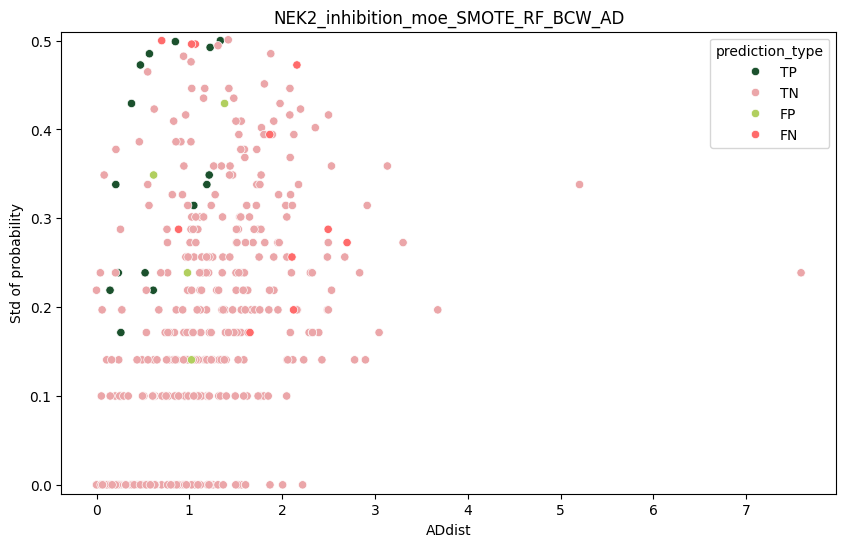

NEK2 moe SMOTE BRFC
(409,) (409,)


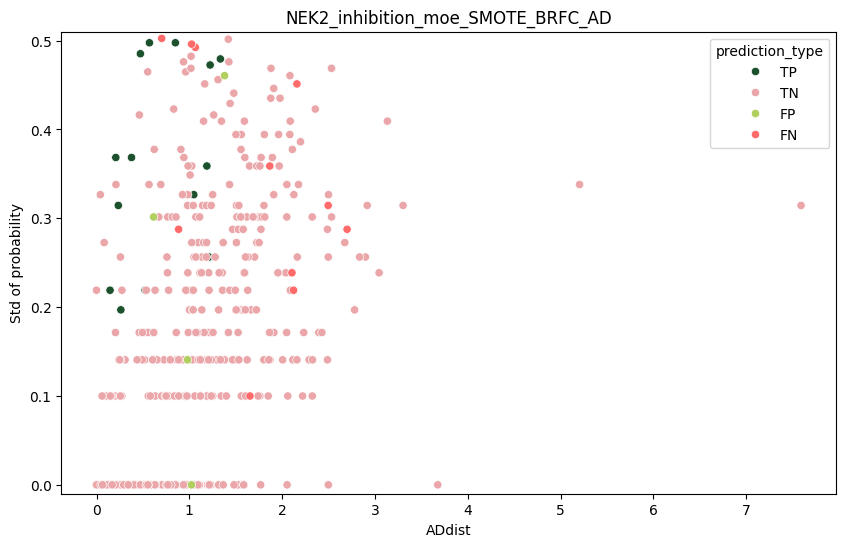

NEK2 moe SMOTE BRFC_BCW
(409,) (409,)


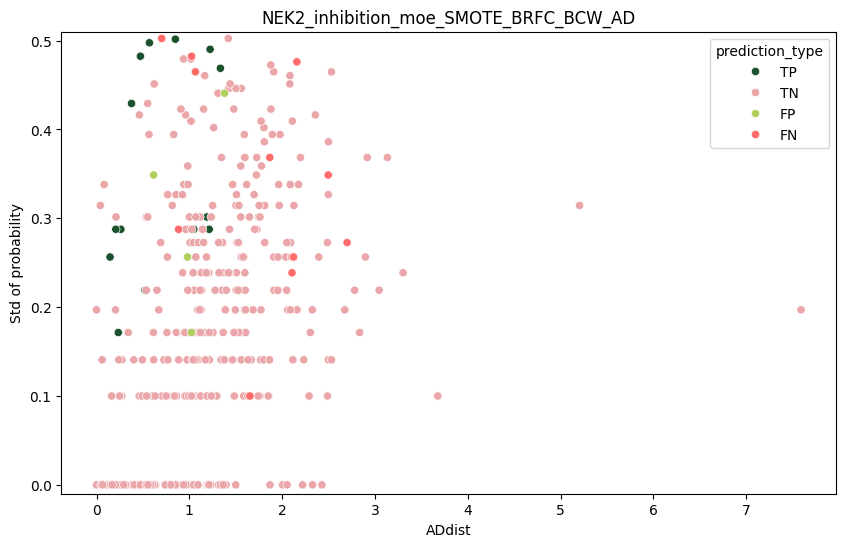

NEK2 moe ADASYN RF
(409,) (409,)


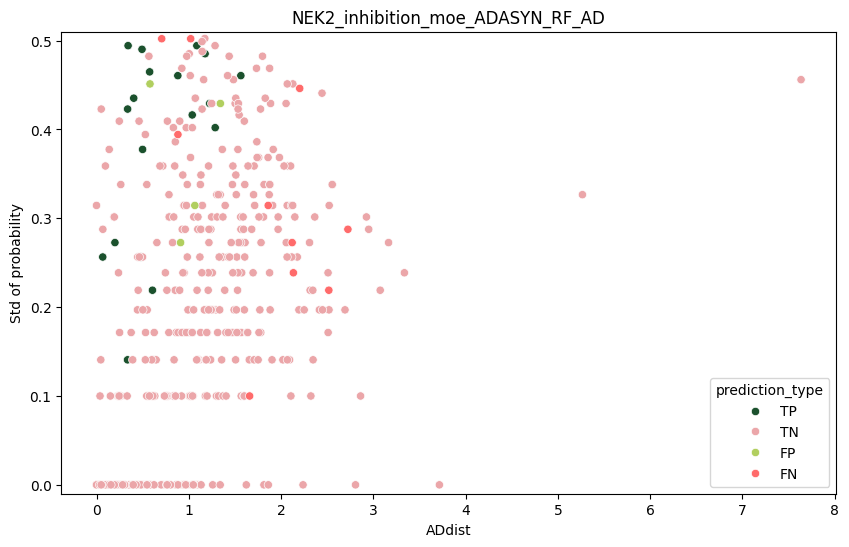

NEK2 moe ADASYN RF_BCW
(409,) (409,)


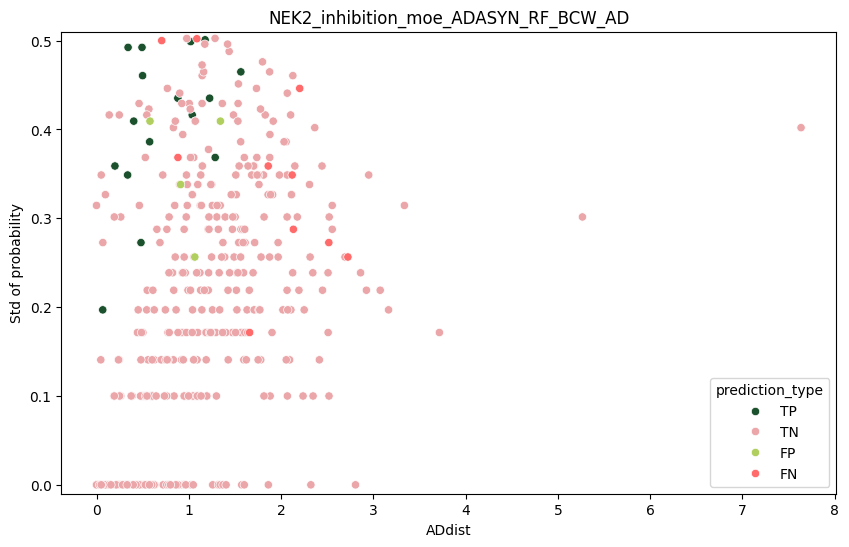

NEK2 moe ADASYN BRFC
(409,) (409,)


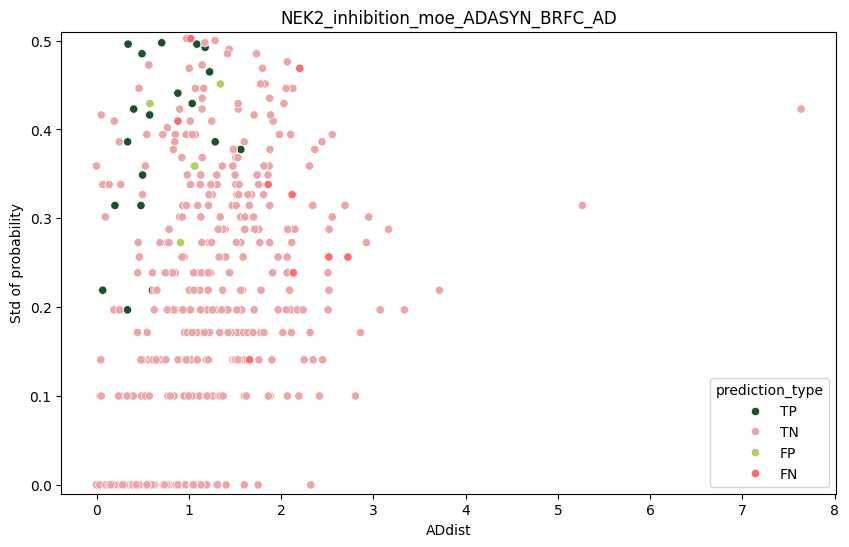

NEK2 moe ADASYN BRFC_BCW
(409,) (409,)


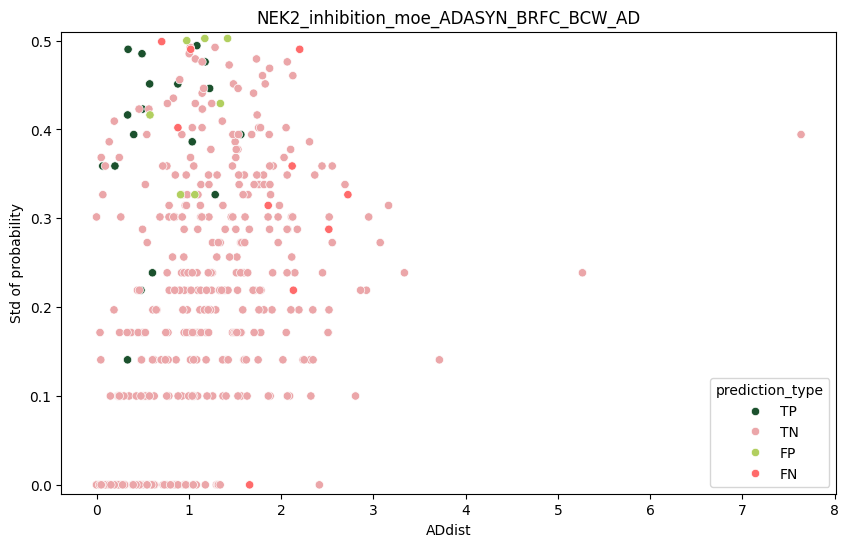

NEK2 mfp scaled RF
(409,) (409,)


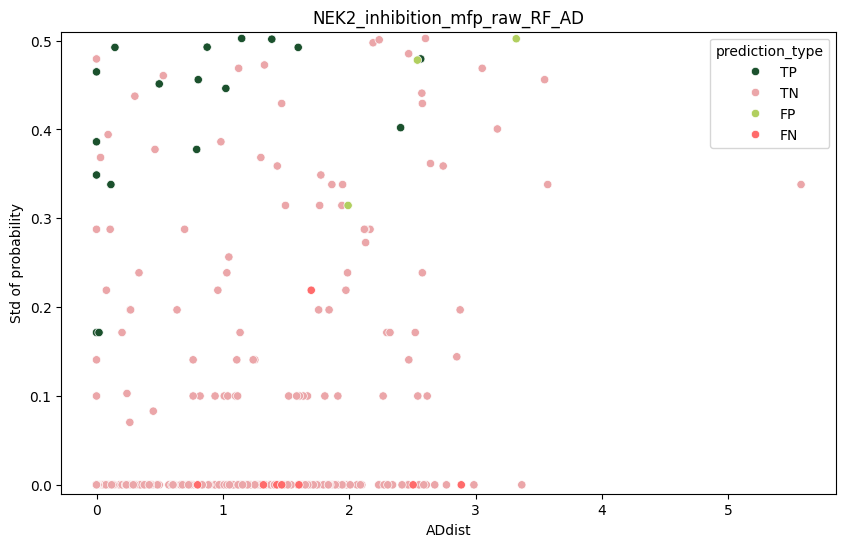

NEK2 mfp scaled RF_BCW
(409,) (409,)


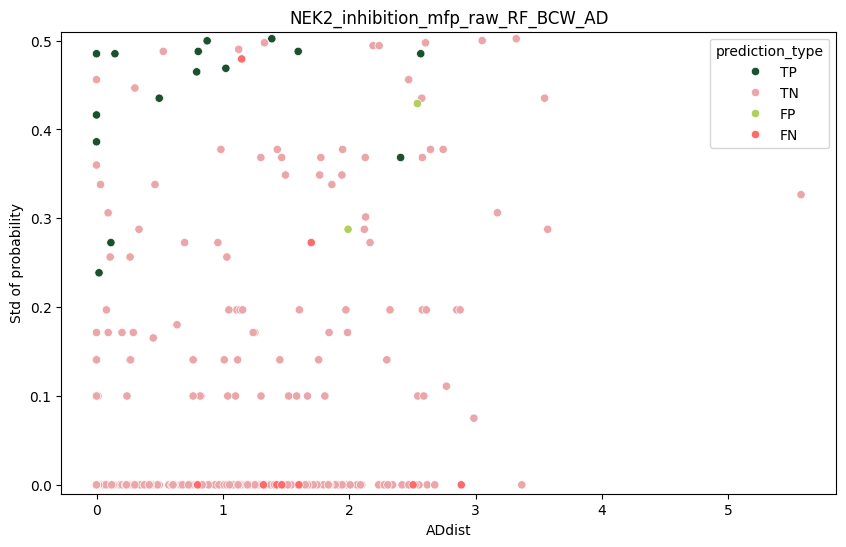

NEK2 mfp scaled BRFC
(409,) (409,)


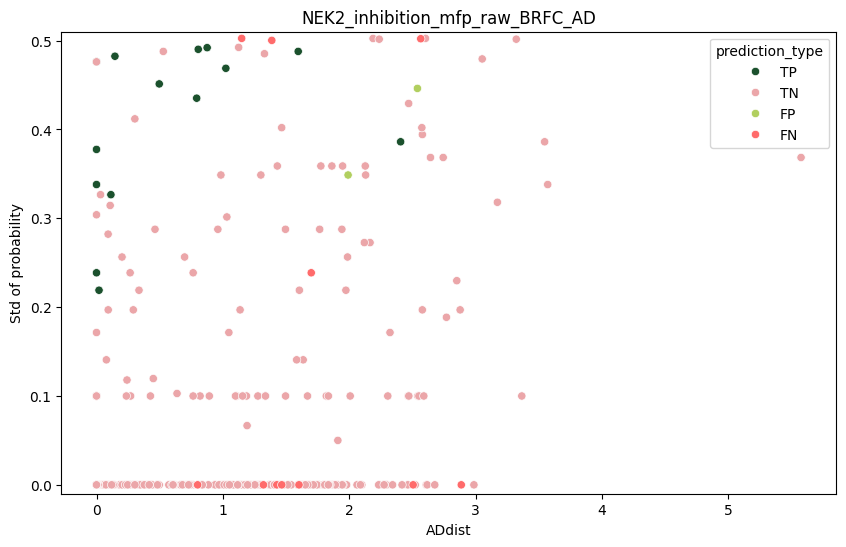

NEK2 mfp scaled BRFC_BCW
(409,) (409,)


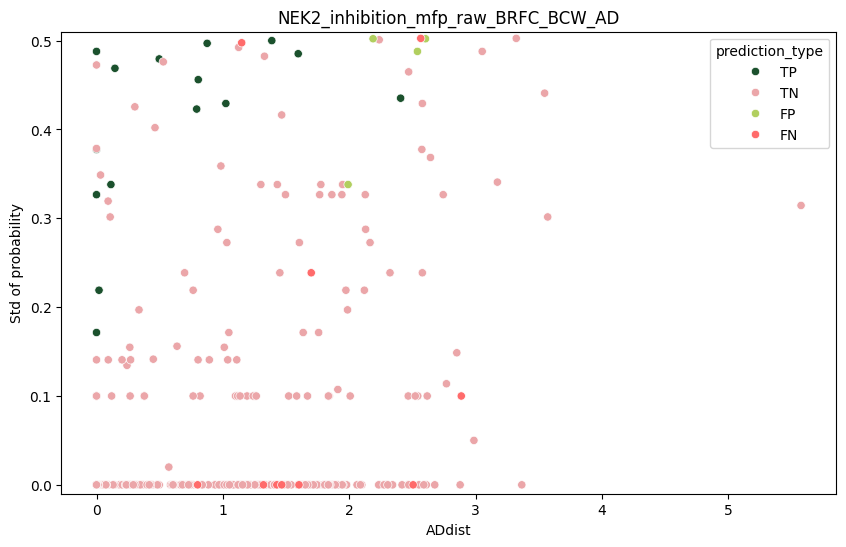

NEK2 mfp UNDER RF
(409,) (409,)


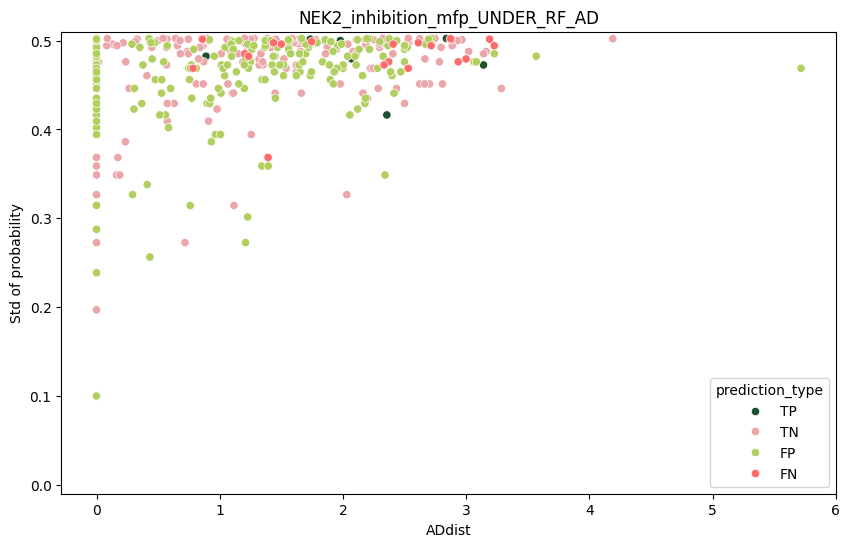

NEK2 mfp UNDER RF_BCW
(409,) (409,)


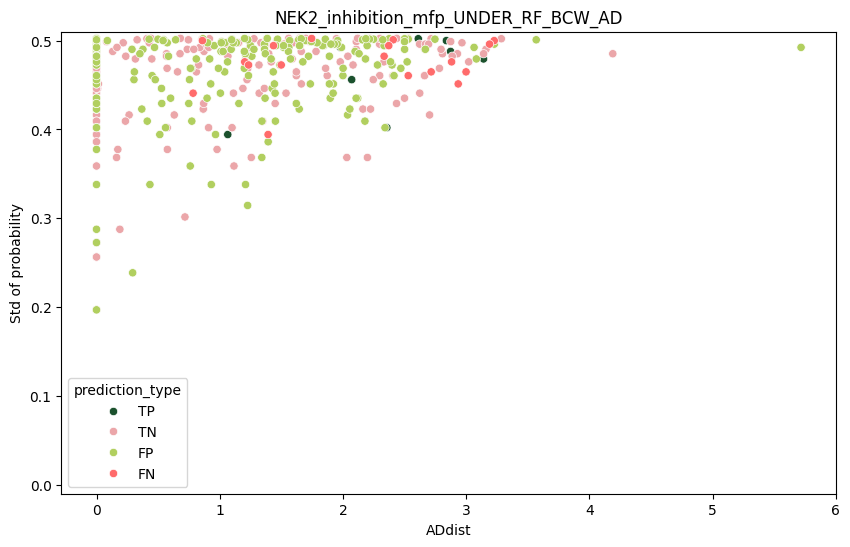

NEK2 mfp UNDER BRFC
(409,) (409,)


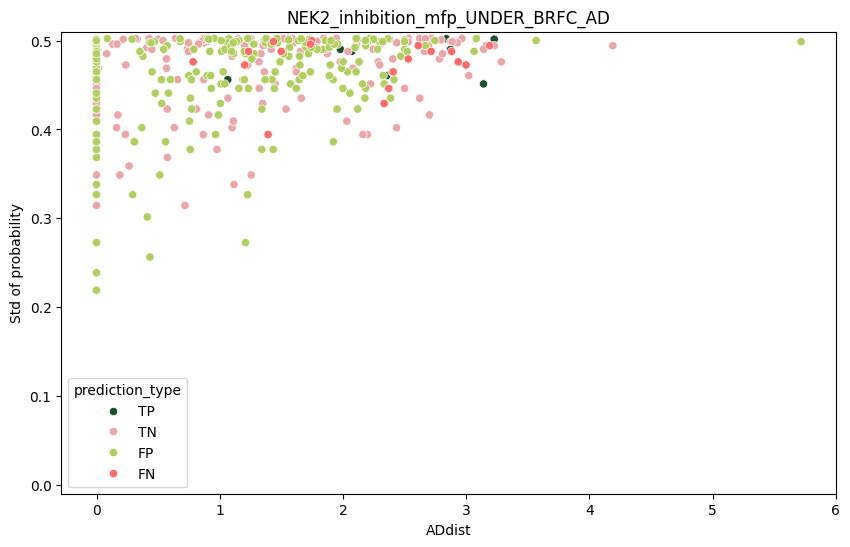

NEK2 mfp UNDER BRFC_BCW
(409,) (409,)


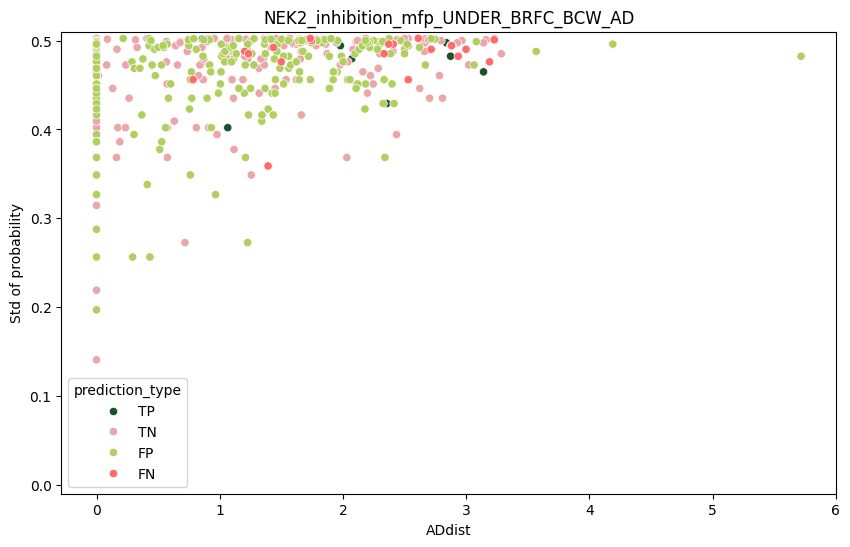

NEK2 mfp SMOTE RF
(409,) (409,)


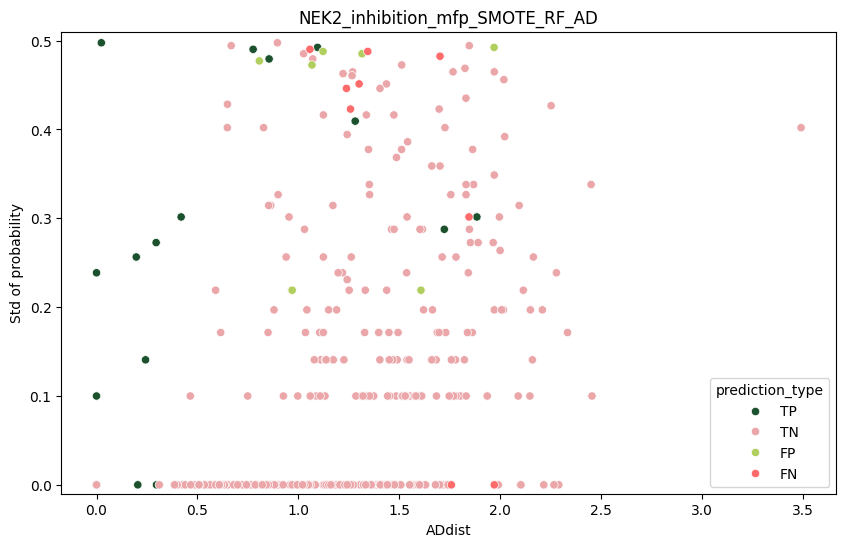

NEK2 mfp SMOTE RF_BCW
(409,) (409,)


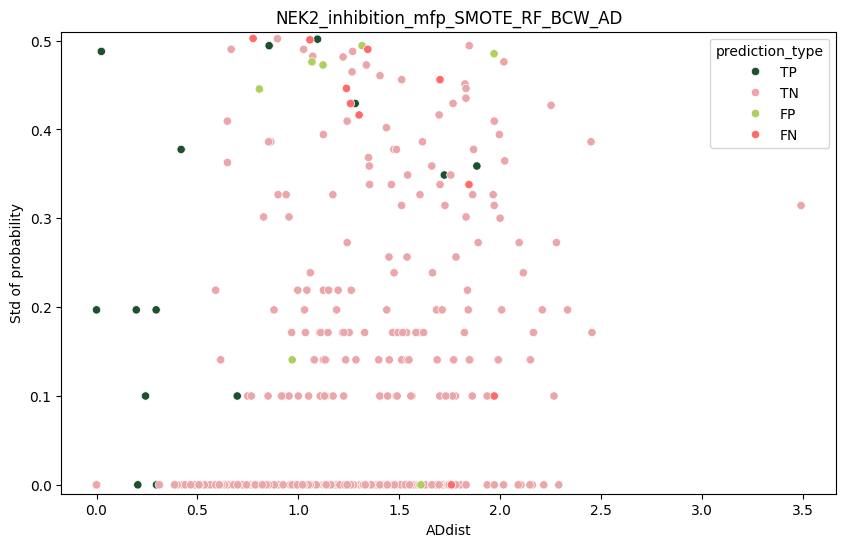

NEK2 mfp SMOTE BRFC
(409,) (409,)


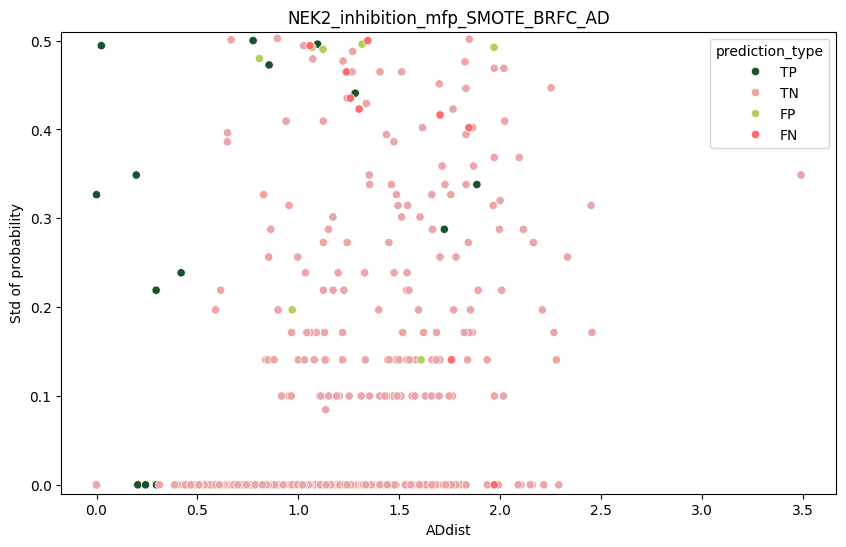

NEK2 mfp SMOTE BRFC_BCW
(409,) (409,)


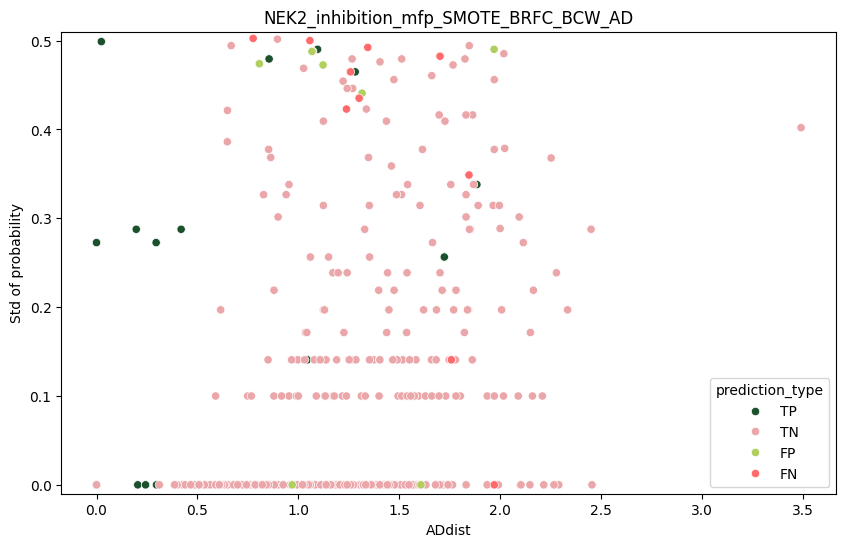

NEK2 mfp ADASYN RF
(409,) (409,)


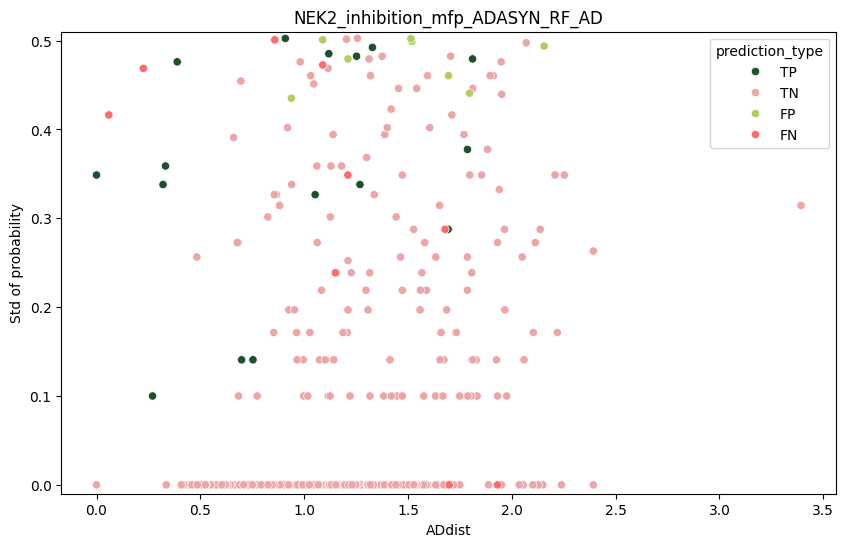

NEK2 mfp ADASYN RF_BCW
(409,) (409,)


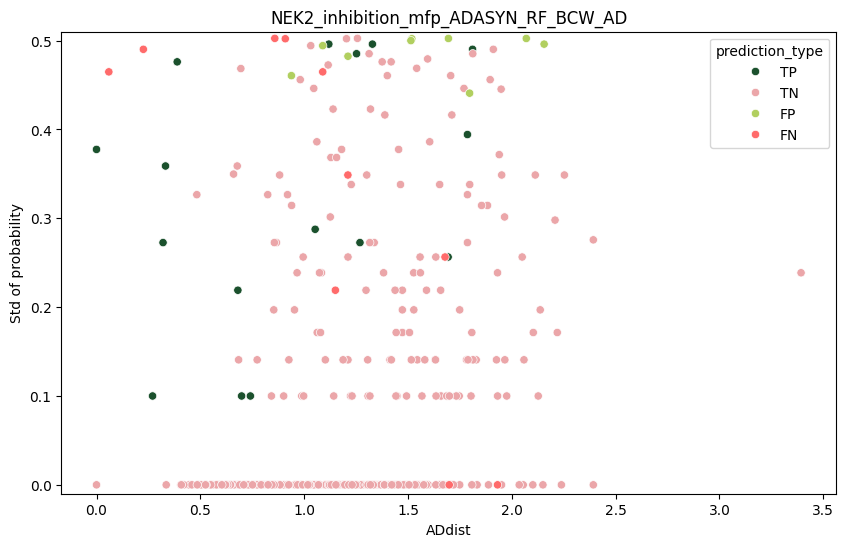

NEK2 mfp ADASYN BRFC
(409,) (409,)


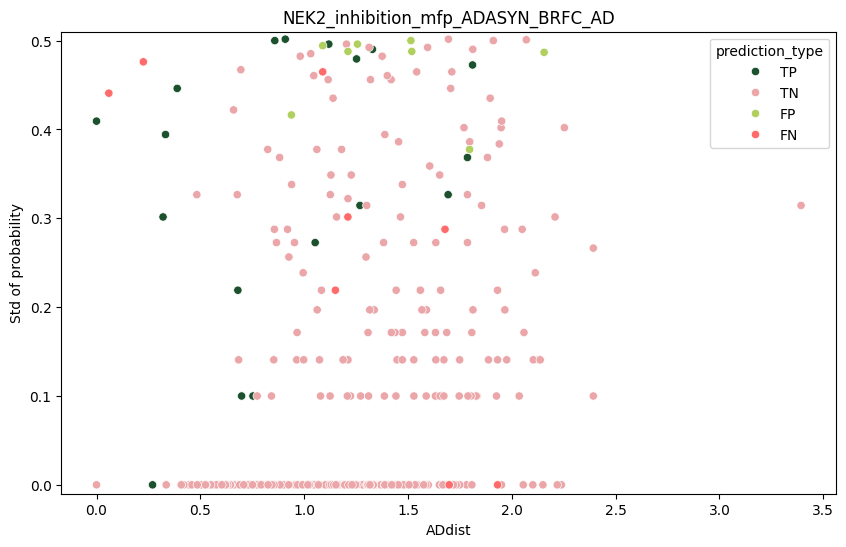

NEK2 mfp ADASYN BRFC_BCW
(409,) (409,)


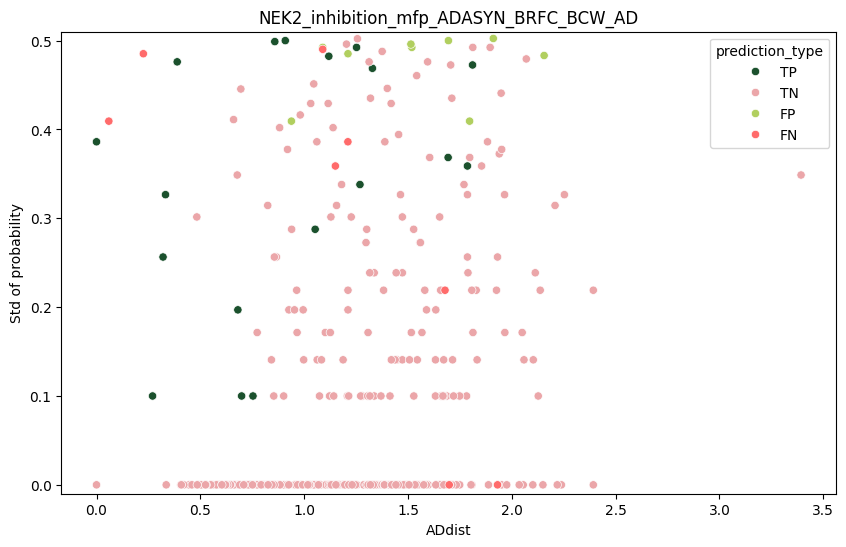

NEK9 moe scaled RF
(80,) (80,)


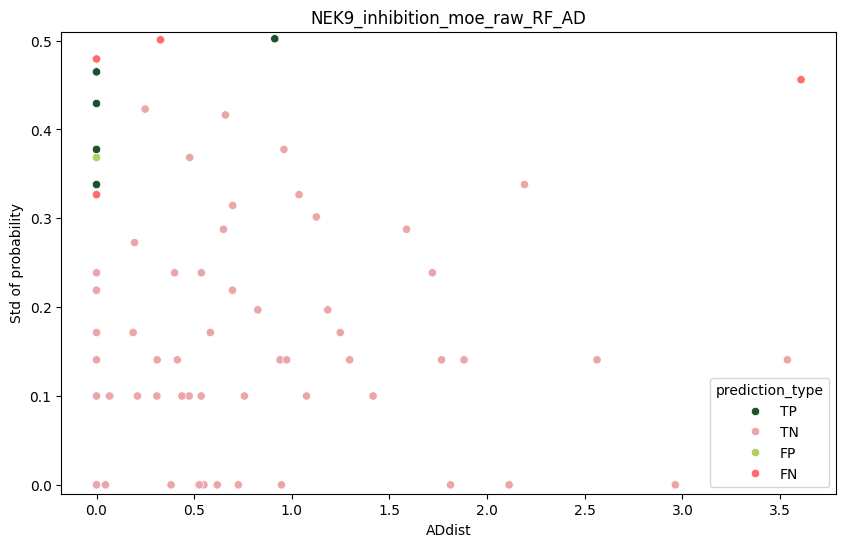

NEK9 moe scaled RF_BCW
(80,) (80,)


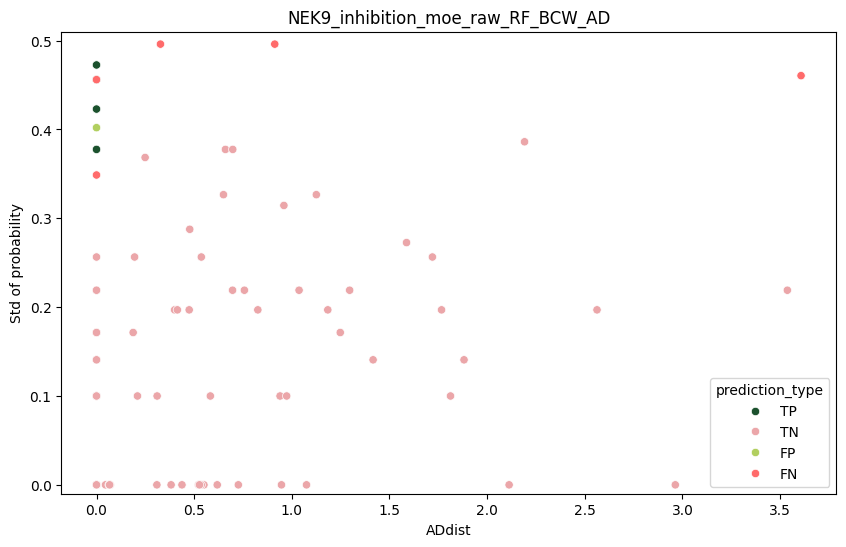

NEK9 moe scaled BRFC
(80,) (80,)


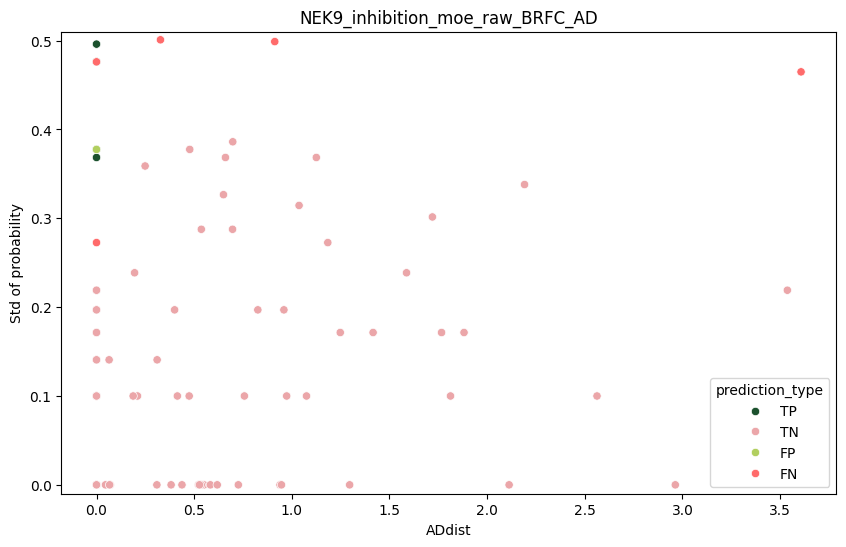

NEK9 moe scaled BRFC_BCW
(80,) (80,)


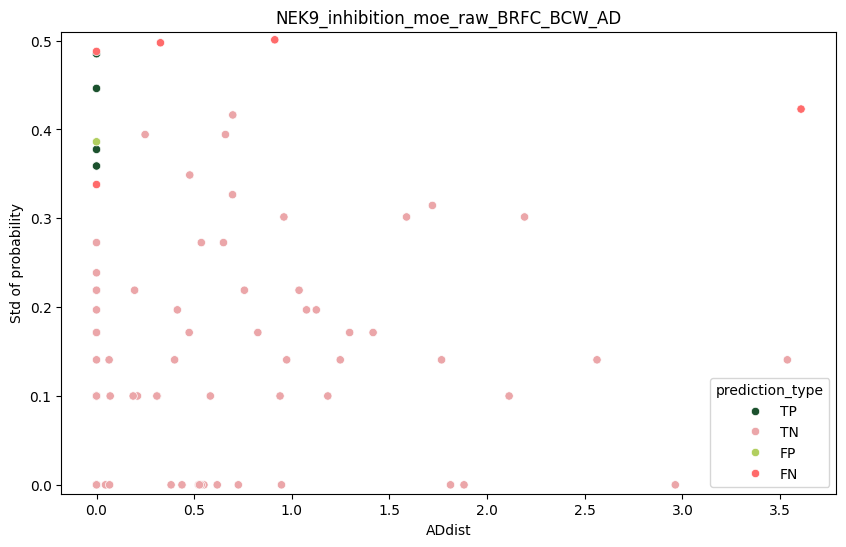

NEK9 moe UNDER RF
(80,) (80,)


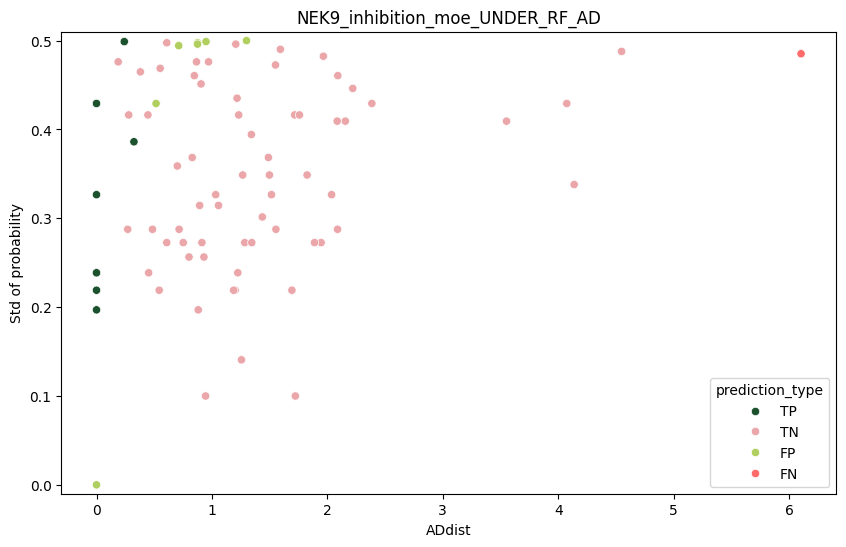

NEK9 moe UNDER RF_BCW
(80,) (80,)


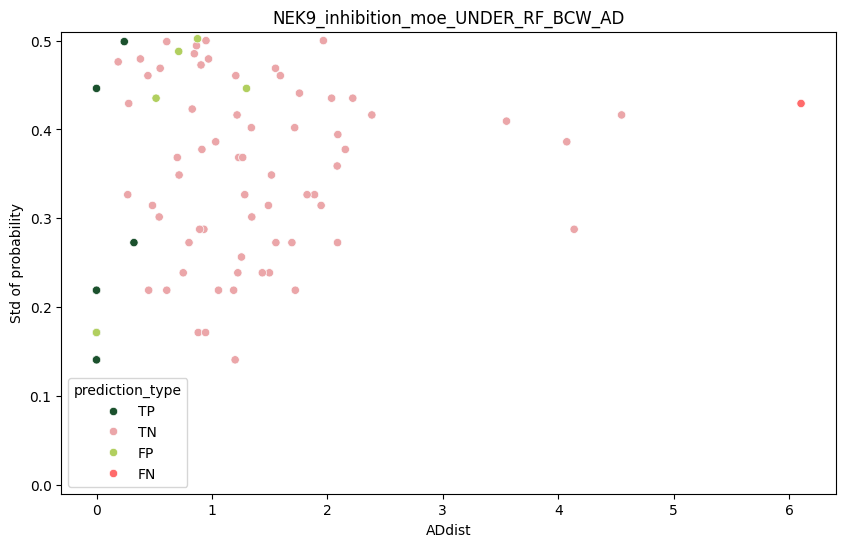

NEK9 moe UNDER BRFC
(80,) (80,)


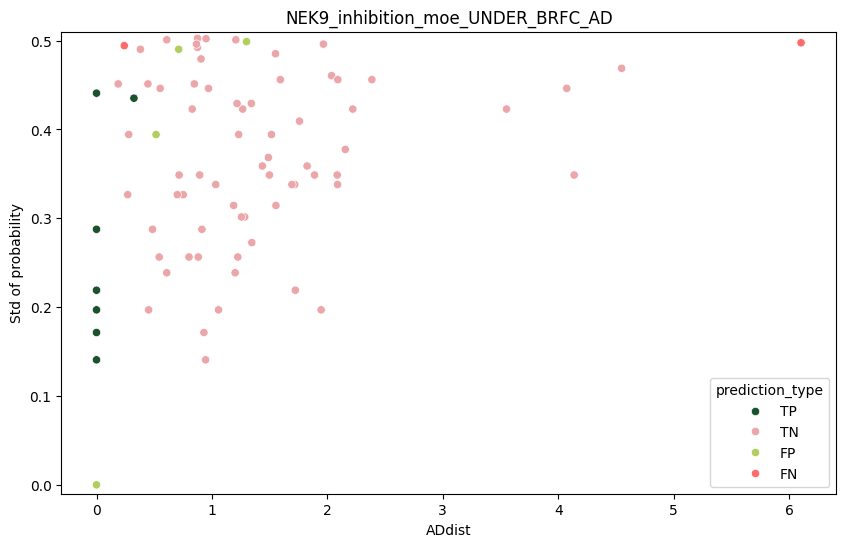

NEK9 moe UNDER BRFC_BCW
(80,) (80,)


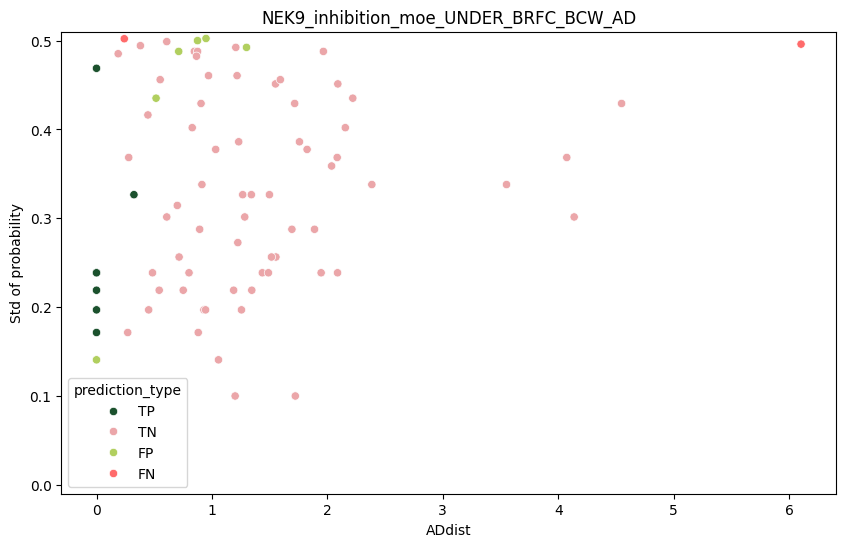

NEK9 moe SMOTE RF
(80,) (80,)


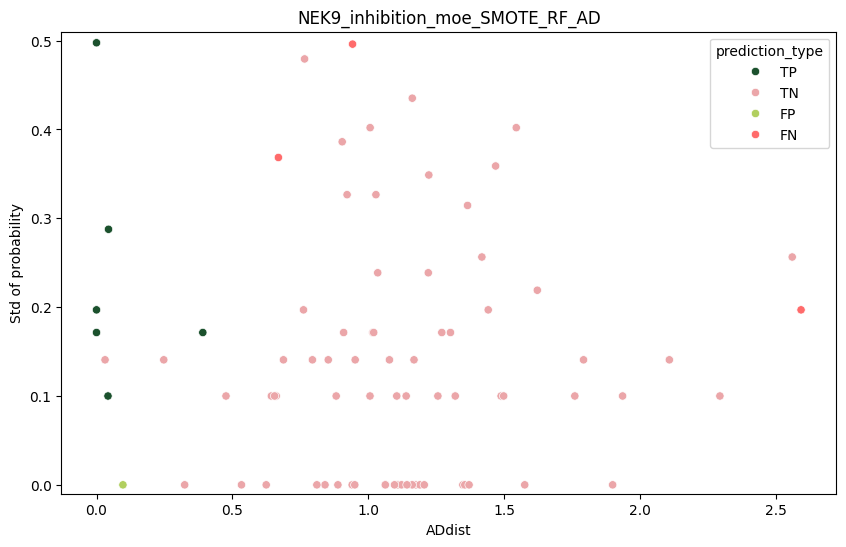

NEK9 moe SMOTE RF_BCW
(80,) (80,)


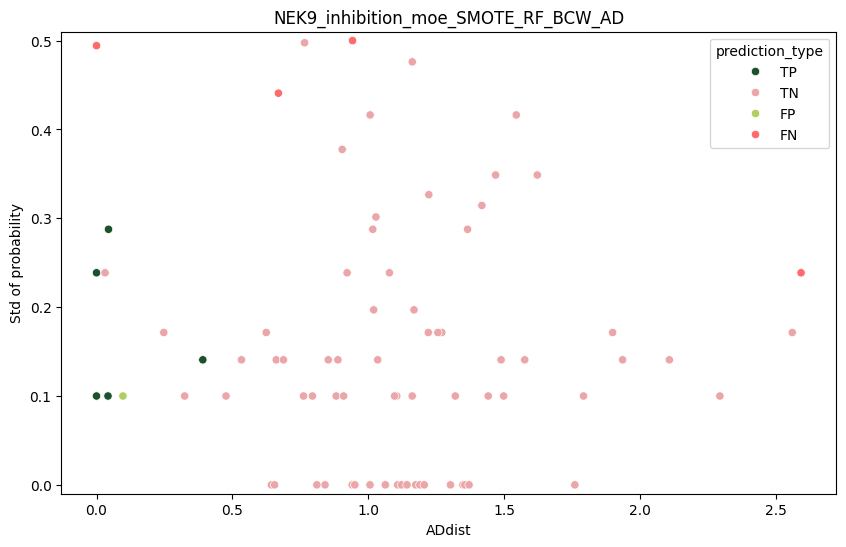

NEK9 moe SMOTE BRFC
(80,) (80,)


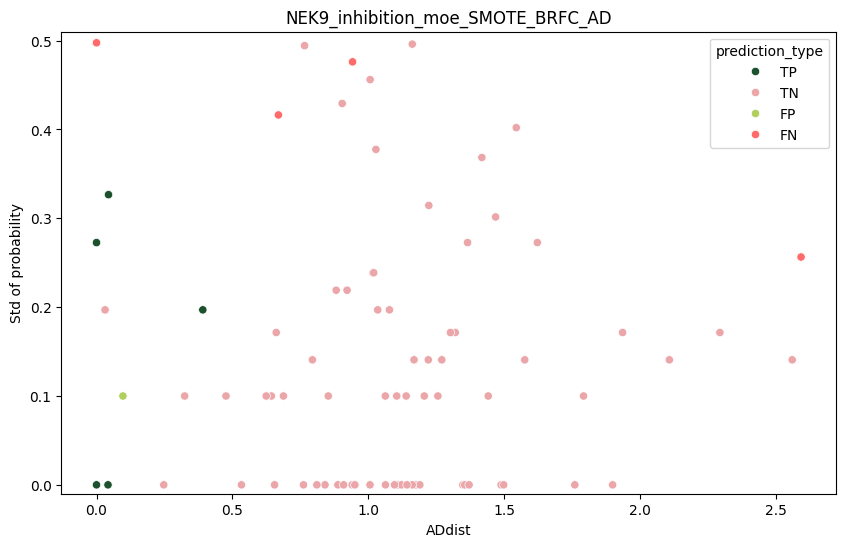

NEK9 moe SMOTE BRFC_BCW
(80,) (80,)


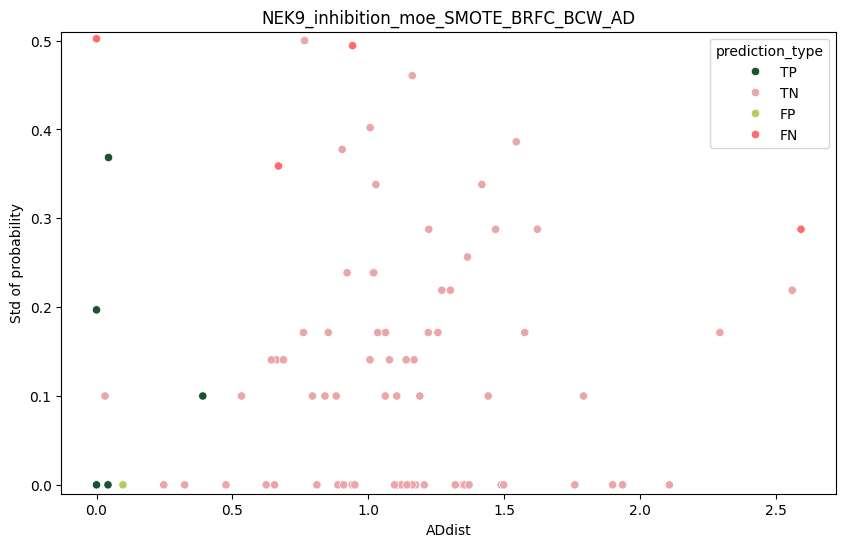

NEK9 moe ADASYN RF
(80,) (80,)


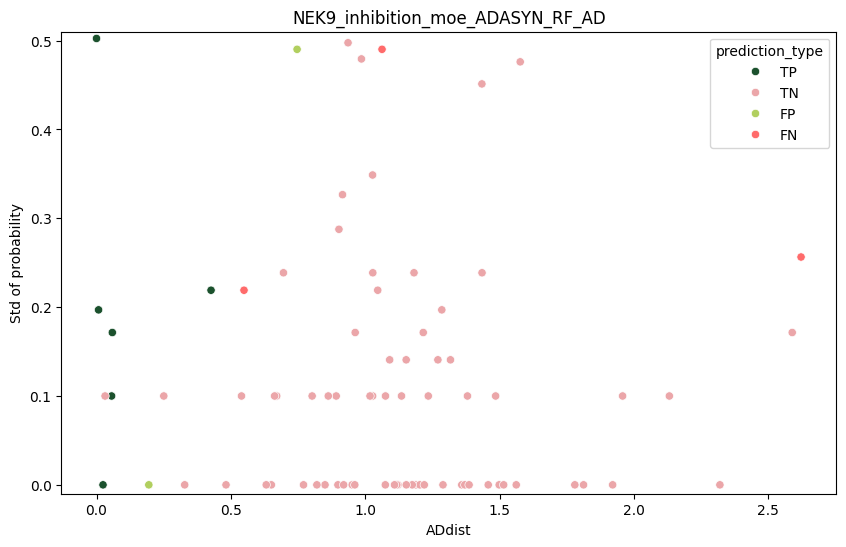

NEK9 moe ADASYN RF_BCW
(80,) (80,)


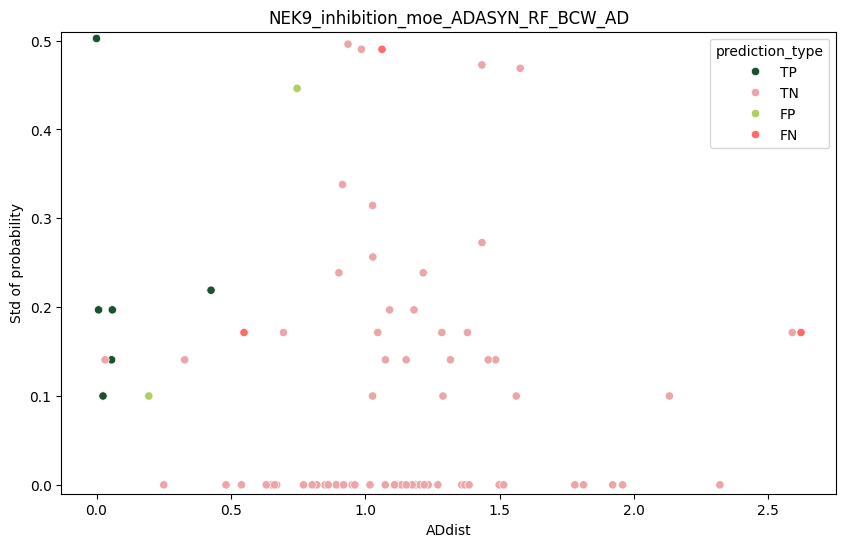

NEK9 moe ADASYN BRFC
(80,) (80,)


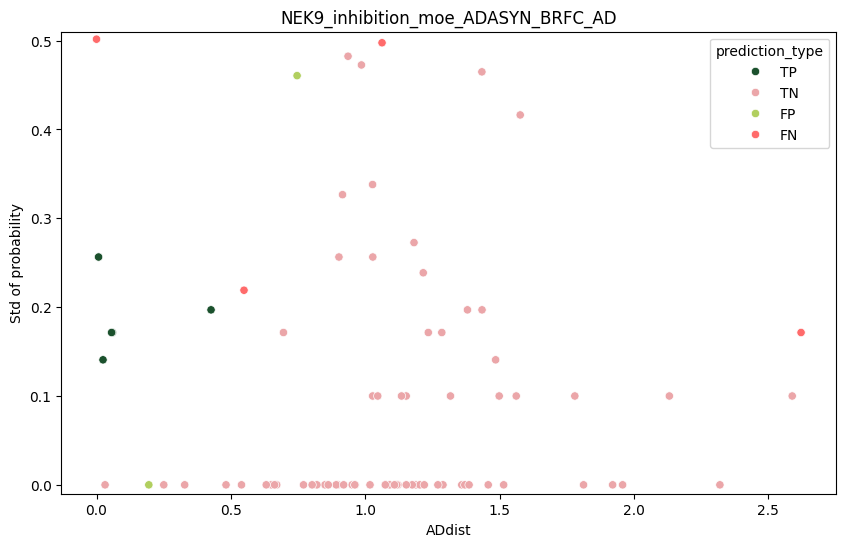

NEK9 moe ADASYN BRFC_BCW
(80,) (80,)


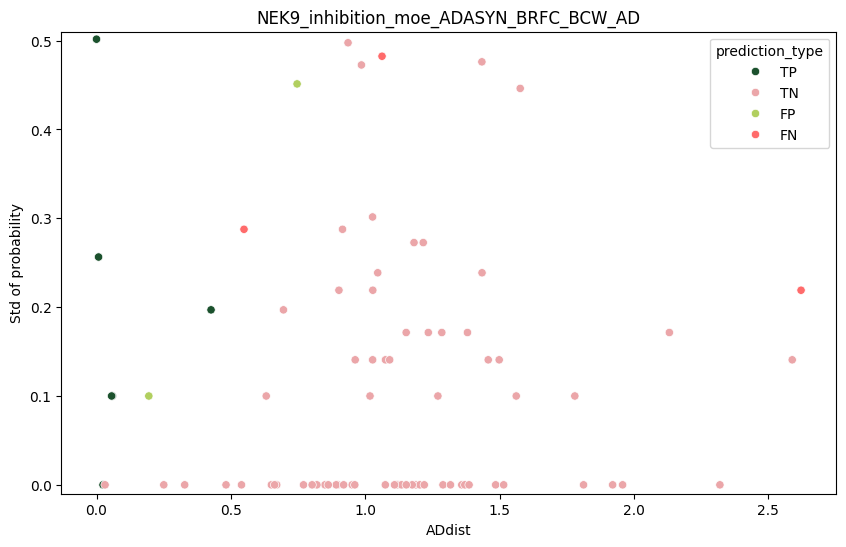

NEK9 mfp scaled RF
(80,) (80,)


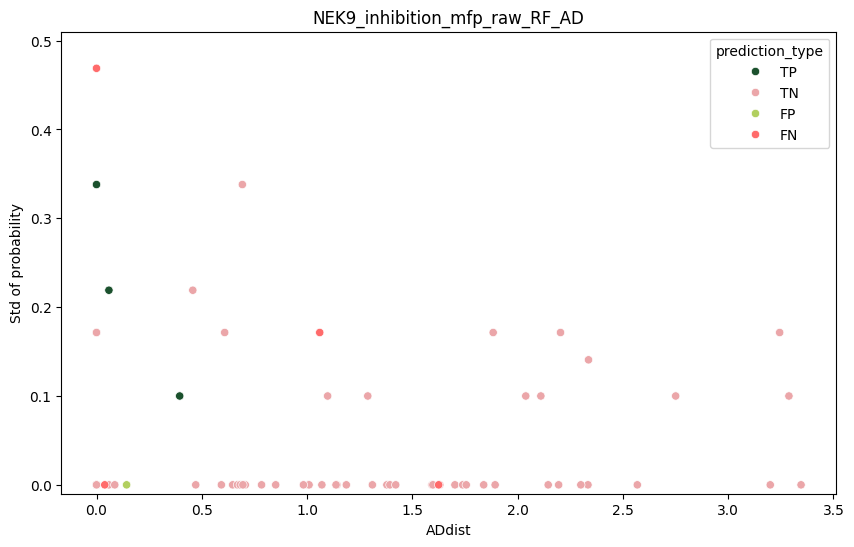

NEK9 mfp scaled RF_BCW
(80,) (80,)


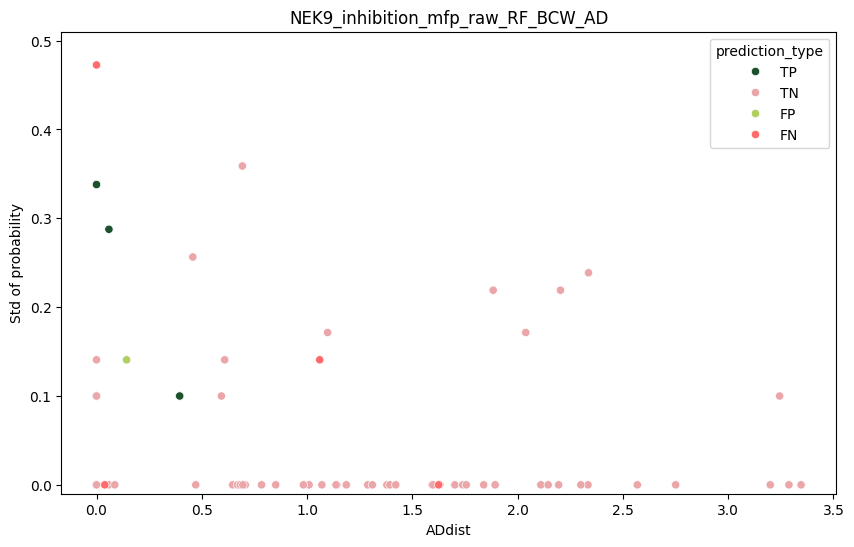

NEK9 mfp scaled BRFC
(80,) (80,)


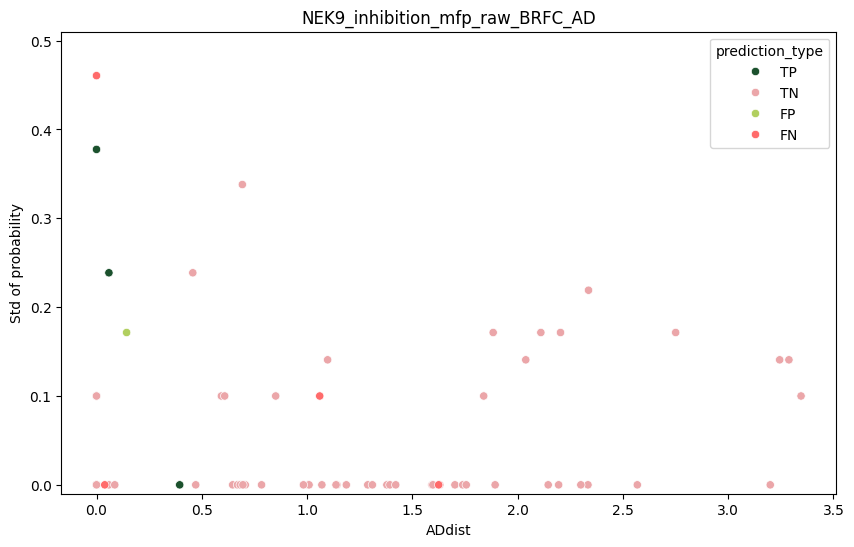

NEK9 mfp scaled BRFC_BCW
(80,) (80,)


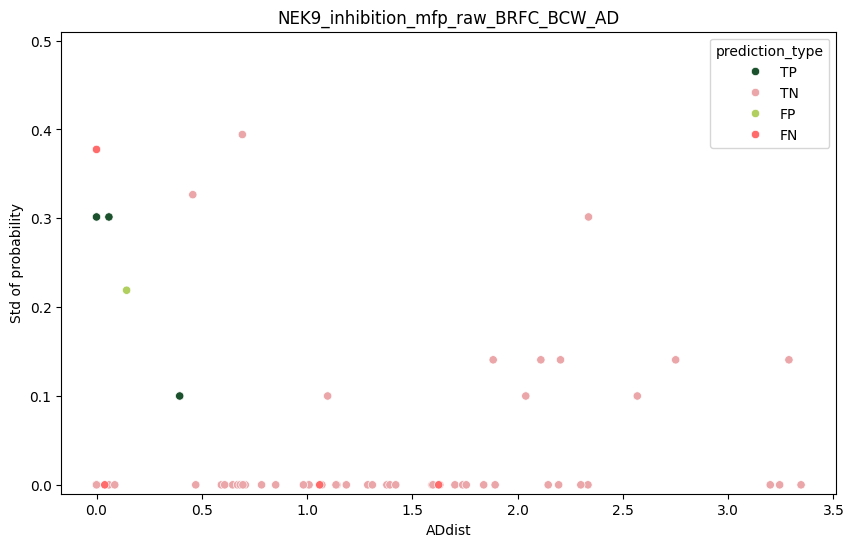

NEK9 mfp UNDER RF
(80,) (80,)


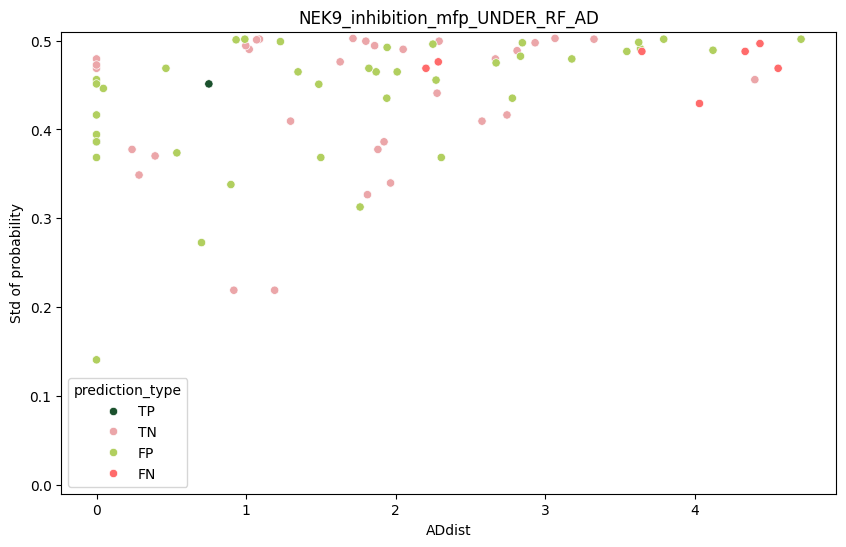

NEK9 mfp UNDER RF_BCW
(80,) (80,)


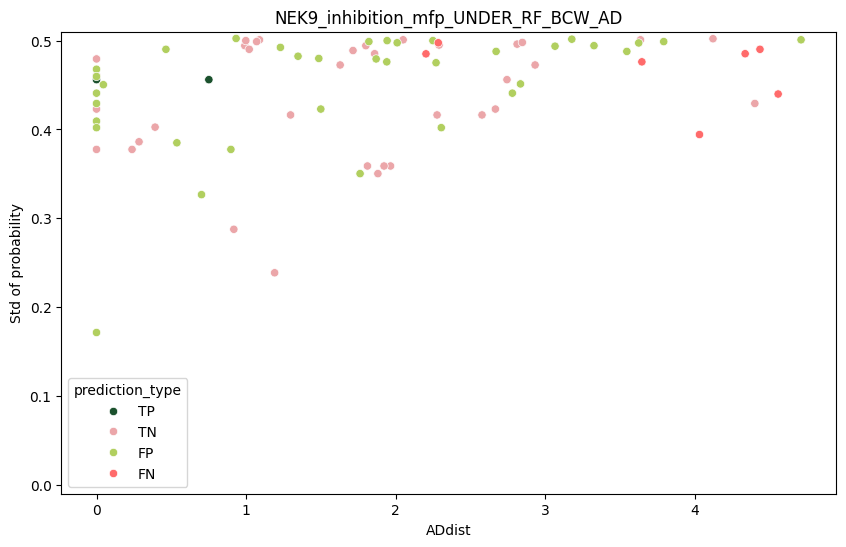

NEK9 mfp UNDER BRFC
(80,) (80,)


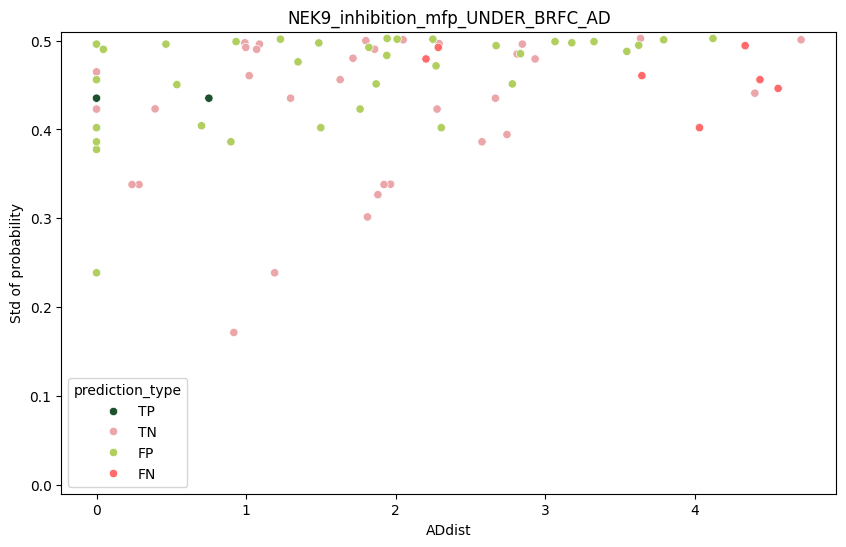

NEK9 mfp UNDER BRFC_BCW
(80,) (80,)


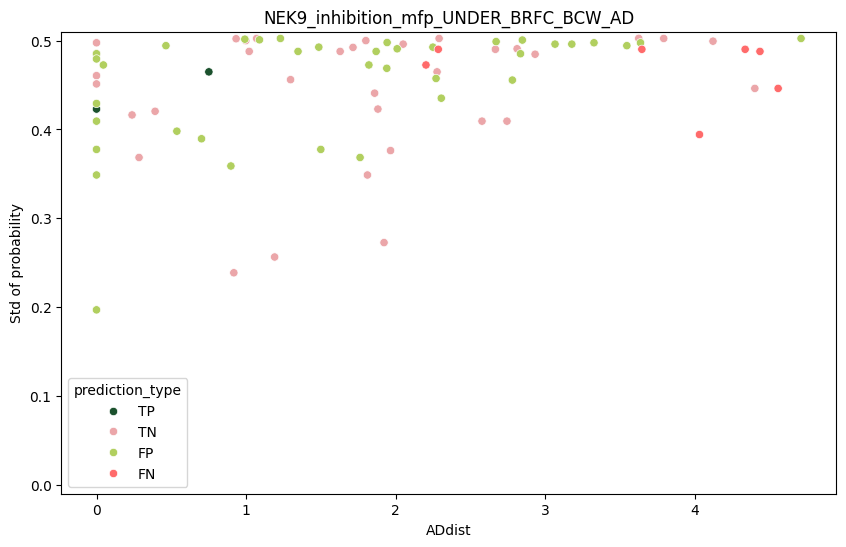

NEK9 mfp SMOTE RF
(80,) (80,)


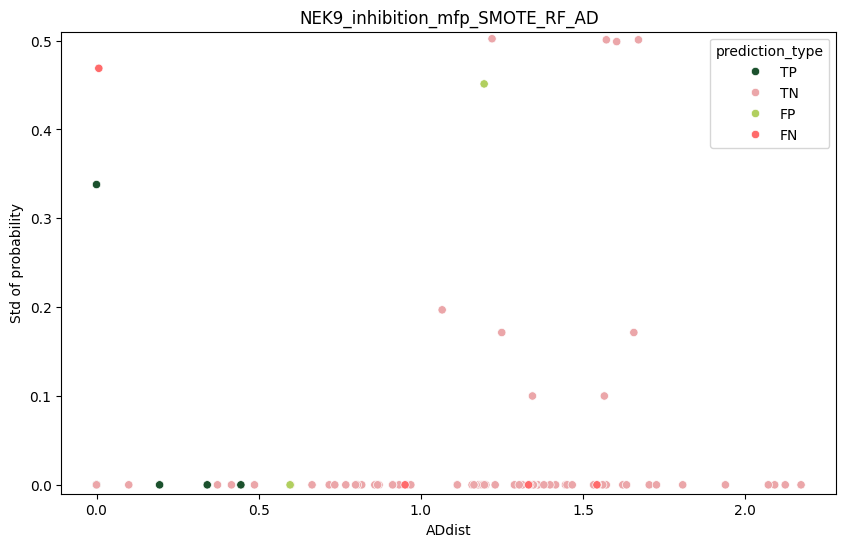

NEK9 mfp SMOTE RF_BCW
(80,) (80,)


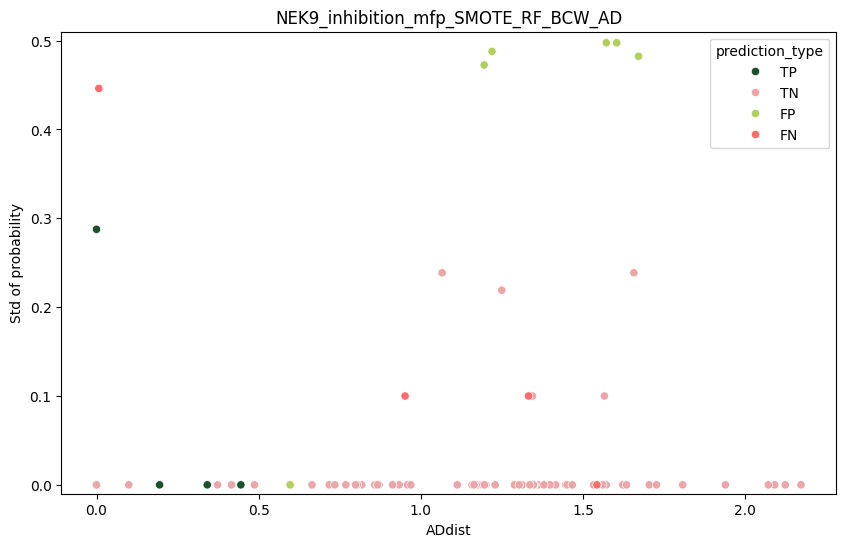

NEK9 mfp SMOTE BRFC
(80,) (80,)


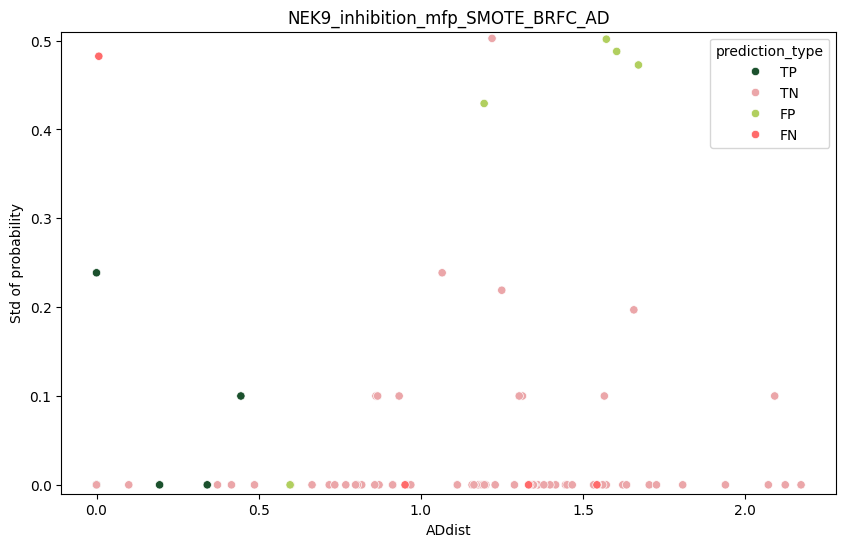

NEK9 mfp SMOTE BRFC_BCW
(80,) (80,)


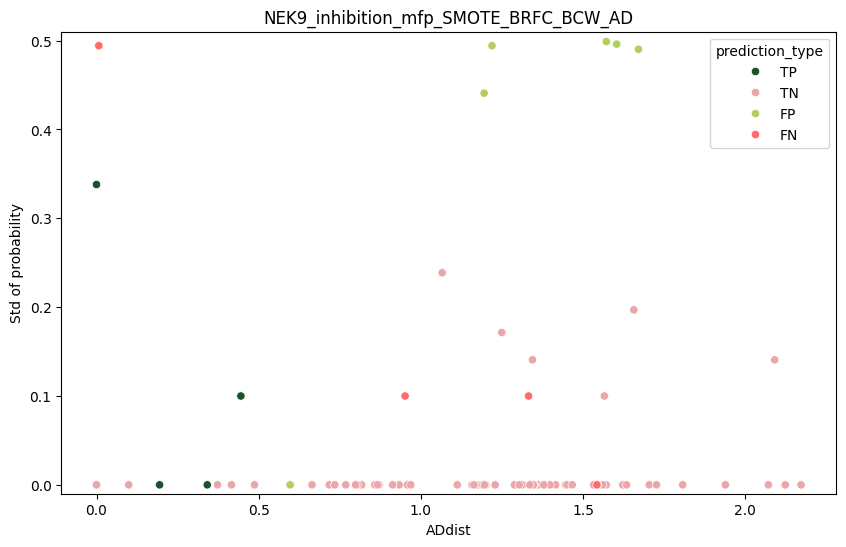

NEK9 mfp ADASYN RF
(80,) (80,)


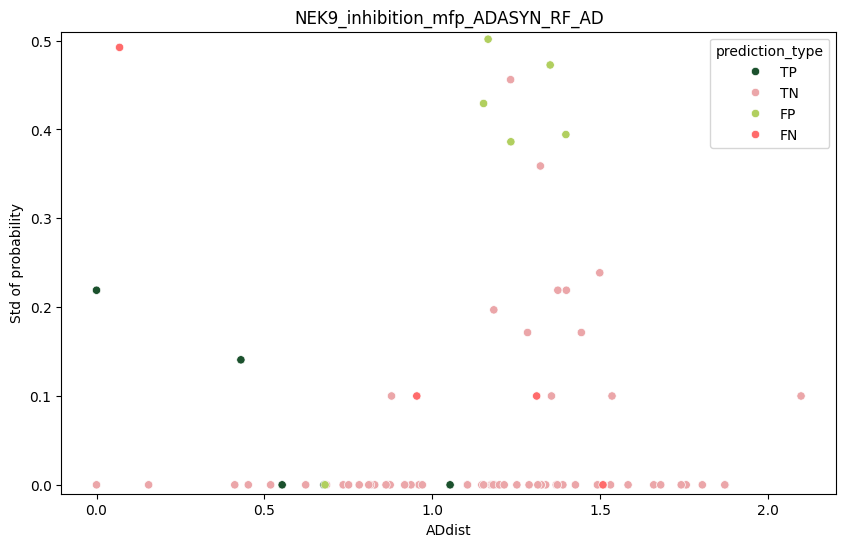

NEK9 mfp ADASYN RF_BCW
(80,) (80,)


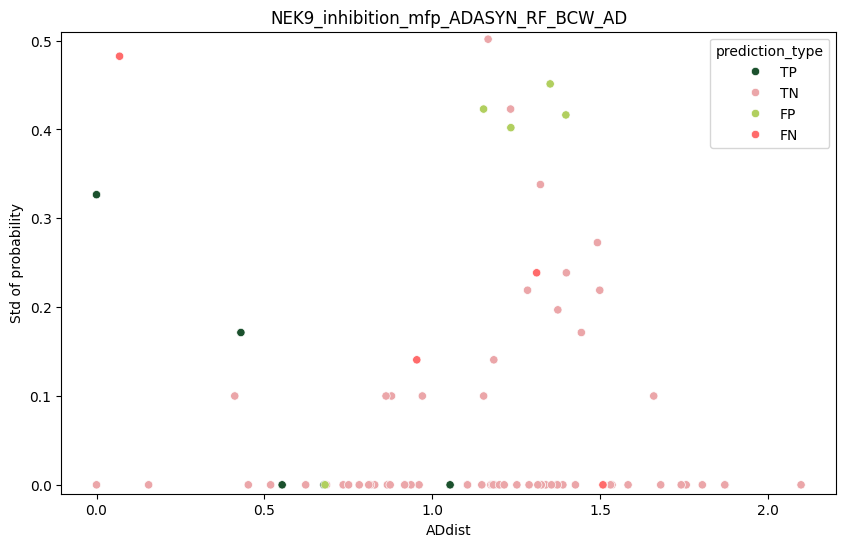

NEK9 mfp ADASYN BRFC
(80,) (80,)


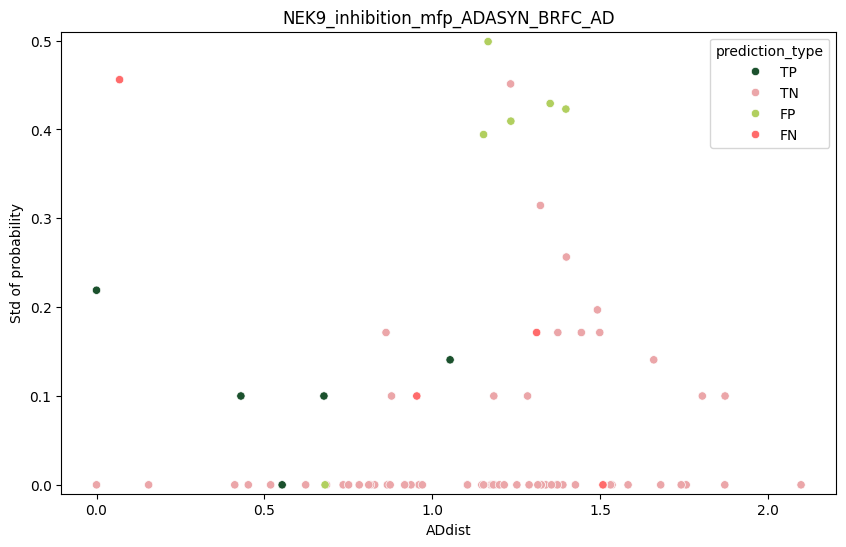

NEK9 mfp ADASYN BRFC_BCW
(80,) (80,)


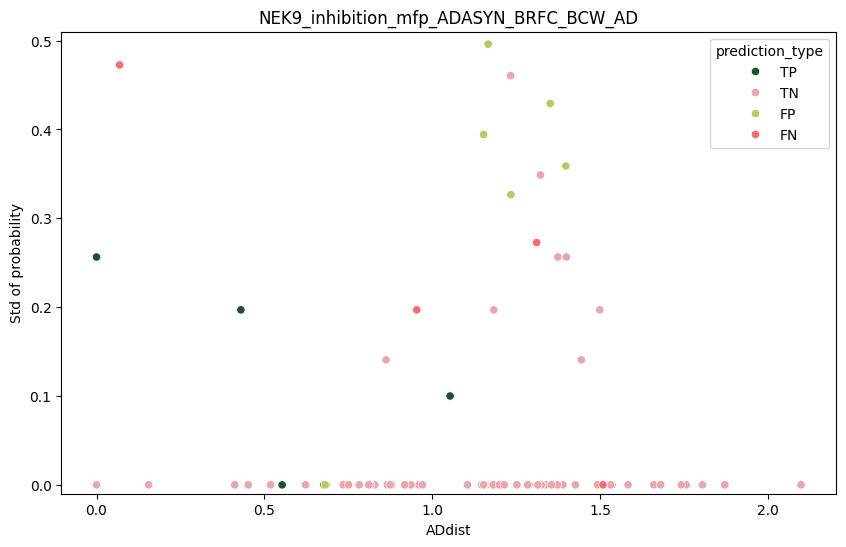

In [88]:

# figure_path3 = '/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/plots/AD/figures/AD_RFGS_std_prob/RF_GSindividual_std_prob_and_AD/' 
figure_path3 = '/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/plots/AD/figures/AD_RF_std_prob/scatter/' 
for nek in nek_list:
    for feat in feat_types: 
        for samp in samplings: 
            df_path = f'/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/NEK{nek}/bind/'
            full_df = pd.read_csv(f'{df_path}NEK{nek}_binding_{feat}_{samp}_df.csv') 
            train_df = full_df[full_df['subset'] == 'train'].select_dtypes(include=numerics).drop(columns=['active'])
            test_df = full_df[full_df['subset'] == 'test'].select_dtypes(include=numerics).drop(columns=['active'])
            test_dist = calc_AD_kmean_dist(train_df, test_df, k)
            train_dist = calc_AD_kmean_dist(train_df, train_df, k)
            
            for rf in RF_types:
                print(f'NEK{nek} {feat} {samp} {rf}')

                pred = pd.read_csv(f'{result_path}NEK{nek}_binding_{feat}_{samp}_{rf}_test.csv')
                stdprobs = pd.read_csv(f'{prob_path}NEK{nek}_binding_std_prob_{samp}_{rf}.csv')
                std0 = stdprobs[f'std0_{feat}'].to_numpy()
                std1= stdprobs[f'std1_{feat}'].to_numpy()
                preds = pred['prediction']

                df = pd.DataFrame({'prediction': preds, 'prediction_type':pred['prediction_type'], 'std0': std0, 'std1': std1, 'ADdist': test_dist})
                
                df['feat_type'] = feat
                if (samp=='scaled'): 
                    samp='raw'
                true_labels =pred['y'].to_numpy()
                # filename = f'NEK{nek}_binding_{feat}_{samp}_{rf}GS_AD_simple'
                filename = f'NEK{nek}_binding_{feat}_{samp}_{rf}_AD_scatter'
                # swarm_stdprob_AD_simple(preds.to_numpy(), true_labels,std1, std0, test_dist, f'NEK{nek}_binding_{feat}_{samp}_{rf}GS_AD',figure_path3, filename)
                RF_scatter_stdprob_AD_simple(preds.to_numpy(), true_labels,std1, std0, test_dist, f'NEK{nek}_binding_{feat}_{samp}_{rf}_AD', figure_path3, filename)
                
                if (samp=='raw'): 
                    samp='scaled'

# DO IT FOR INHIBITION
for nek in ['2','9']:
    for feat in feat_types: 
        for samp in samplings: 
            df_path = f'/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/NEK{nek}/inhib/'
            full_df = pd.read_csv(f'{df_path}NEK{nek}_inhibition_{feat}_{samp}_df.csv') 
            train_df = full_df[full_df['subset'] == 'train'].select_dtypes(include=numerics).drop(columns=['active'])
            test_df = full_df[full_df['subset'] == 'test'].select_dtypes(include=numerics).drop(columns=['active'])
            test_dist = calc_AD_kmean_dist(train_df, test_df, k)
            train_dist = calc_AD_kmean_dist(train_df, train_df, k)
            for rf in RF_types:
                print(f'NEK{nek} {feat} {samp} {rf}')

                pred = pd.read_csv(f'{result_path}NEK{nek}_inhibition_{feat}_{samp}_{rf}_test.csv')

                stdprobs = pd.read_csv(f'{prob_path}NEK{nek}_inhibition_std_prob_{samp}_{rf}.csv')
                std0 = stdprobs[f'std0_{feat}'].to_numpy()
                std1 = stdprobs[f'std1_{feat}'].to_numpy()
                preds = pred['prediction']
     
                true_labels =pred['y'].to_numpy()
                df = pd.DataFrame({'prediction': preds, 'category': pred['prediction_type'], 'std0': std0, 'std1': std1, 'ADdist': test_dist})
                df['feat_type'] = feat
                if (samp=='scaled'): 
                    samp='raw'
                filename = f'NEK{nek}_inhibition_{feat}_{samp}_{rf}_AD_scatter'
                RF_scatter_stdprob_AD_simple(preds.to_numpy(), true_labels,std1, std0, test_dist, f'NEK{nek}_inhibition_{feat}_{samp}_{rf}_AD',figure_path3, filename)
                if (samp=='raw'): 
                    samp='scaled'

# SUBPLOTS

In [80]:

def RF_scatter_stdprob_AD_sbuplots(df, title, ax):
    predictions = df['prediction']
    ad_dist=df['ADdist']
    true_pos = np.where((predictions == 1) & (true_labels == 1).flatten())[0] 
    true_neg = np.where((predictions == 0) & (true_labels == 0).flatten())[0]
    false_pos = np.where((predictions == 1) & (true_labels == 0).flatten())[0] 
    false_neg = np.where((predictions == 0) & (true_labels == 1).flatten())[0] 
    tp_std1 = std1[true_pos]
    tn_std0 = std0[true_neg]
    fp_std1 = std1[false_pos]
    fn_std1 = std1[false_neg]
    tp_ad = ad_dist[true_pos]
    tn_ad = ad_dist[true_neg]
    fp_ad = ad_dist[false_pos]
    fn_ad = ad_dist[false_neg]

    data = {'std of probabilities': np.concatenate([tp_std1,tn_std0,fp_std1, fn_std1]),
        'prediction_type': ['TP'] * len(true_pos) + ['TN'] * len(true_neg) + ['FP'] * len(false_pos) + ['FN'] * len(false_neg),
        'ADdist': np.concatenate([tp_ad, tn_ad, fp_ad,fn_ad]) 
    }
    data = pd.DataFrame(data)
    sizes = data['prediction_type'].map(pred_sizes)
    # markers=pred_markers, style='prediction_type'
    sns.scatterplot(data=data, x='ADdist', y='std of probabilities', hue='prediction_type', palette=pred_palette, ax=ax ,size=sizes)
    ax.set_title(title)
    ax.set_xlabel('ADdist')
    ax.set_ylabel('std of probability')
    ax.set_ylim(-0.01, 0.51)
    ax.get_legend().remove()



NEK2 moe scaled [271, 0, 12, 0]
NEK2 moe UNDER [191, 80, 6, 6]
NEK2 moe SMOTE [268, 3, 9, 3]
NEK2 moe ADASYN [267, 4, 7, 5]
NEK2 mfp scaled [270, 1, 9, 3]
NEK2 mfp UNDER [153, 118, 4, 8]
NEK2 mfp SMOTE [264, 7, 7, 5]
NEK2 mfp ADASYN [267, 4, 8, 4]
NEK2 bind RF


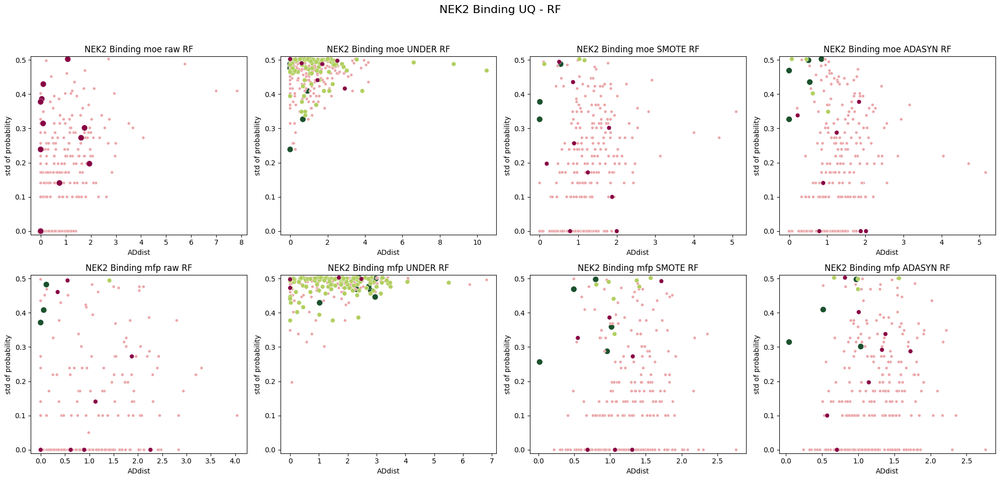

NEK3 moe scaled [262, 3, 17, 0]
NEK3 moe UNDER [135, 130, 3, 14]
NEK3 moe SMOTE [255, 10, 14, 3]
NEK3 moe ADASYN [253, 12, 14, 3]
NEK3 mfp scaled [262, 3, 12, 5]
NEK3 mfp UNDER [127, 138, 5, 12]
NEK3 mfp SMOTE [249, 16, 9, 8]
NEK3 mfp ADASYN [251, 14, 10, 7]
NEK3 bind RF


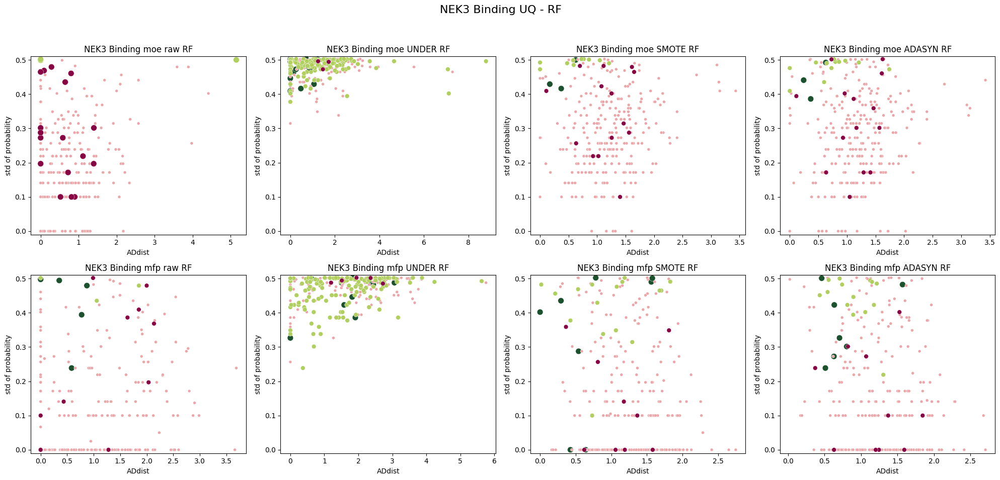

NEK5 moe scaled [228, 0, 14, 6]
NEK5 moe UNDER [161, 67, 3, 17]
NEK5 moe SMOTE [221, 7, 12, 8]
NEK5 moe ADASYN [221, 7, 12, 8]
NEK5 mfp scaled [225, 3, 10, 10]
NEK5 mfp UNDER [121, 107, 12, 8]
NEK5 mfp SMOTE [223, 5, 10, 10]
NEK5 mfp ADASYN [224, 4, 10, 10]
NEK5 bind RF


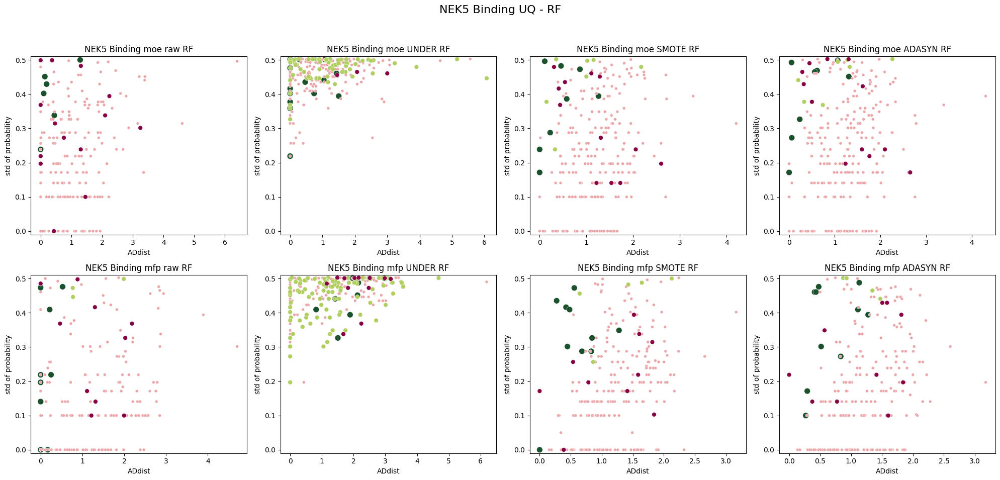

NEK9 moe scaled [270, 0, 13, 0]
NEK9 moe UNDER [177, 93, 4, 9]
NEK9 moe SMOTE [267, 3, 12, 1]
NEK9 moe ADASYN [267, 3, 12, 1]
NEK9 mfp scaled [268, 2, 12, 1]
NEK9 mfp UNDER [138, 132, 6, 7]
NEK9 mfp SMOTE [266, 4, 10, 3]
NEK9 mfp ADASYN [268, 2, 10, 3]
NEK9 bind RF


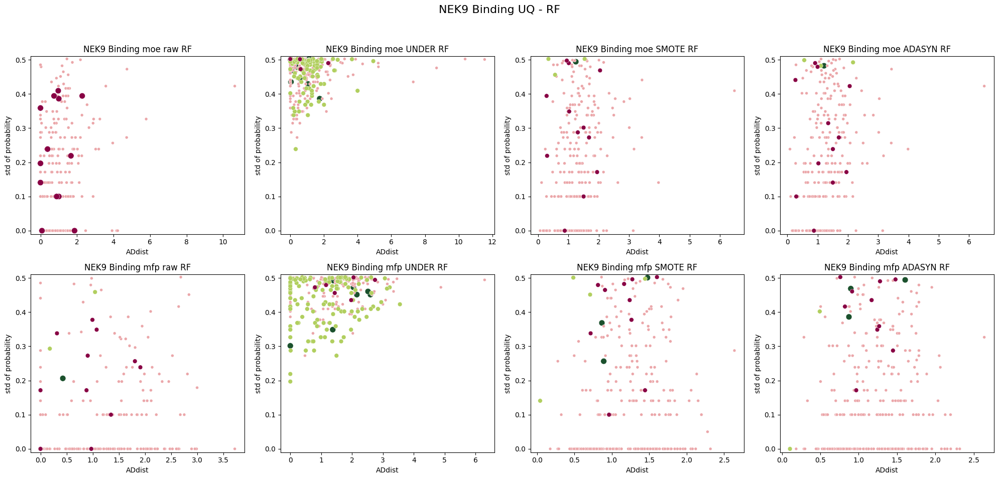

NEK2 moe scaled [271, 0, 11, 1]
NEK2 moe UNDER [201, 70, 6, 6]
NEK2 moe SMOTE [271, 0, 9, 3]
NEK2 moe ADASYN [266, 5, 7, 5]
NEK2 mfp scaled [270, 1, 9, 3]
NEK2 mfp UNDER [160, 111, 4, 8]
NEK2 mfp SMOTE [265, 6, 7, 5]
NEK2 mfp ADASYN [268, 3, 8, 4]
NEK2 bind RF_BCW


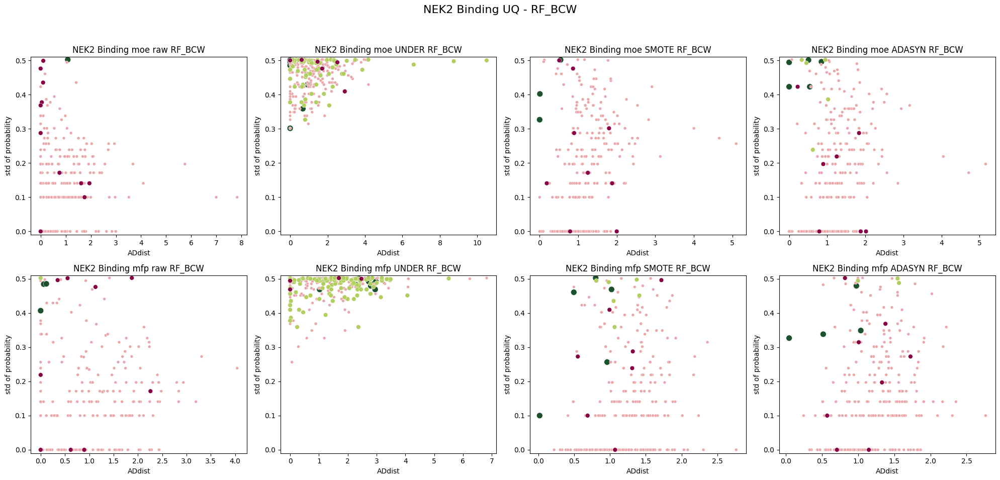

NEK3 moe scaled [265, 0, 16, 1]
NEK3 moe UNDER [135, 130, 4, 13]
NEK3 moe SMOTE [257, 8, 15, 2]
NEK3 moe ADASYN [253, 12, 14, 3]
NEK3 mfp scaled [259, 6, 13, 4]
NEK3 mfp UNDER [135, 130, 5, 12]
NEK3 mfp SMOTE [248, 17, 9, 8]
NEK3 mfp ADASYN [248, 17, 10, 7]
NEK3 bind RF_BCW


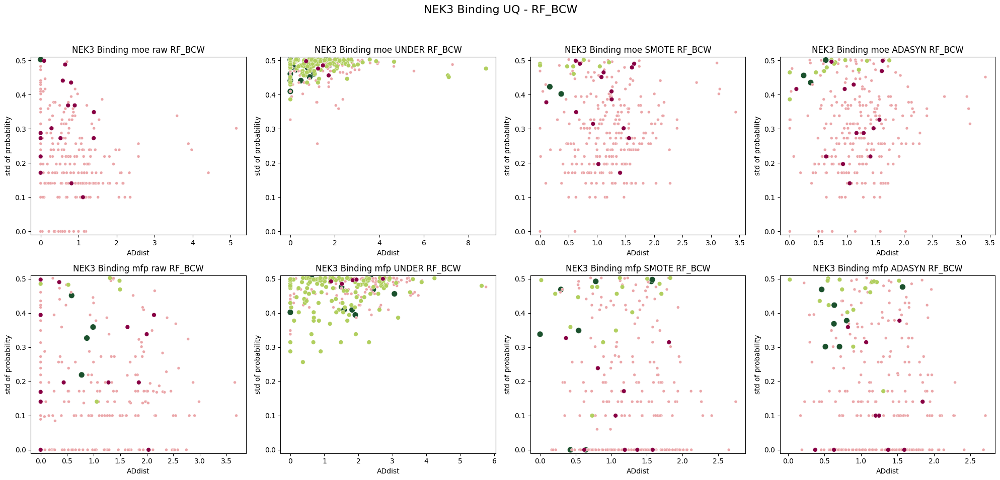

NEK5 moe scaled [228, 0, 16, 4]
NEK5 moe UNDER [167, 61, 4, 16]
NEK5 moe SMOTE [223, 5, 12, 8]
NEK5 moe ADASYN [220, 8, 12, 8]
NEK5 mfp scaled [223, 5, 10, 10]
NEK5 mfp UNDER [115, 113, 8, 12]
NEK5 mfp SMOTE [223, 5, 10, 10]
NEK5 mfp ADASYN [224, 4, 10, 10]
NEK5 bind RF_BCW


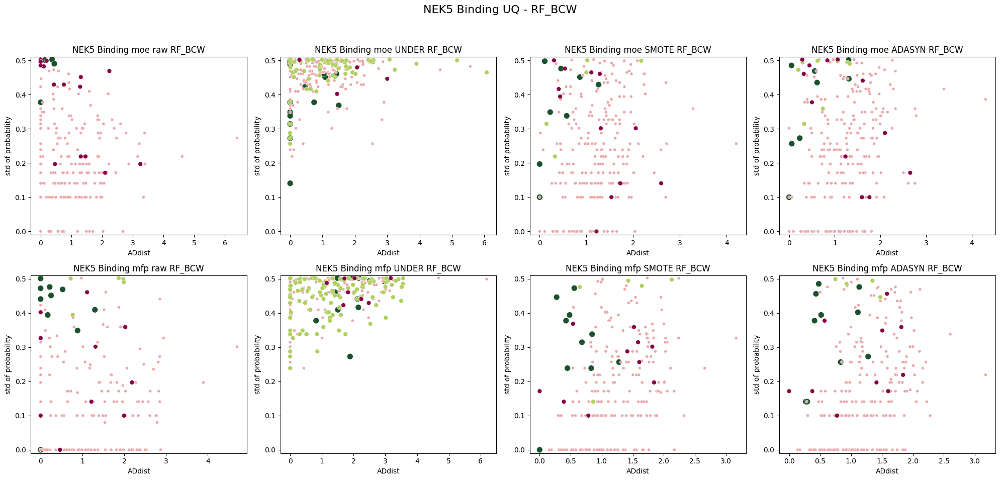

NEK9 moe scaled [270, 0, 13, 0]
NEK9 moe UNDER [184, 86, 6, 7]
NEK9 moe SMOTE [267, 3, 12, 1]
NEK9 moe ADASYN [267, 3, 12, 1]
NEK9 mfp scaled [267, 3, 9, 4]
NEK9 mfp UNDER [142, 128, 4, 9]
NEK9 mfp SMOTE [264, 6, 9, 4]
NEK9 mfp ADASYN [266, 4, 10, 3]
NEK9 bind RF_BCW


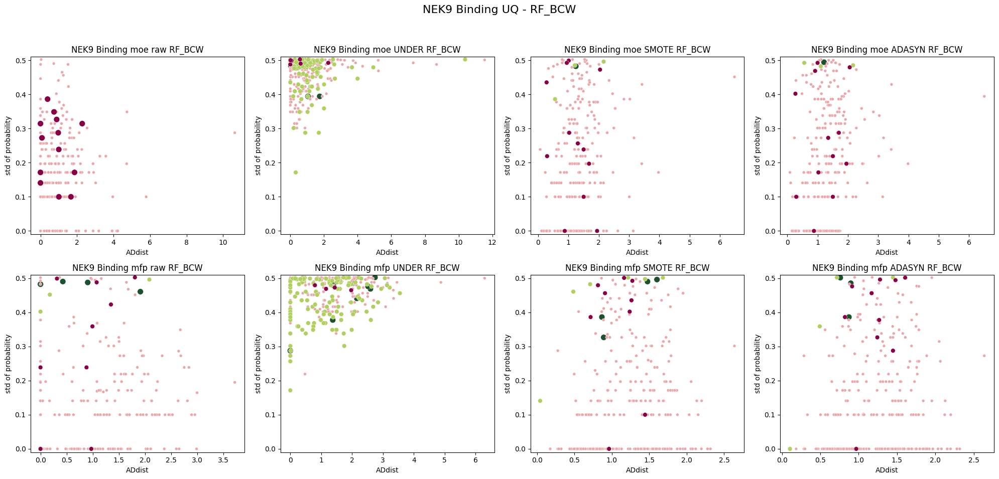

NEK2 moe scaled [204, 67, 5, 7]
NEK2 moe UNDER [198, 73, 5, 7]
NEK2 moe SMOTE [270, 1, 9, 3]
NEK2 moe ADASYN [266, 5, 9, 3]
NEK2 mfp scaled [224, 47, 5, 7]
NEK2 mfp UNDER [151, 120, 4, 8]
NEK2 mfp SMOTE [264, 7, 7, 5]
NEK2 mfp ADASYN [266, 5, 8, 4]
NEK2 bind BRFC


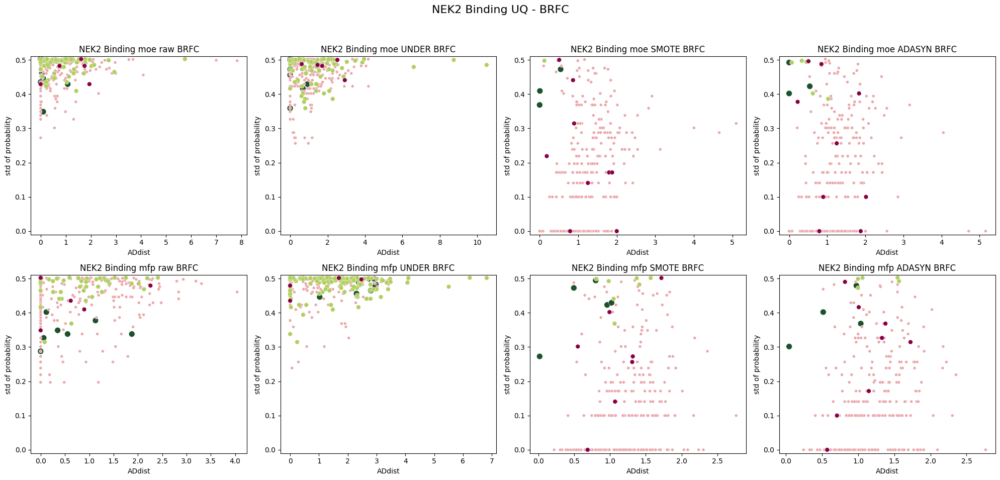

NEK3 moe scaled [161, 104, 5, 12]
NEK3 moe UNDER [141, 124, 3, 14]
NEK3 moe SMOTE [256, 9, 15, 2]
NEK3 moe ADASYN [255, 10, 14, 3]
NEK3 mfp scaled [209, 56, 7, 10]
NEK3 mfp UNDER [132, 133, 6, 11]
NEK3 mfp SMOTE [247, 18, 9, 8]
NEK3 mfp ADASYN [248, 17, 10, 7]
NEK3 bind BRFC


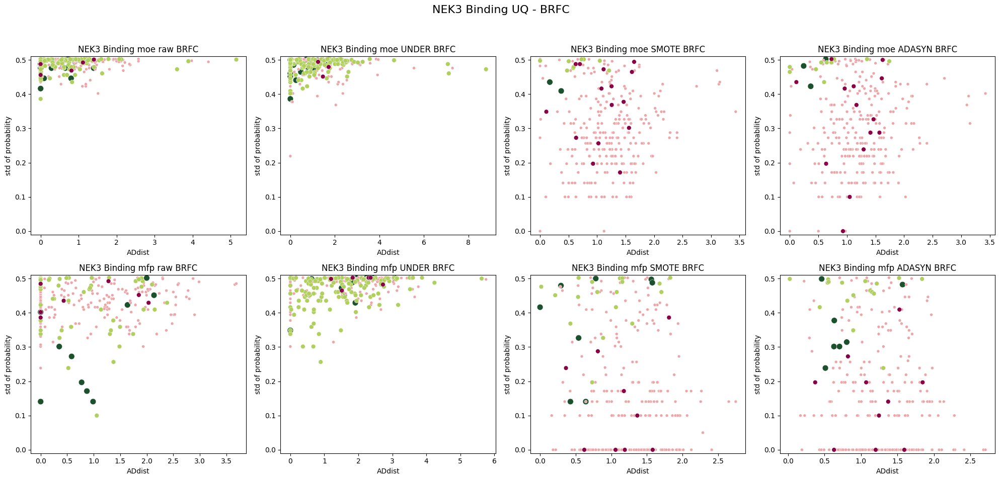

NEK5 moe scaled [171, 57, 5, 15]
NEK5 moe UNDER [163, 65, 3, 17]
NEK5 moe SMOTE [222, 6, 12, 8]
NEK5 moe ADASYN [221, 7, 11, 9]
NEK5 mfp scaled [194, 34, 4, 16]
NEK5 mfp UNDER [121, 107, 9, 11]
NEK5 mfp SMOTE [222, 6, 10, 10]
NEK5 mfp ADASYN [224, 4, 10, 10]
NEK5 bind BRFC


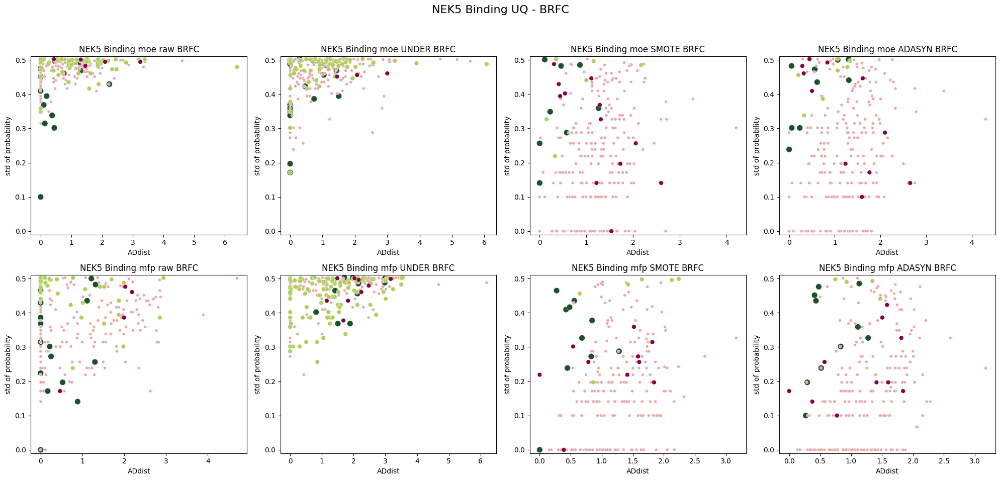

NEK9 moe scaled [187, 83, 6, 7]
NEK9 moe UNDER [180, 90, 5, 8]
NEK9 moe SMOTE [267, 3, 12, 1]
NEK9 moe ADASYN [267, 3, 12, 1]
NEK9 mfp scaled [214, 56, 3, 10]
NEK9 mfp UNDER [143, 127, 6, 7]
NEK9 mfp SMOTE [265, 5, 9, 4]
NEK9 mfp ADASYN [267, 3, 9, 4]
NEK9 bind BRFC


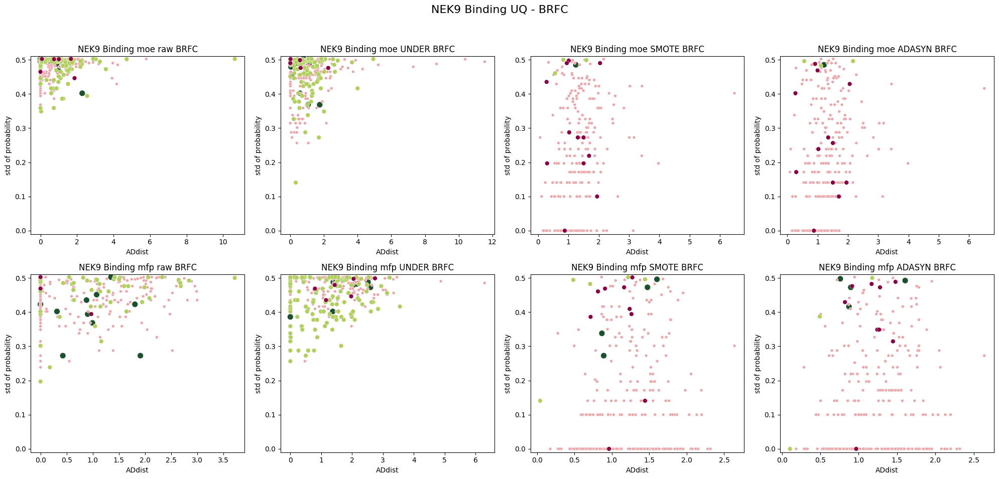

NEK2 moe scaled [203, 68, 5, 7]
NEK2 moe UNDER [201, 70, 5, 7]


In [ ]:
RF_types = ['RF', 'RF_BCW', 'BRFC', 'BRFC_BCW']
figure_path4 = '/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/plots/AD/figures/AD_RF_std_prob/scatter/subplots/'
for this_rf in RF_types: 
    for nek in nek_list:
        fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))
        fig.suptitle(f'NEK{nek} Binding UQ - {this_rf}', fontsize=16)
        
        for i, feat in enumerate(feat_types): 
            for j, samp in enumerate(samplings):
                ax = axes[i, j]
                
                df_path = f'/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/NEK{nek}/bind/'
                full_df = pd.read_csv(f'{df_path}NEK{nek}_binding_{feat}_{samp}_df.csv')
                train_df = full_df[full_df['subset'] == 'train'].select_dtypes(include=numerics).drop(columns=['active'])
                test_df = full_df[full_df['subset'] == 'test'].select_dtypes(include=numerics).drop(columns=['active'])
                test_dist = calc_AD_kmean_dist(train_df, test_df, k)
                train_dist = calc_AD_kmean_dist(train_df, train_df, k)

                pred = pd.read_csv(f'{result_path}NEK{nek}_binding_{feat}_{samp}_{this_rf}_test.csv')
                stdprobs = pd.read_csv(f'{prob_path}NEK{nek}_binding_std_prob_{samp}_{this_rf}.csv')
                std0 = stdprobs[f'std0_{feat}'].to_numpy()
                std1 = stdprobs[f'std1_{feat}'].to_numpy()
                preds = pred['prediction']
                print(f"NEK{nek} {feat} {samp} {pred['cm'][0]}")
                # display(pred)
    
                df = pd.DataFrame({'prediction': preds, 'prediction_type': pred['prediction_type'], 'std0': std0, 'std1': std1, 'ADdist': test_dist})
                df['feat_type'] = feat
    
                if samp == 'scaled':
                    samp = 'raw'
                true_labels = pred['y'].to_numpy()

                RF_scatter_stdprob_AD_sbuplots(df, f'NEK{nek} Binding {feat} {samp} {this_rf}', ax)

                if samp == 'raw':
                    samp = 'scaled'
                
        print(f'NEK{nek} bind {this_rf}') 
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        fig.savefig(f'{figure_path4}NEK{nek}_binding_{this_rf}_UQ_AD.png' ,bbox_inches='tight')
        
        plt.show(); 

# Inhibition 

In [ ]:
RF_types = ['RF', 'RF_BCW', 'BRFC', 'BRFC_BCW']
figure_path4 = '/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/plots/AD/figures/AD_RF_std_prob/scatter/subplots/'
for this_rf in RF_types: 
    for nek in ['2', '9']:
        fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))
        fig.suptitle(f'NEK{nek} Inhibition UQ - {this_rf}', fontsize=16)
        
        for i, feat in enumerate(feat_types): 
            for j, samp in enumerate(samplings):
                ax = axes[i, j]
                
                df_path = f'/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/NEK{nek}/inhib/'
                full_df = pd.read_csv(f'{df_path}NEK{nek}_inhibition_{feat}_{samp}_df.csv')
                train_df = full_df[full_df['subset'] == 'train'].select_dtypes(include=numerics).drop(columns=['active'])
                test_df = full_df[full_df['subset'] == 'test'].select_dtypes(include=numerics).drop(columns=['active'])
                test_dist = calc_AD_kmean_dist(train_df, test_df, k)
                train_dist = calc_AD_kmean_dist(train_df, train_df, k)
                
    
                pred = pd.read_csv(f'{result_path}NEK{nek}_inhibition_{feat}_{samp}_{this_rf}_test.csv')
                stdprobs = pd.read_csv(f'{prob_path}NEK{nek}_inhibition_std_prob_{samp}_{this_rf}.csv')
                std0 = stdprobs[f'std0_{feat}'].to_numpy()
                std1 = stdprobs[f'std1_{feat}'].to_numpy()
                preds = pred['prediction']
                print(f"NEK{nek} {feat} {samp} {pred['cm'][0]}")
    
                df = pd.DataFrame({'prediction': preds, 'prediction_type': pred['prediction_type'], 'std0': std0, 'std1': std1, 'ADdist': test_dist})
                df['feat_type'] = feat
    
                if samp == 'scaled':
                    samp = 'raw'
                true_labels = pred['y'].to_numpy()

                RF_scatter_stdprob_AD_sbuplots(df, f'NEK{nek} Inhibition {feat} {samp} {this_rf}', ax)

                if samp == 'raw':
                    samp = 'scaled'
                
        print(f'NEK{nek} inhibition {this_rf}') 
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        fig.savefig(f'{figure_path4}NEK{nek}_inhibition_{this_rf}_UQ_AD.png' ,bbox_inches='tight')
        
        plt.show(); 

In [9]:
import os
nek_nums = [2, 3, 5, 9]


NEK = 'NEK'

html_content = """
<!DOCTYPE html>
<html>
<head>
<style>
img {
    max-width: 100%;
    height: auto;
}
</style>
</head>
<body>

<h2>NEK RF Model UQ (std of probabilities and AD)</h2>

"""

for n in nek_nums:
    nek = str(n)
    nek_path = '/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/plots/AD/figures/AD_RF_std_prob/scatter/subplots/'
    html_content += f'<h3>NEK{nek}</h3>'

    if os.path.exists(nek_path):
        for file in os.listdir(nek_path):
            if file.startswith('NEK'+nek):
                img_path = os.path.join(nek_path, file)
                html_content += f'<img src="{img_path}" alt="{file}">\n'
    
    html_content += '<br>\n'
    html_content +='NEK'+nek

html_content += """
</body>
</html>
"""

print(html_content)

with open('NEK_RF_UQ_scatter_plots.html', 'w') as f:
    f.write(html_content)



<!DOCTYPE html>
<html>
<head>
<style>
img {
    max-width: 100%;
    height: auto;
}
</style>
</head>
<body>

<h2>NEK RF Model UQ (std of probabilities and AD)</h2>

<h3>NEK2</h3><img src="/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/plots/AD/figures/AD_RF_std_prob/scatter/subplots/NEK2_inhibition_BRFC_BCW_UQ_AD.png" alt="NEK2_inhibition_BRFC_BCW_UQ_AD.png">
<img src="/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/plots/AD/figures/AD_RF_std_prob/scatter/subplots/NEK2_binding_RF_UQ_AD.png" alt="NEK2_binding_RF_UQ_AD.png">
<img src="/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/plots/AD/figures/AD_RF_std_prob/scatter/subplots/NEK2_inhibition_RF_BCW_UQ_AD.png" alt="NEK2_inhibition_RF_BCW_UQ_AD.png">
<img src="/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/plots/AD/figures/AD_RF_std_prob/scatter/subplots/NEK2_inhibition_BRFC_UQ_AD.png" alt="NEK2_inhibition_BRFC_UQ_AD.png">
<img src="/Users/jayceepang/msse/capstone/atom

In [84]:
def RF_stdprob_AD_scatter_moemfp(df, true_labels, title=None, figure_path=None, filename=None): 
    moe_df = df[df['feat_type'] == 'moe'] 
    mfp_df = df[df['feat_type'] == 'mfp']
    moe_pred = moe_df['prediction'].to_numpy()
    mfp_pred = mfp_df['prediction'].to_numpy()
    
    ad_dist = moe_df['ADdist']

    moe_tp = np.where((moe_pred == 1) & (true_labels == 1))[0] 
    moe_tn = np.where((moe_pred == 0) & (true_labels == 0))[0]
    moe_fp = np.where((moe_pred == 1) & (true_labels == 0))[0] 
    moe_fn = np.where((moe_pred == 0) & (true_labels == 1))[0] 

    moe_std0 = moe_df['std0']
    moe_std1 = moe_df['std1'] 
    moe_tp_std1 = moe_std1[moe_tp]
    moe_tn_std0 = moe_std0[moe_tn]
    moe_fp_std1 = moe_std1[moe_fp]
    moe_fn_std1 = moe_std1[moe_fn]
    moe_tp_ad = ad_dist[moe_tp]
    moe_tn_ad = ad_dist[moe_tn]
    moe_fp_ad = ad_dist[moe_fp]
    moe_fn_ad = ad_dist[moe_fn]

    mfp_tp = np.where((mfp_pred == 1) & (true_labels == 1))[0] 
    mfp_tn = np.where((mfp_pred == 0) & (true_labels == 0))[0]
    mfp_fp = np.where((mfp_pred == 1) & (true_labels == 0))[0] 
    mfp_fn = np.where((mfp_pred == 0) & (true_labels == 1))[0] 
    mfp_std0 = mfp_df['std0']
    mfp_std1 = mfp_df['std1'] 
    mfp_tp_std1 = mfp_std1[mfp_tp]
    mfp_tn_std0 = mfp_std0[mfp_tn]
    mfp_fp_std1 = mfp_std1[mfp_fp]
    mfp_fn_std1 = mfp_std1[mfp_fn]
    mfp_tp_ad = ad_dist[mfp_tp]
    mfp_tn_ad = ad_dist[mfp_tn]
    mfp_fp_ad = ad_dist[mfp_fp]
    mfp_fn_ad = ad_dist[mfp_fn]

    data_moe = {
        'std of probabilities': np.concatenate([moe_tp_std1, moe_tn_std0, moe_fp_std1, moe_fn_std1]),
        'prediction_type': ['TP']*len(moe_tp) + ['TN']*len(moe_tn) + ['FP']*len(moe_fp) + ['FN']*len(moe_fn),
        'ADdist': np.concatenate([moe_tp_ad, moe_tn_ad, moe_fp_ad, moe_fn_ad]),
        'feat_type': ['moe']*len(moe_tp_std1) + ['moe']*len(moe_tn_std0) + ['moe']*len(moe_fp_std1) + ['moe']*len(moe_fn_std1)
    }
    df1 = pd.DataFrame(data_moe) 

    data_mfp = {
        'std of probabilities': np.concatenate([mfp_tp_std1, mfp_tn_std0, mfp_fp_std1, mfp_fn_std1]),
        'prediction_type': ['TP']*len(mfp_tp) + ['TN']*len(mfp_tn) + ['FP']*len(mfp_fp) + ['FN']*len(mfp_fn),
        'ADdist': np.concatenate([mfp_tp_ad, mfp_tn_ad, mfp_fp_ad, mfp_fn_ad]),
        'feat_type': ['mfp']*len(mfp_tp_std1) + ['mfp']*len(mfp_tn_std0) + ['mfp']*len(mfp_fp_std1) + ['mfp']*len(mfp_fn_std1)
    }
    df2 = pd.DataFrame(data_mfp) 

    combined_df = pd.concat([df1, df2], axis=0)
    
    plt.figure(figsize=(10, 6))

    markers = {'moe': 'o', 'mfp': '^'}
    sns.scatterplot(data=combined_df, x='ADdist', y='std of probabilities', hue='prediction_type', style='feat_type', markers=markers, s=100)

    plt.ylim(-0.01, 0.55)
    plt.title(title)
    plt.xlabel('ADdist')
    plt.ylabel('Probability std')
    plt.legend(title='Prediction Type')
    plt.tight_layout()

    if filename is not None: 
        plt.savefig(f'{figure_path}{filename}.png', bbox_inches='tight')
    plt.show()


NEK2 scaled RF


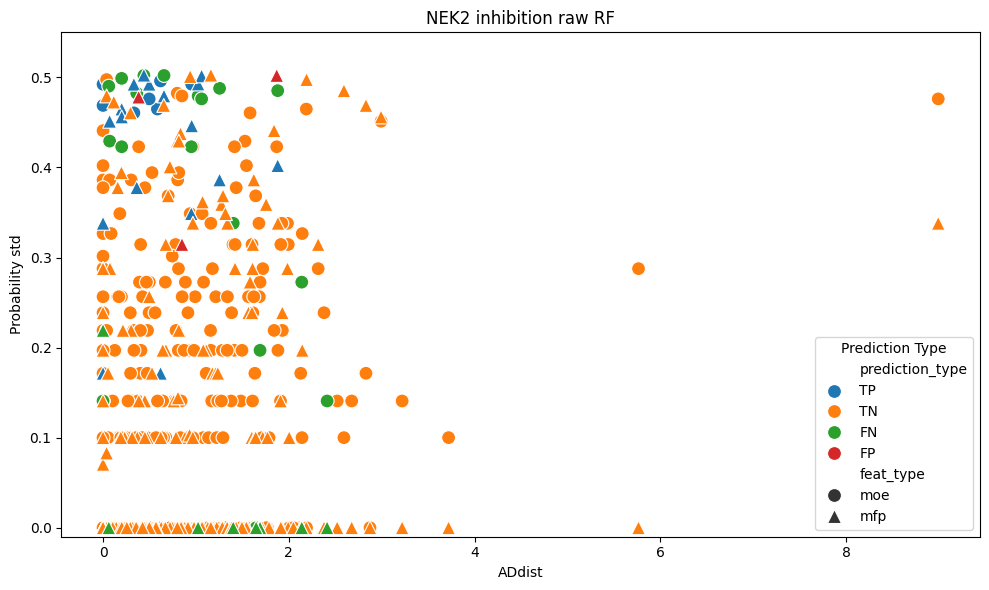

NEK2 scaled RF_BCW


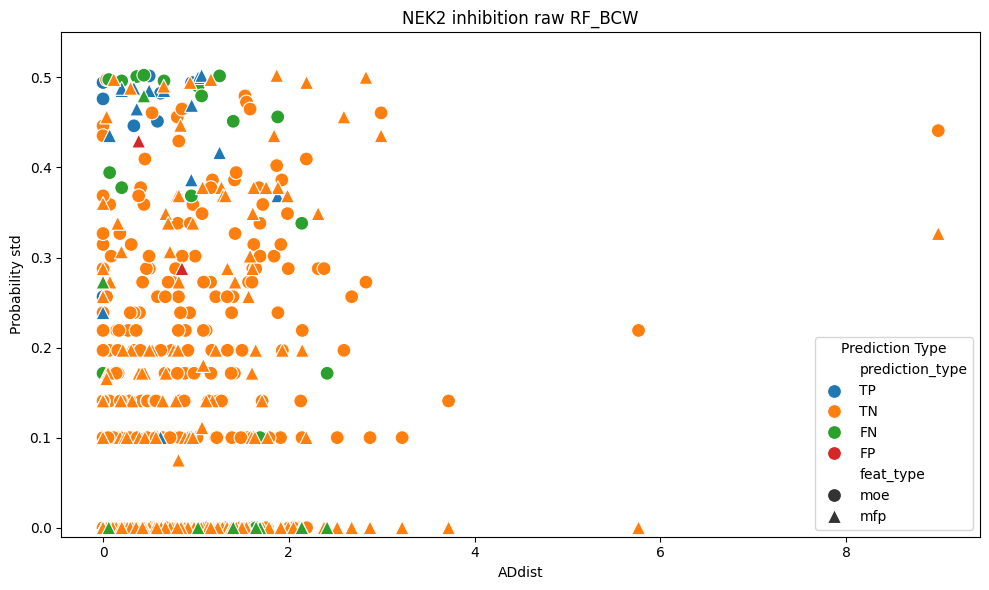

NEK2 scaled BRFC


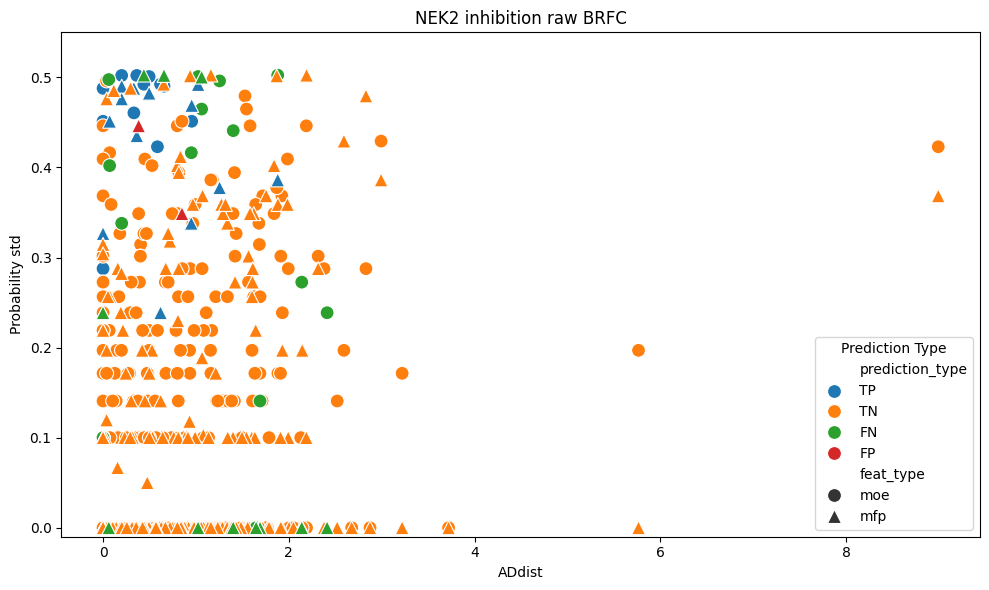

NEK2 scaled BRFC_BCW


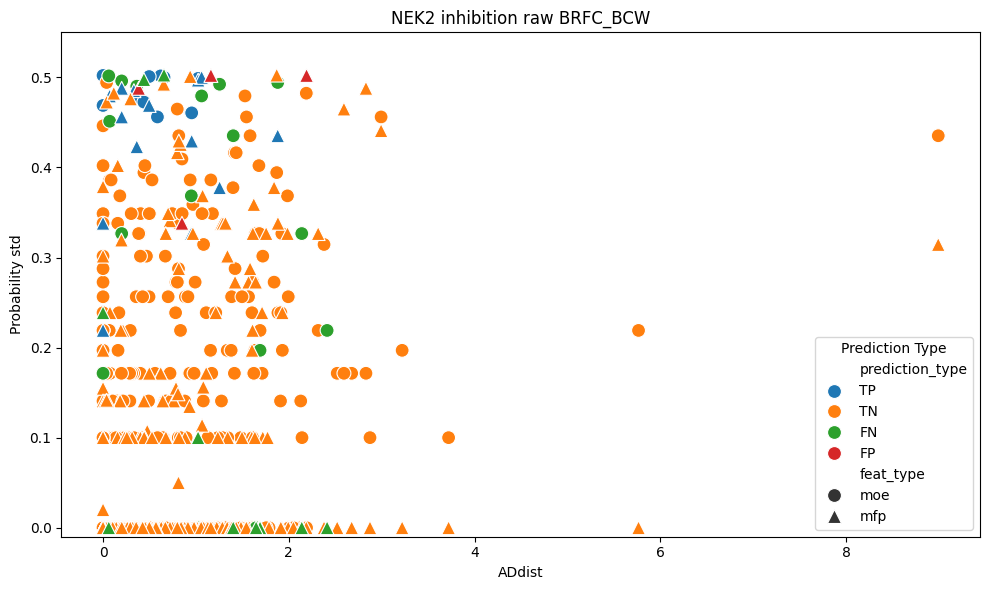

NEK2 UNDER RF


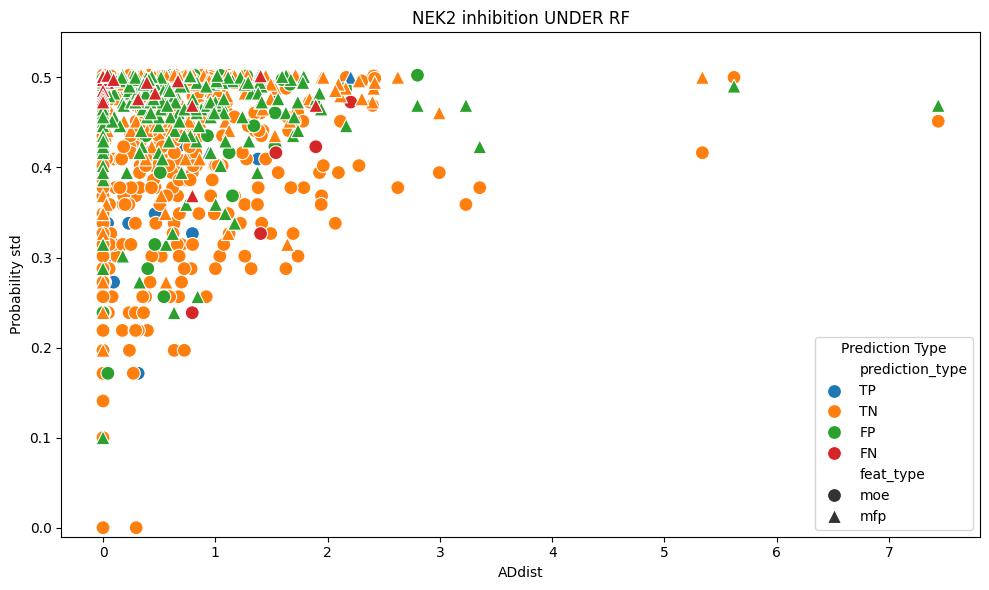

NEK2 UNDER RF_BCW


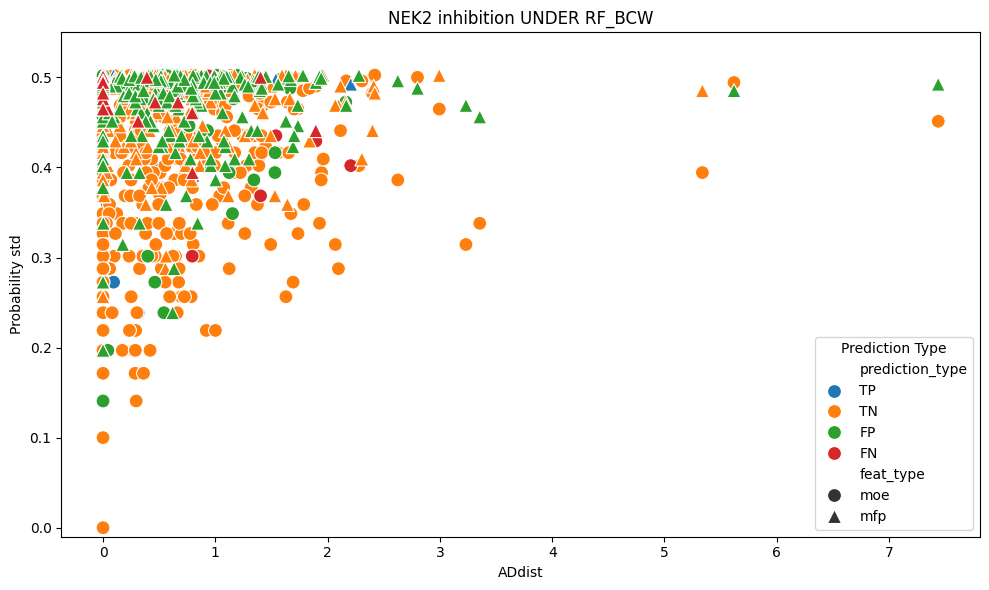

NEK2 UNDER BRFC


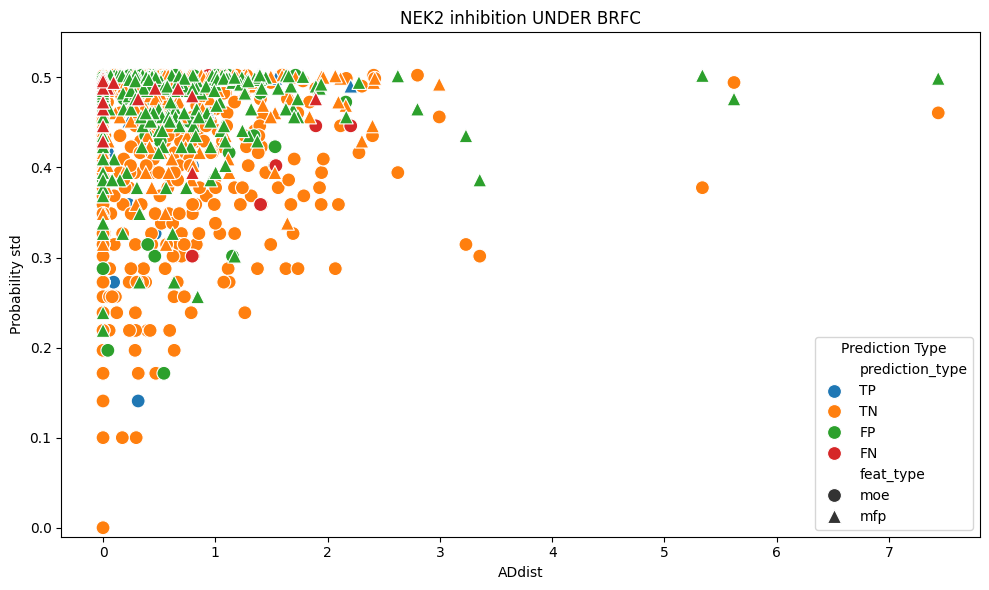

NEK2 UNDER BRFC_BCW


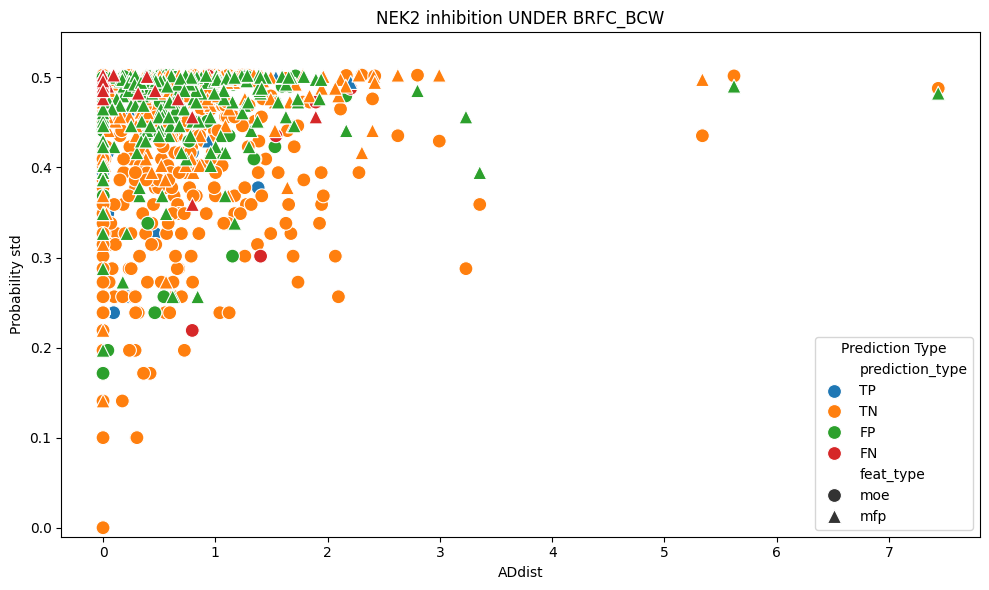

NEK2 SMOTE RF


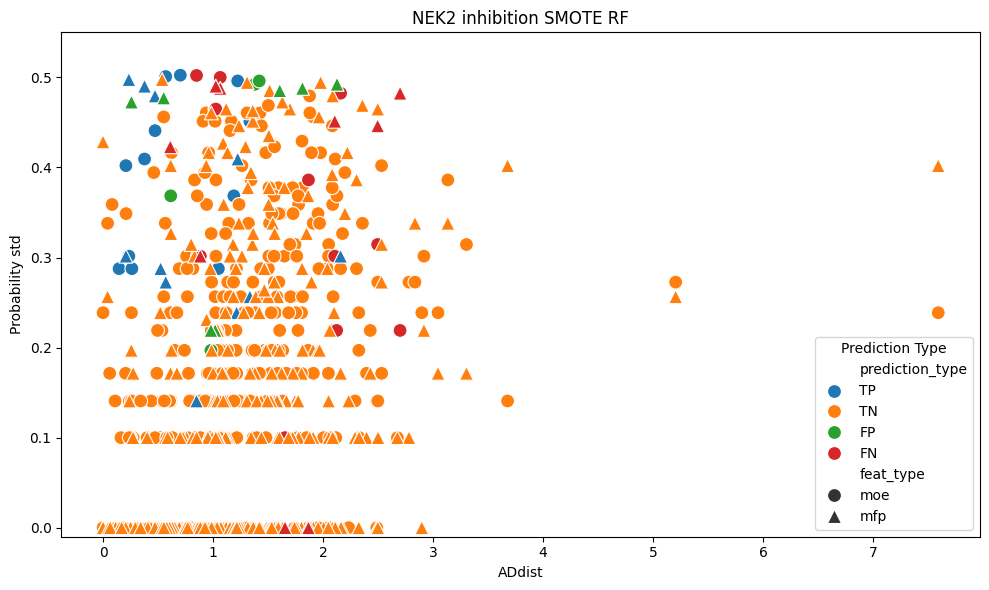

NEK2 SMOTE RF_BCW


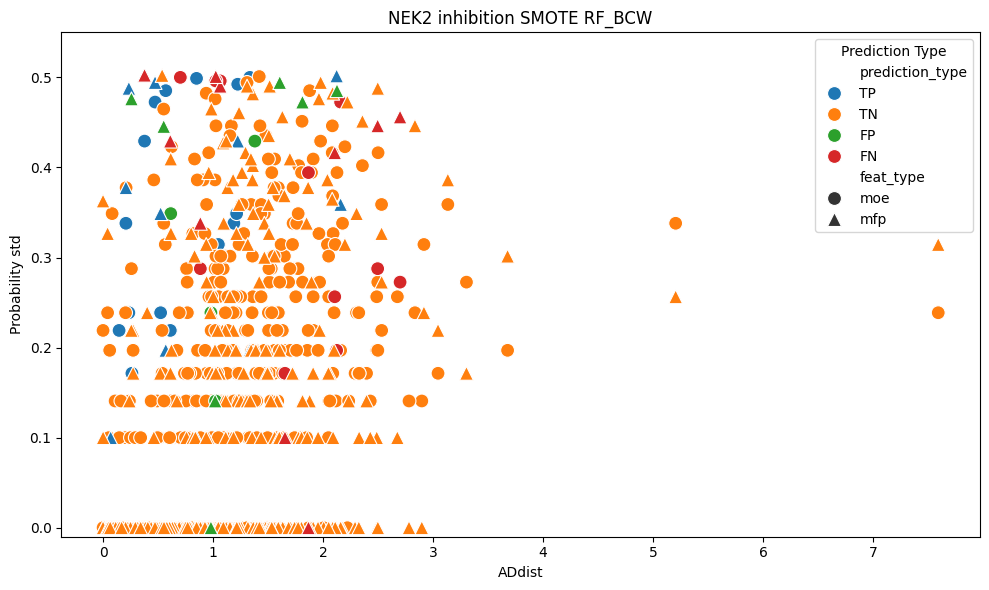

NEK2 SMOTE BRFC


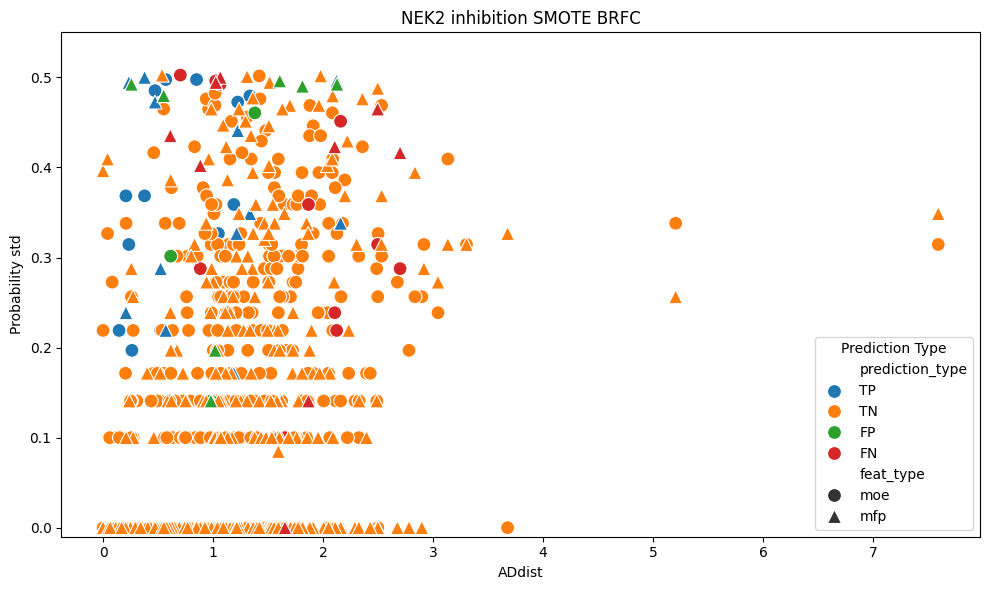

NEK2 SMOTE BRFC_BCW


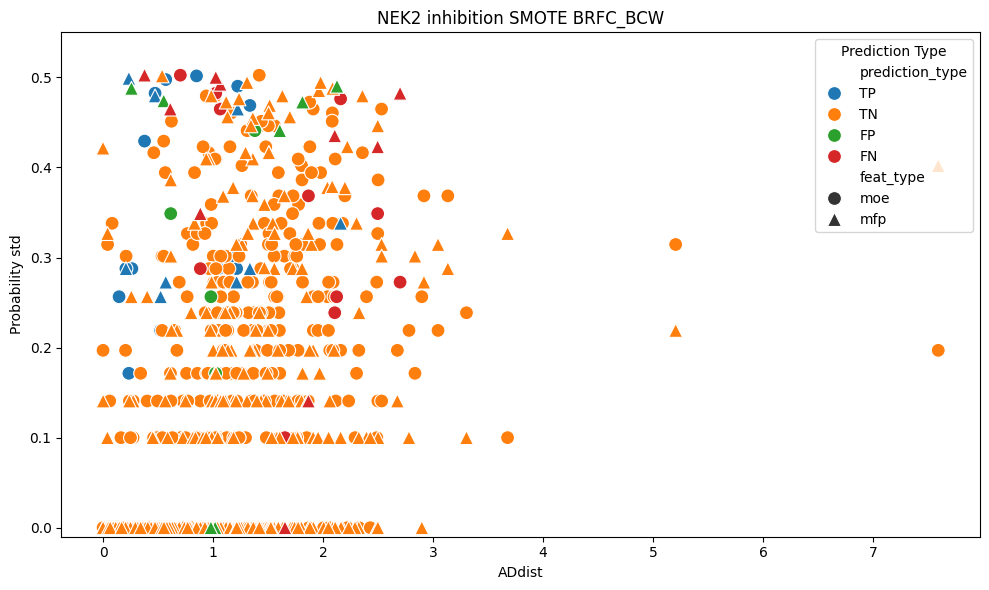

NEK2 ADASYN RF


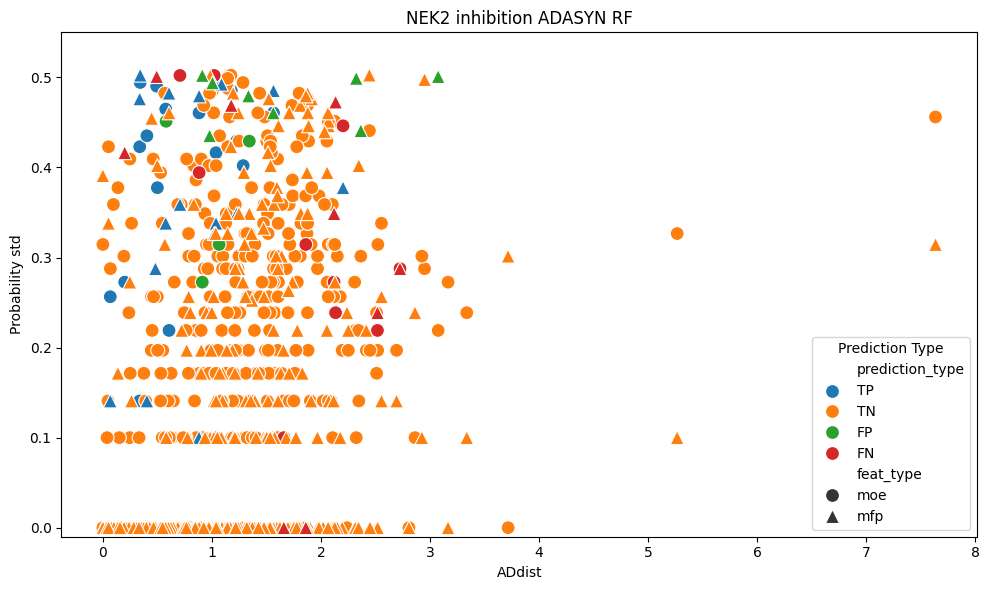

NEK2 ADASYN RF_BCW


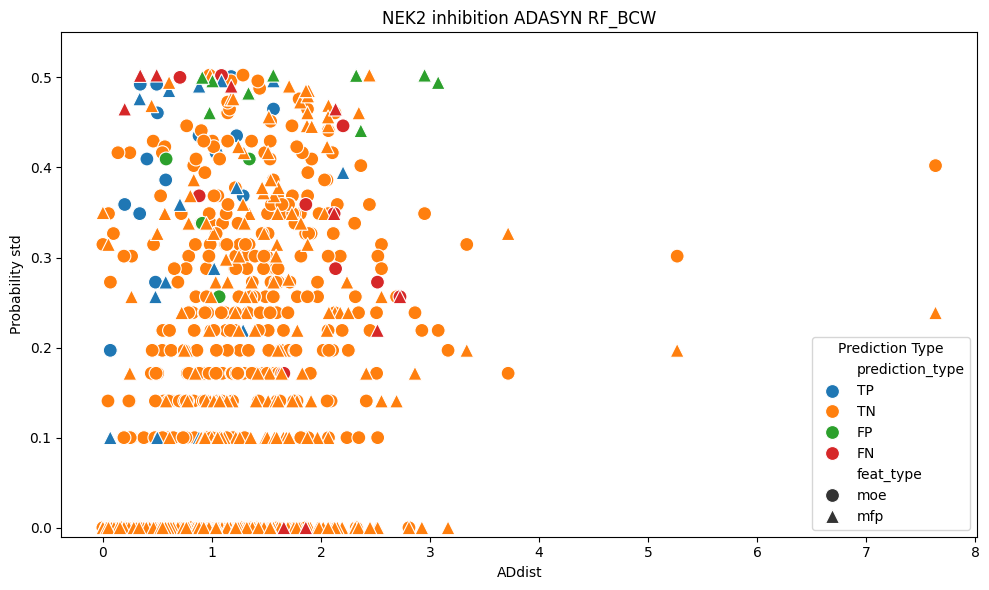

NEK2 ADASYN BRFC


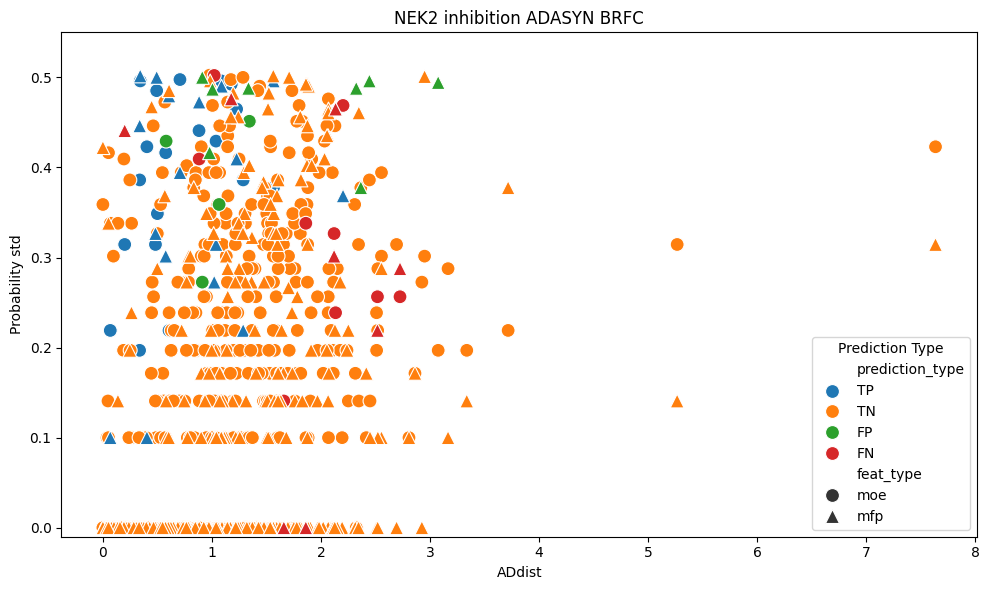

NEK2 ADASYN BRFC_BCW


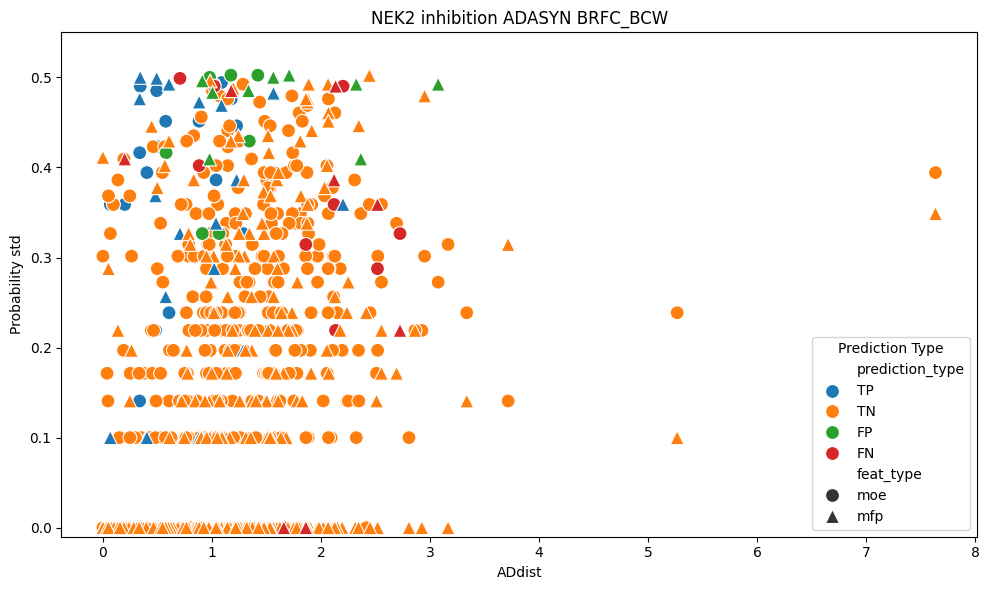

NEK2 scaled RF


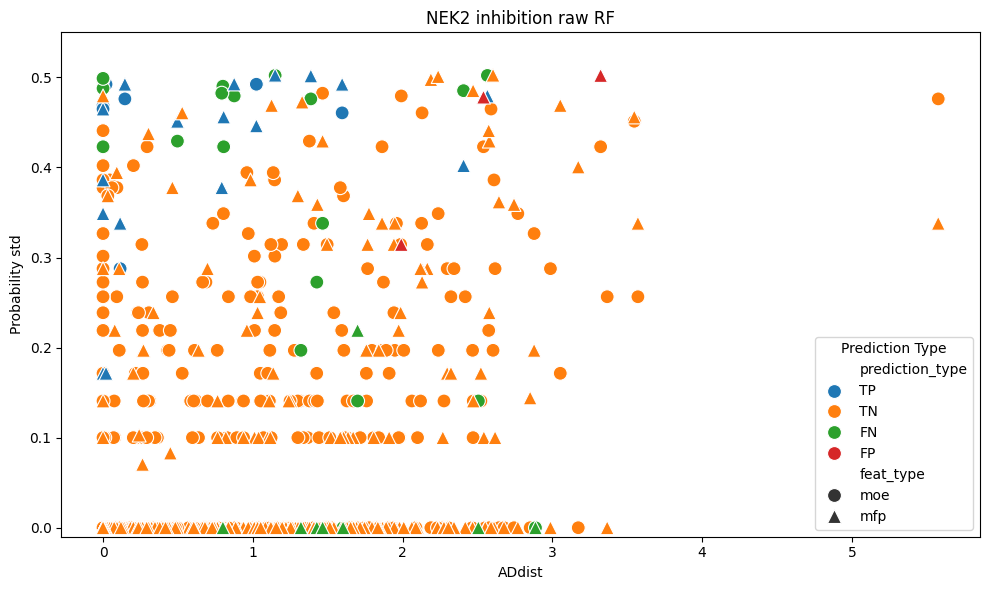

NEK2 scaled RF_BCW


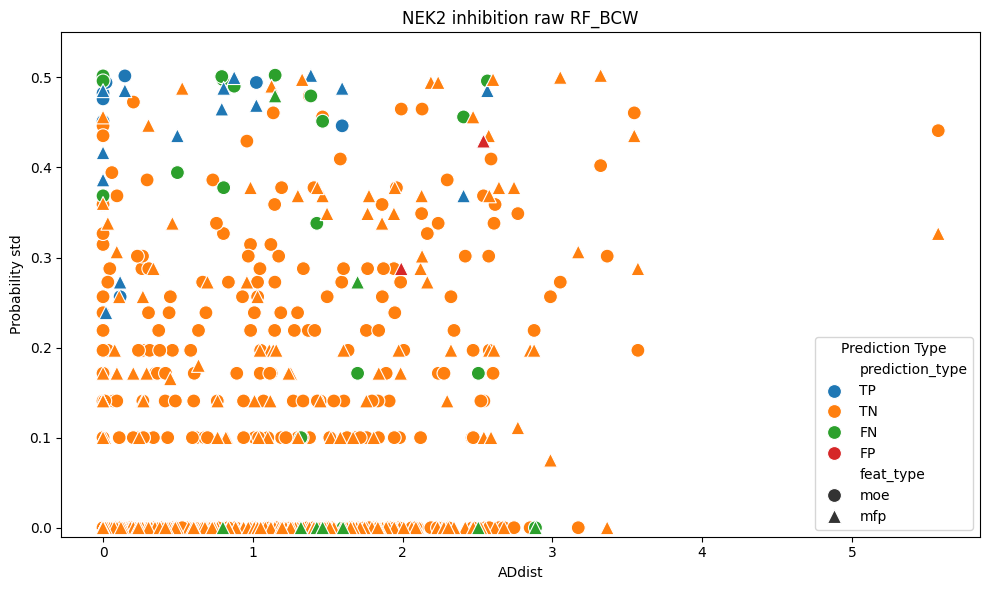

NEK2 scaled BRFC


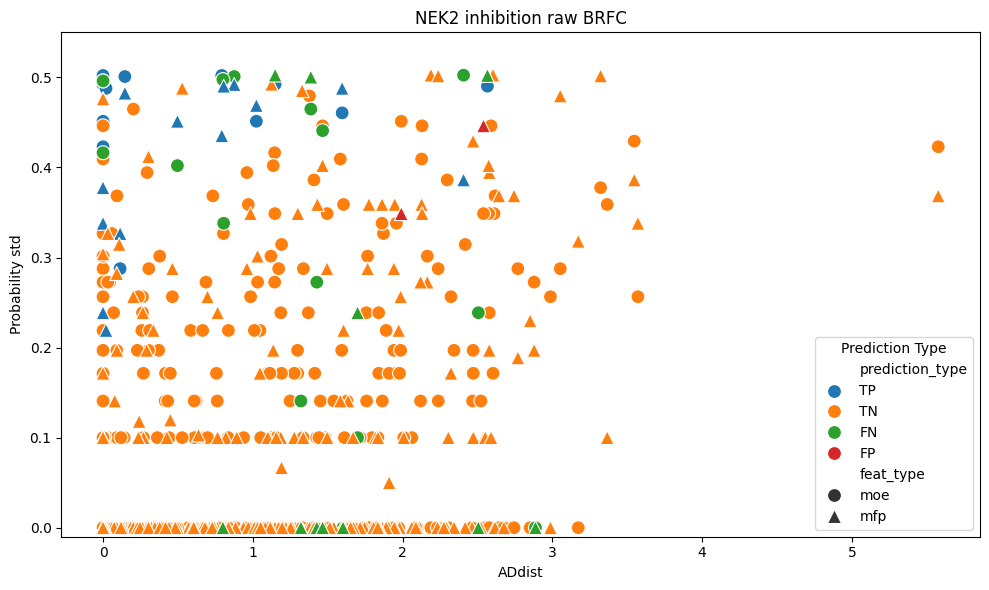

NEK2 scaled BRFC_BCW


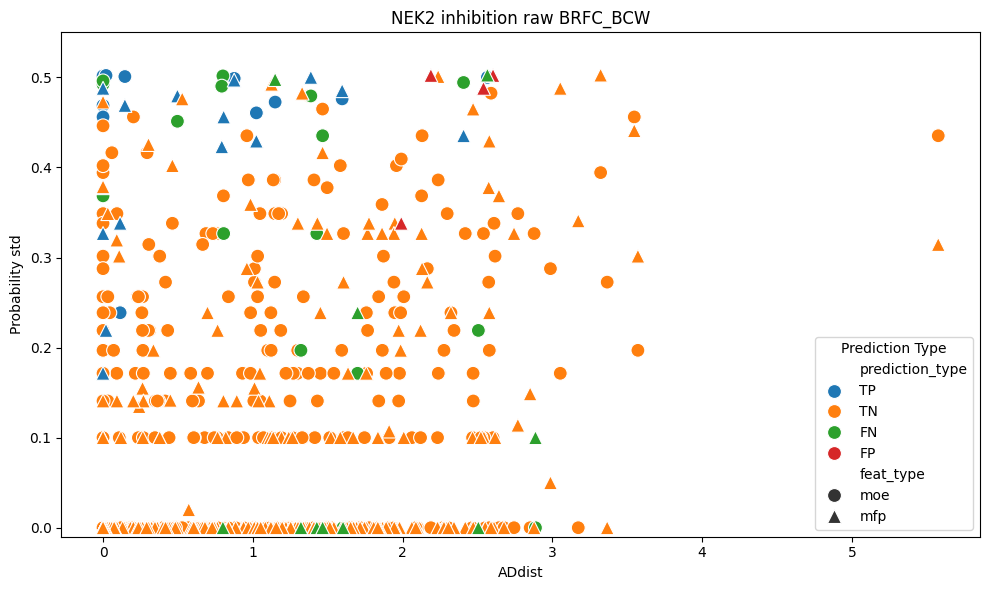

NEK2 UNDER RF


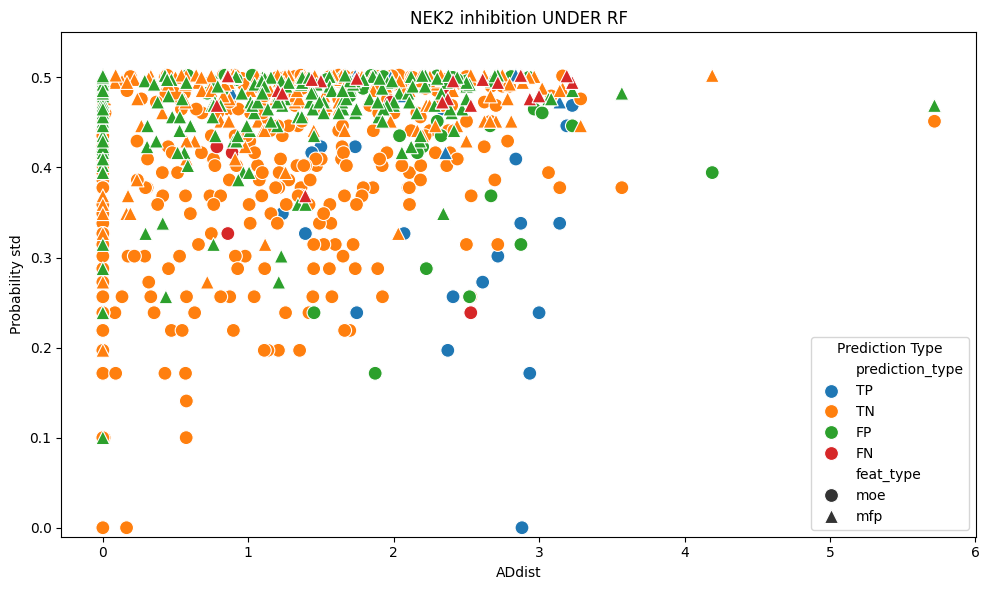

NEK2 UNDER RF_BCW


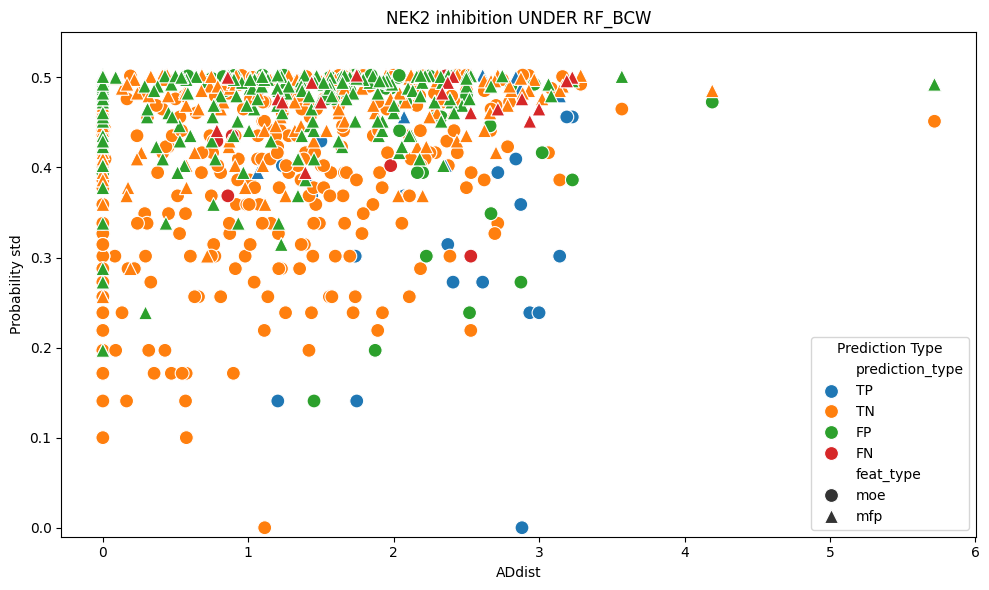

NEK2 UNDER BRFC


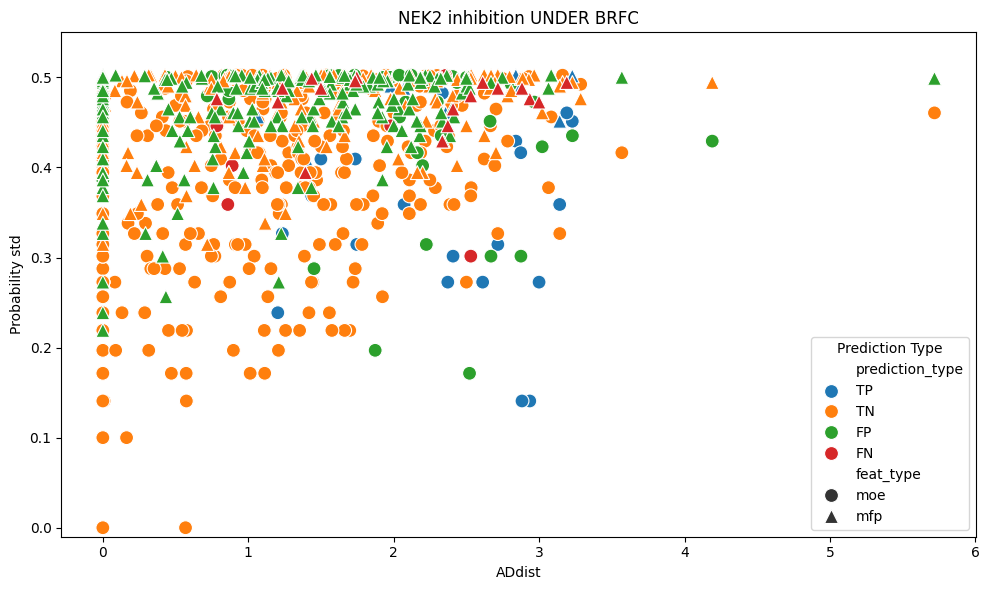

NEK2 UNDER BRFC_BCW


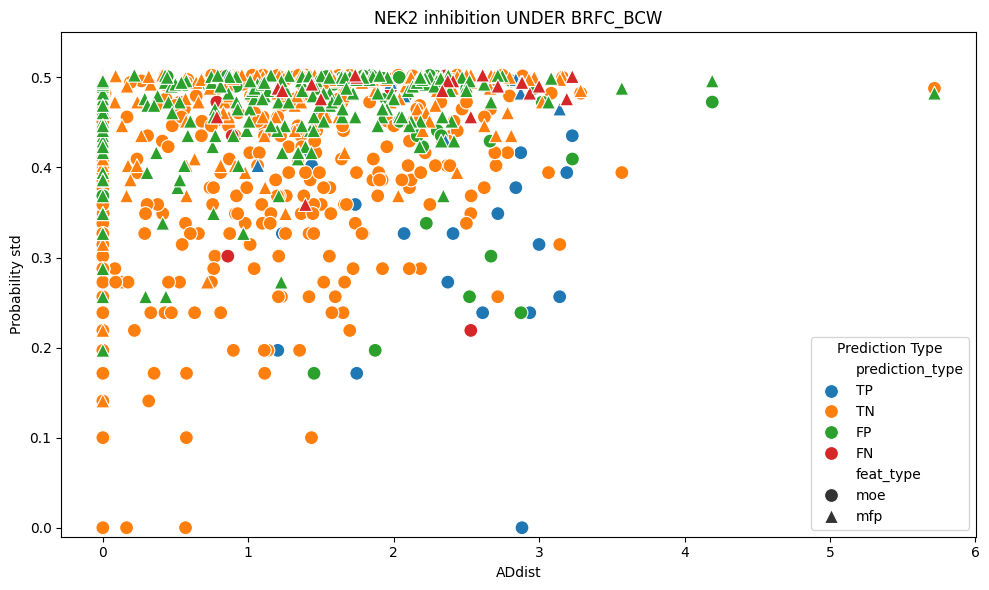

NEK2 SMOTE RF


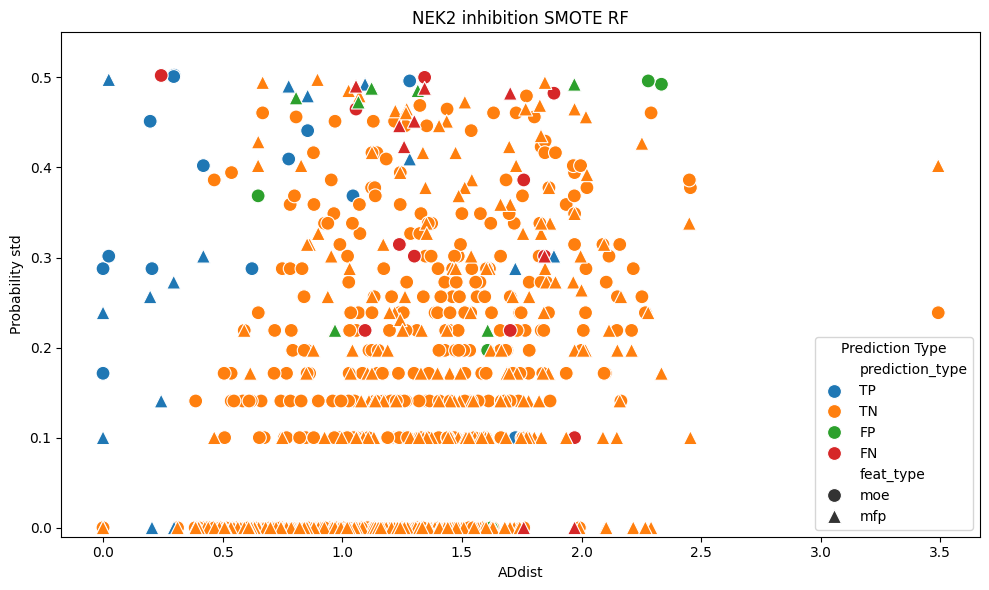

NEK2 SMOTE RF_BCW


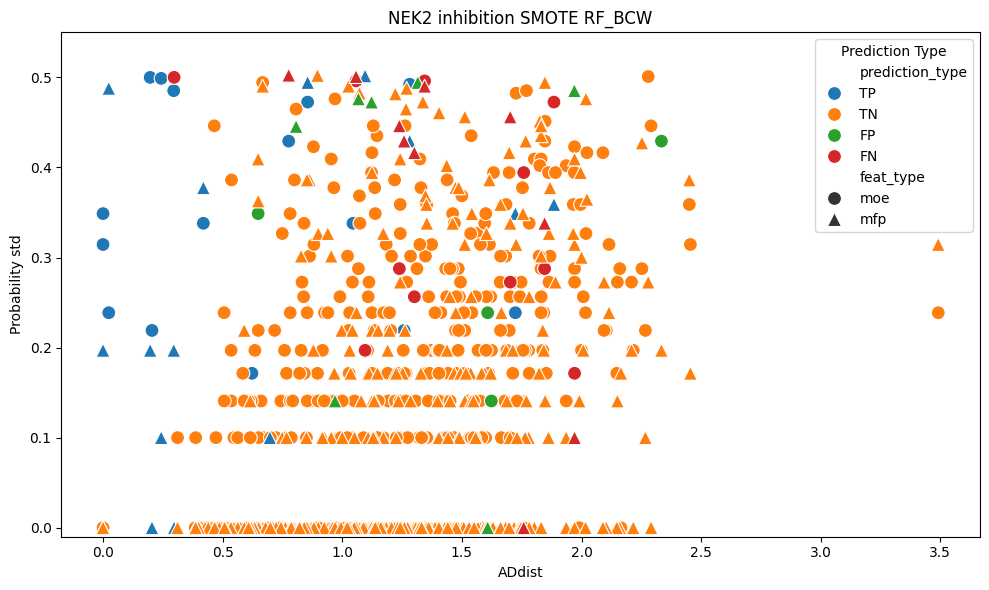

NEK2 SMOTE BRFC


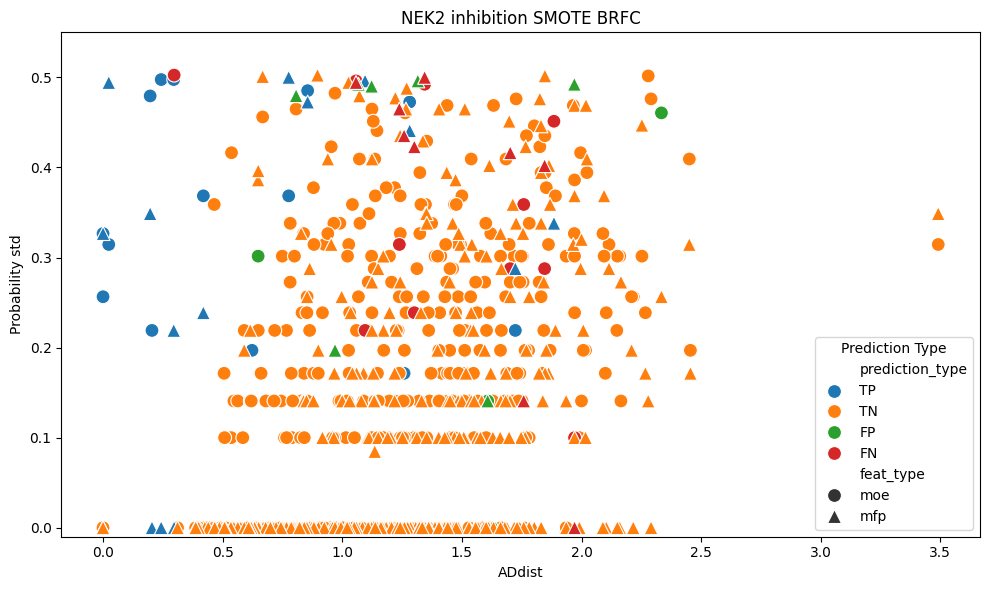

NEK2 SMOTE BRFC_BCW


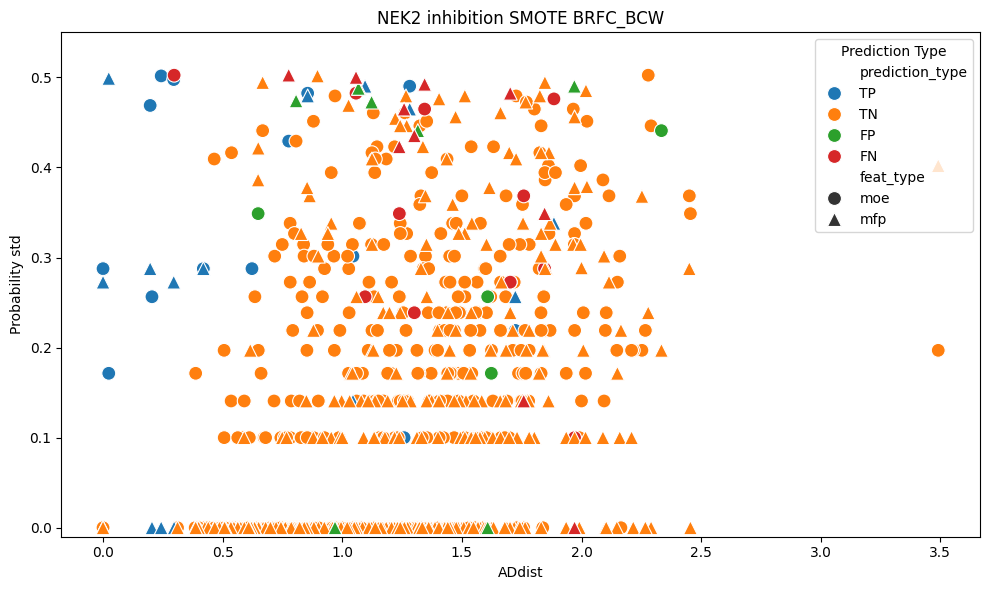

NEK2 ADASYN RF


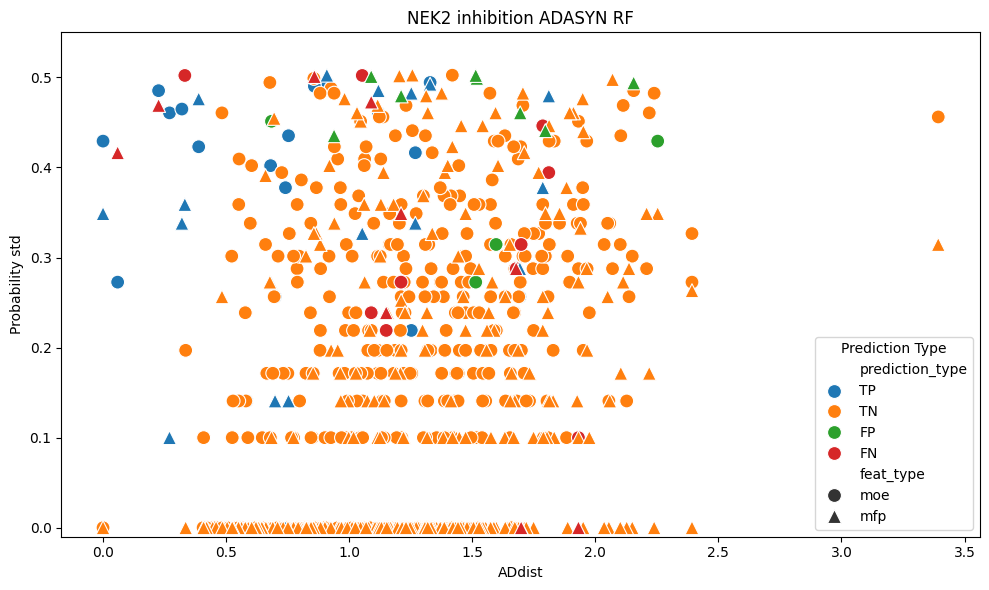

NEK2 ADASYN RF_BCW


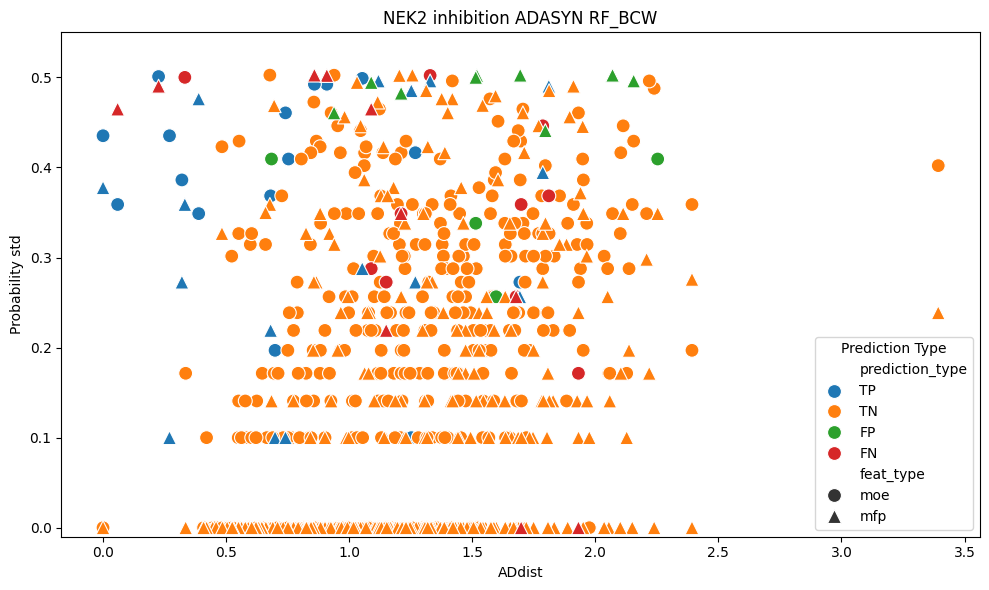

NEK2 ADASYN BRFC


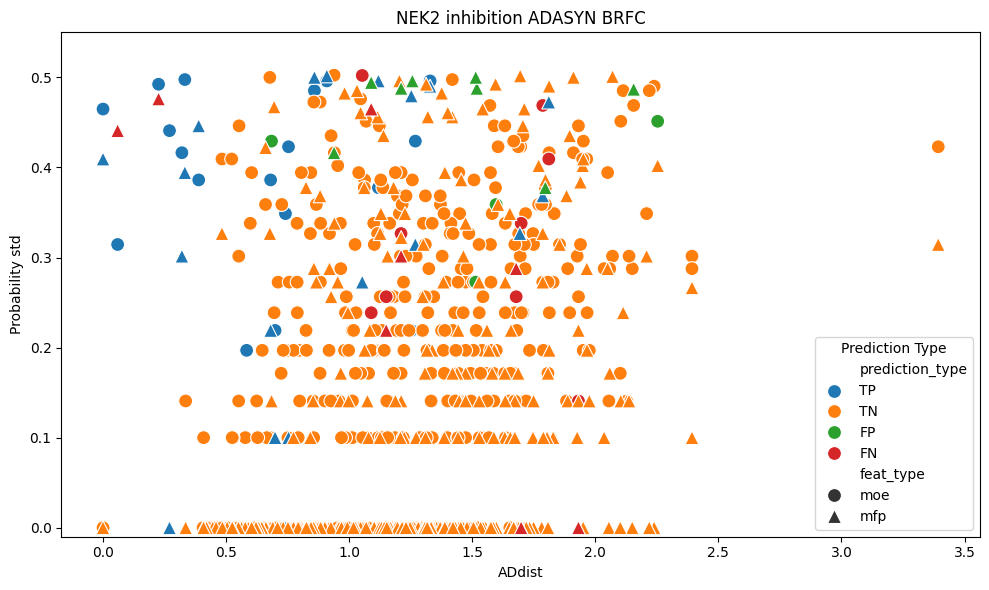

NEK2 ADASYN BRFC_BCW


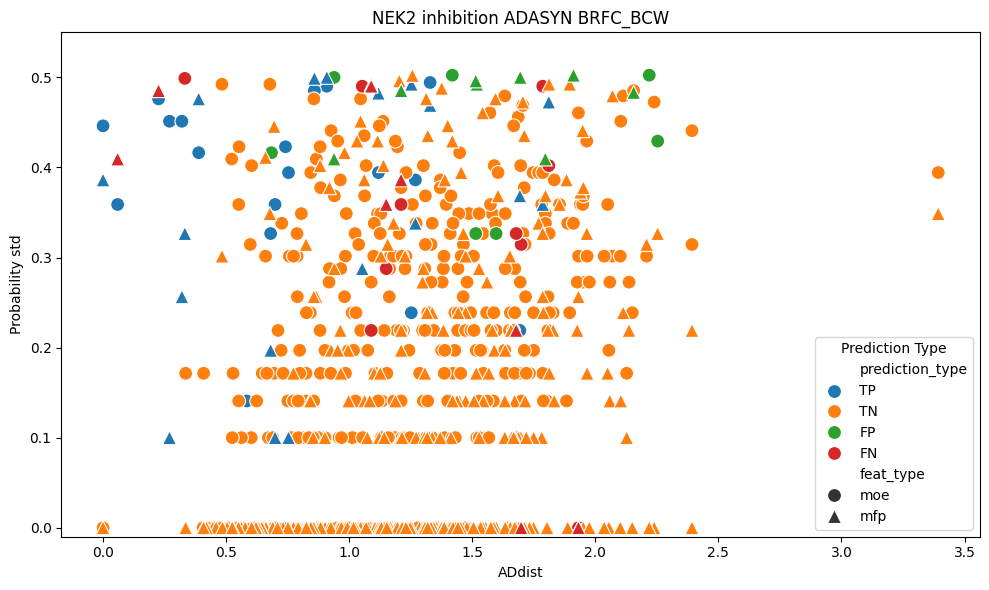

NEK9 scaled RF


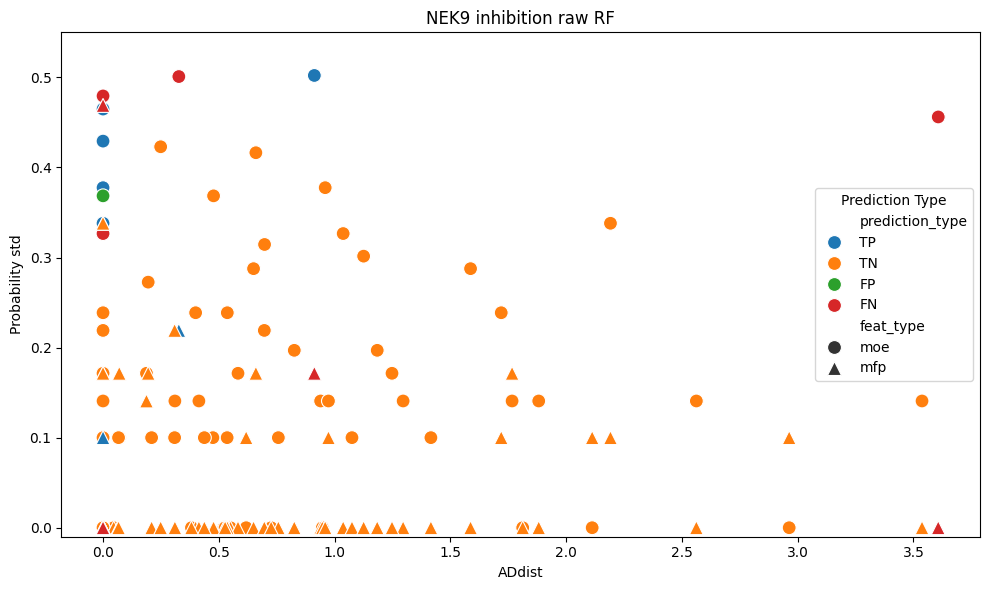

NEK9 scaled RF_BCW


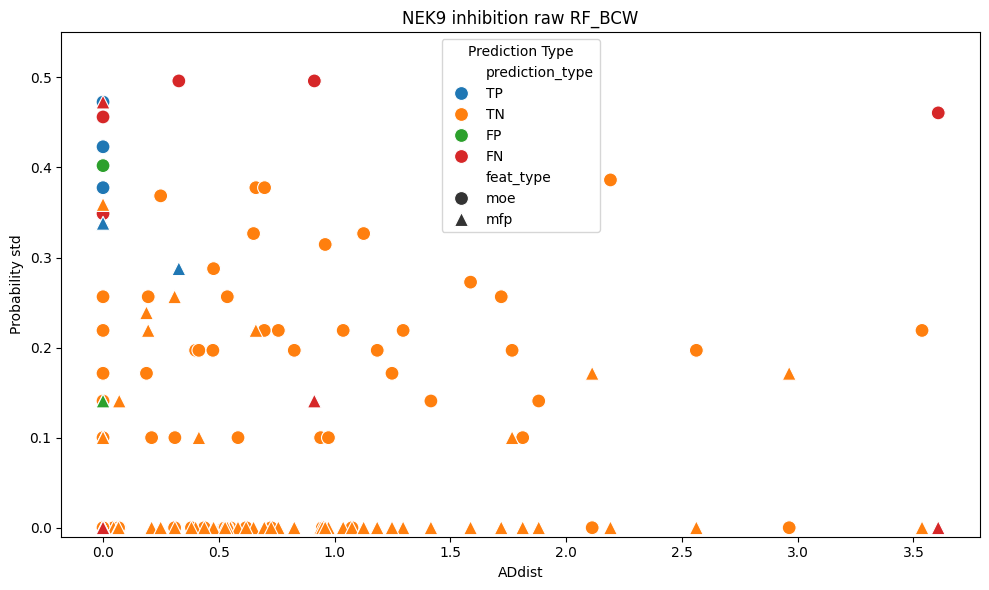

NEK9 scaled BRFC


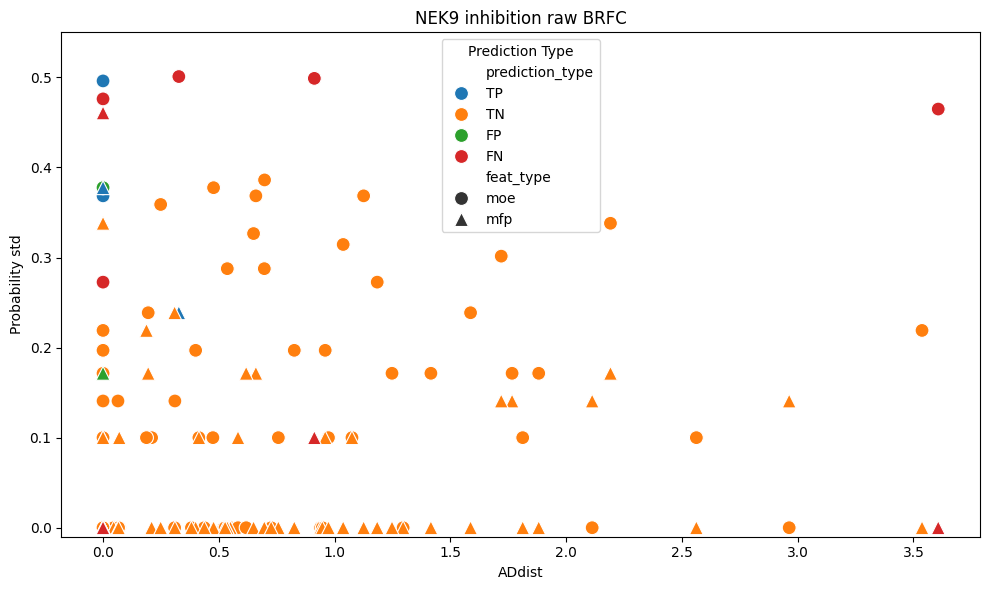

NEK9 scaled BRFC_BCW


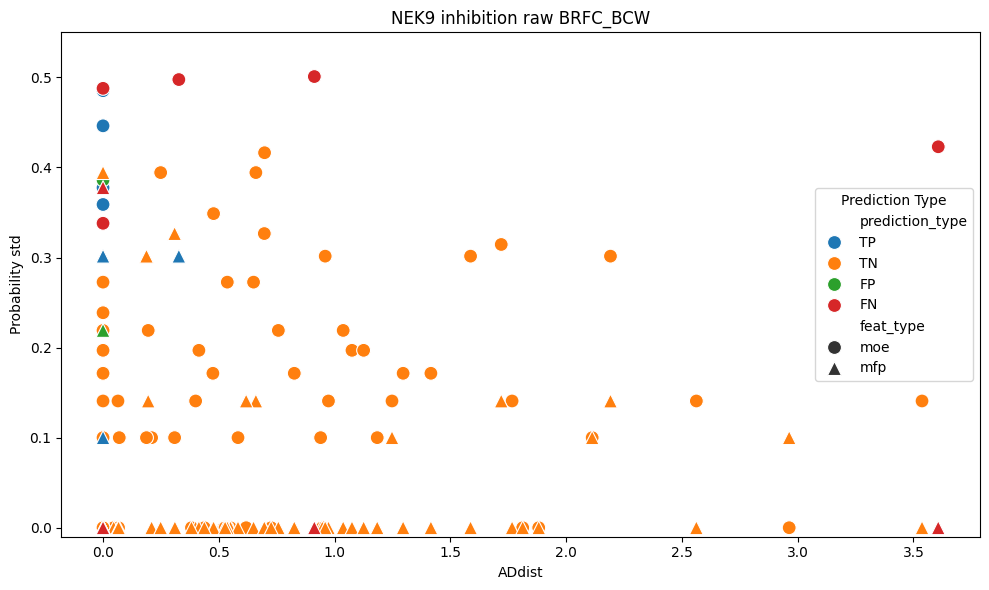

NEK9 UNDER RF


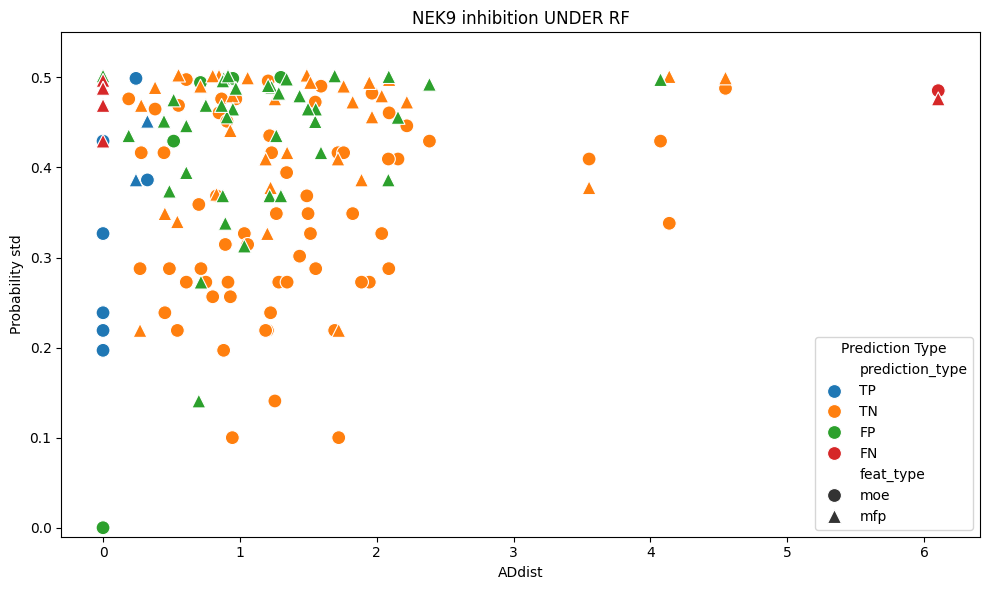

NEK9 UNDER RF_BCW


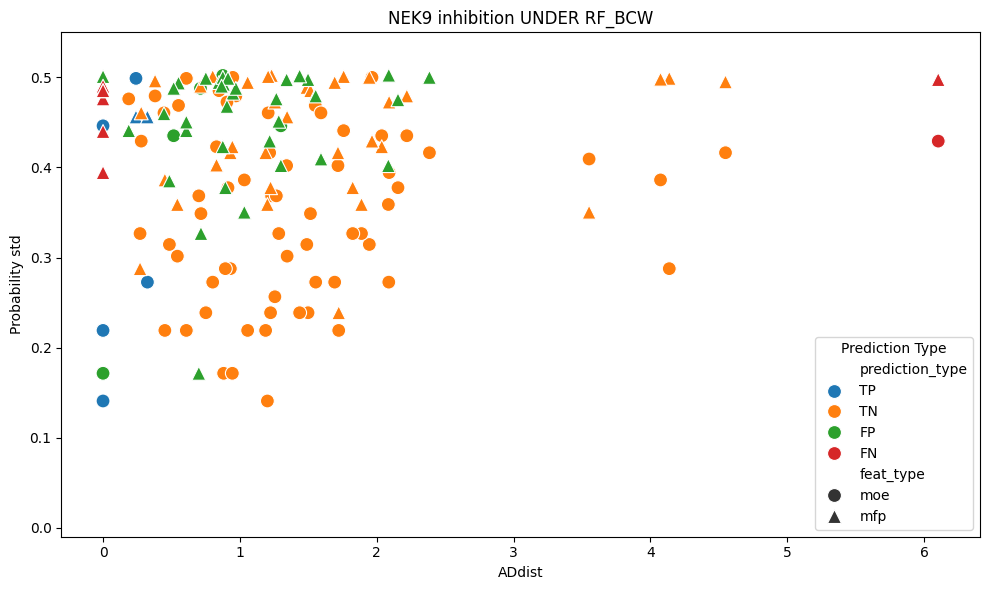

NEK9 UNDER BRFC


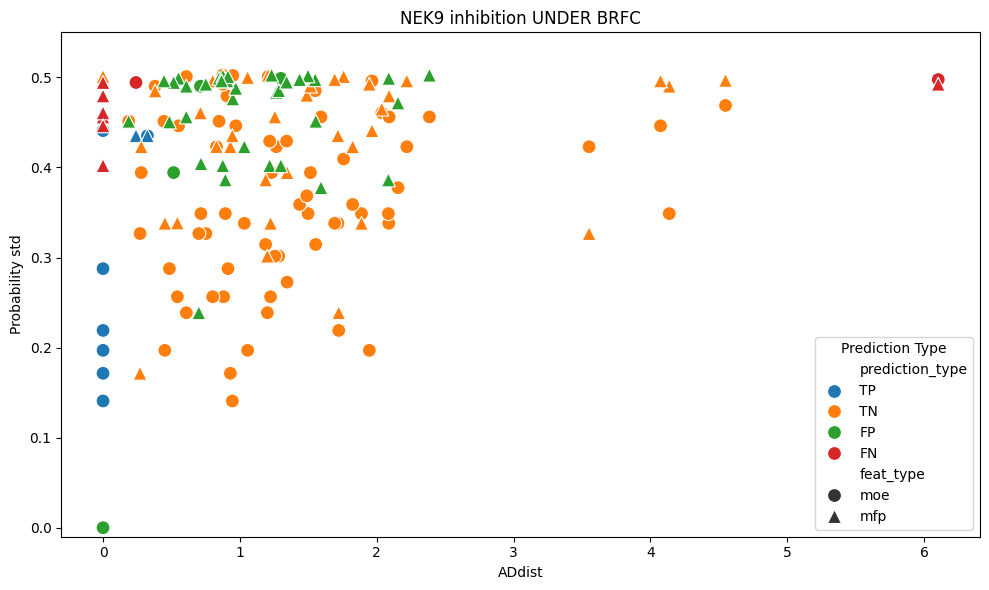

NEK9 UNDER BRFC_BCW


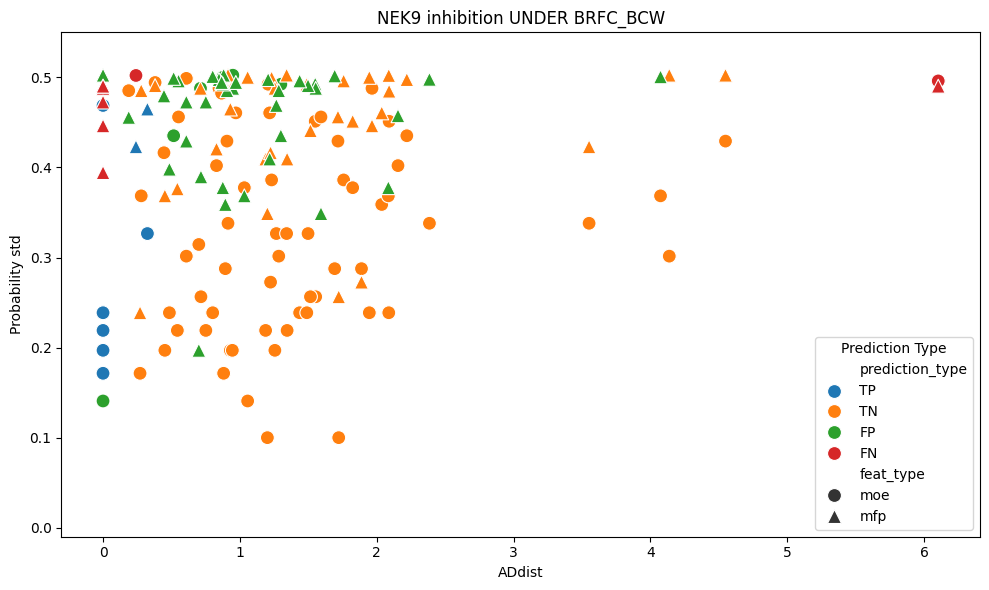

NEK9 SMOTE RF


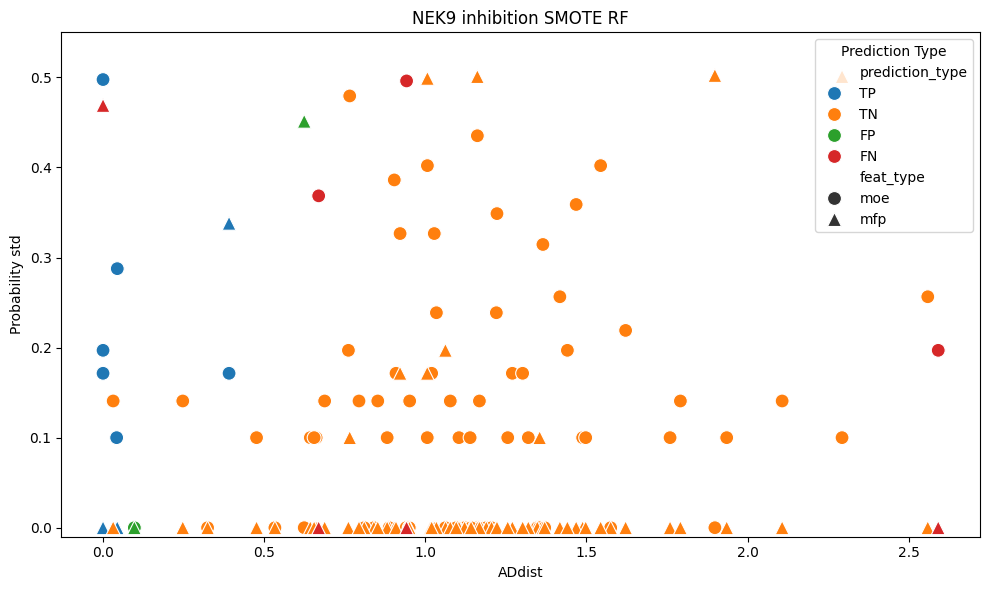

NEK9 SMOTE RF_BCW


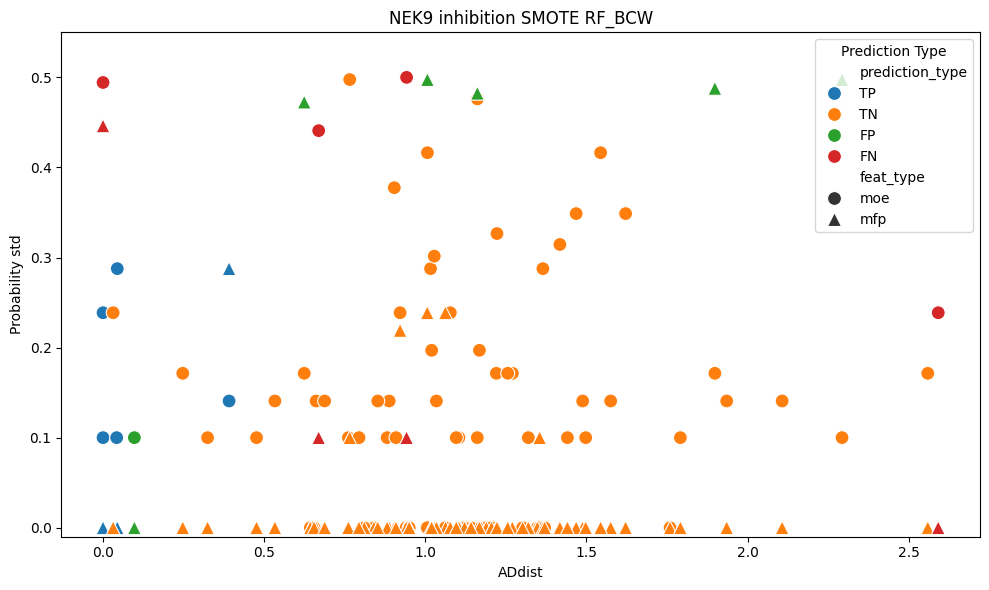

NEK9 SMOTE BRFC


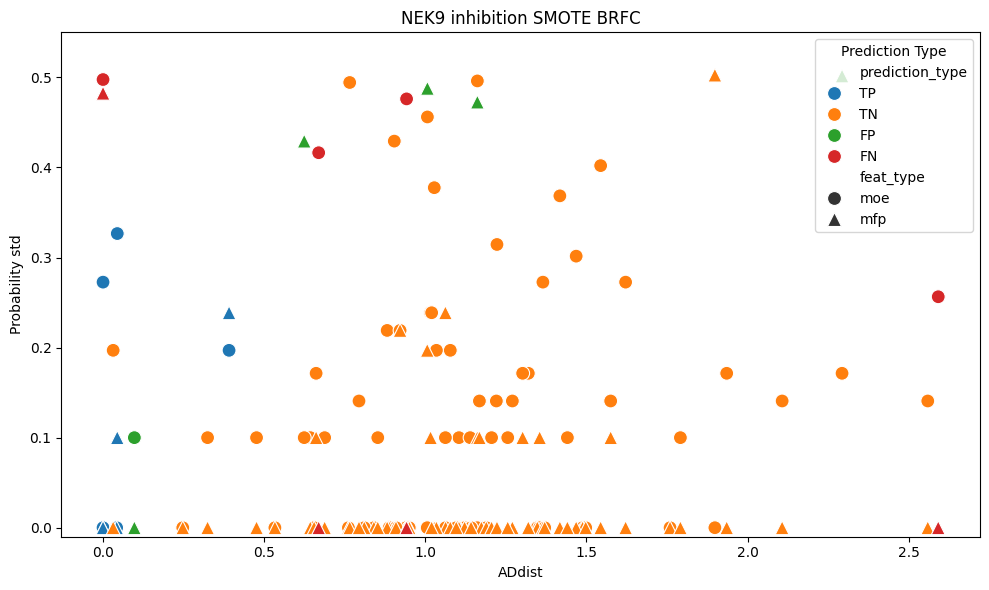

NEK9 SMOTE BRFC_BCW


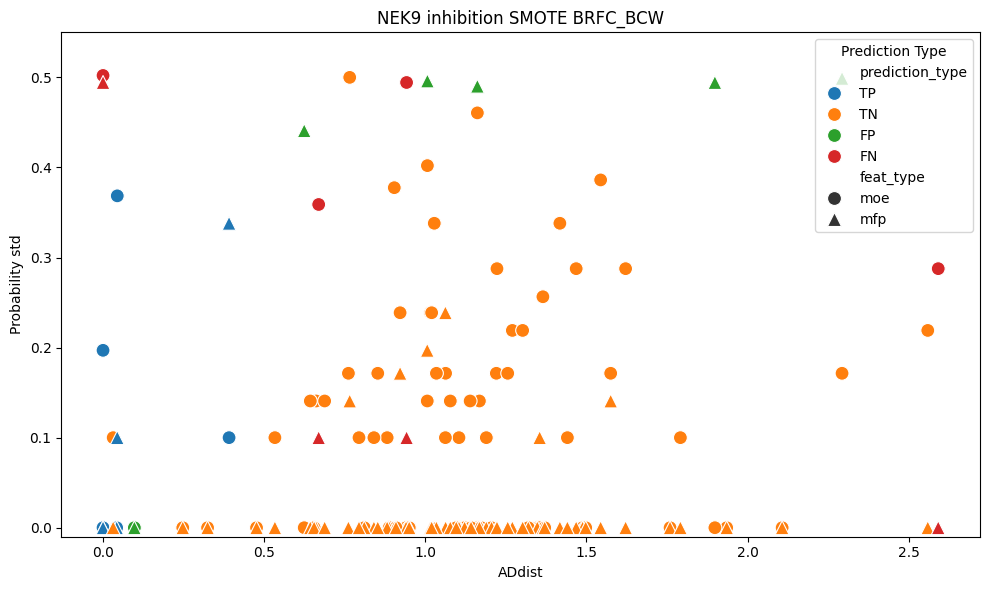

NEK9 ADASYN RF


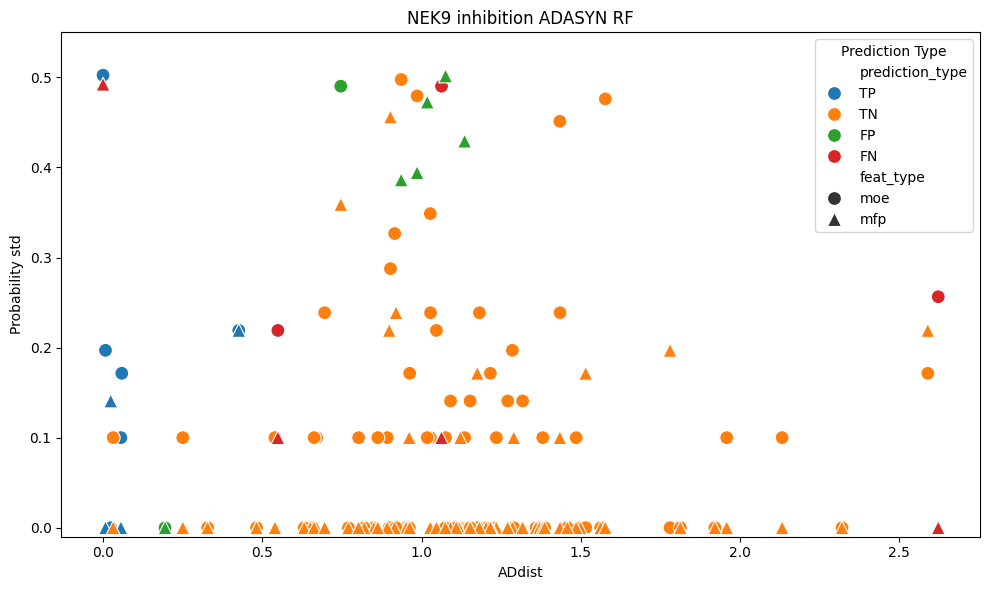

NEK9 ADASYN RF_BCW


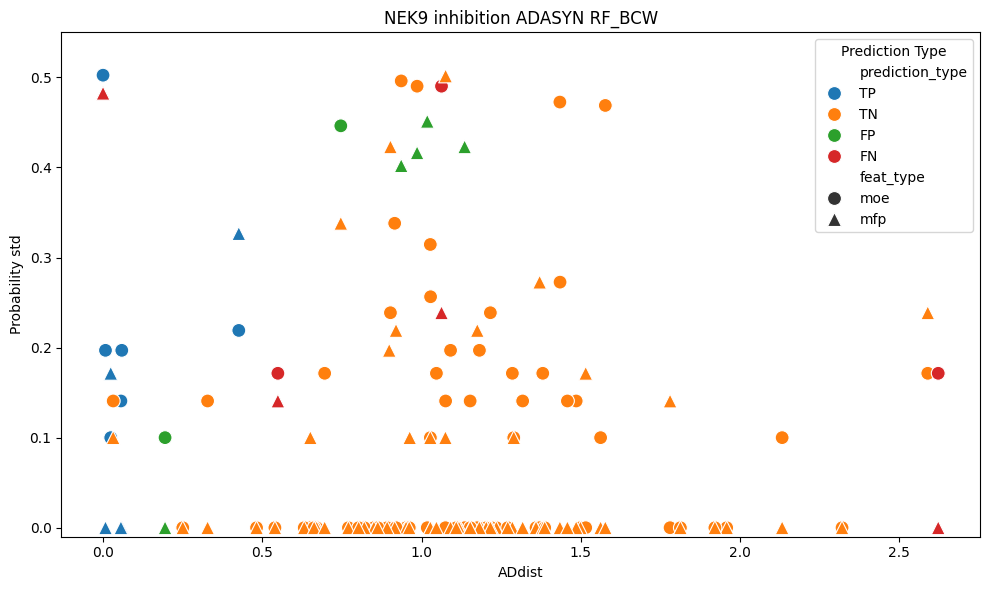

NEK9 ADASYN BRFC


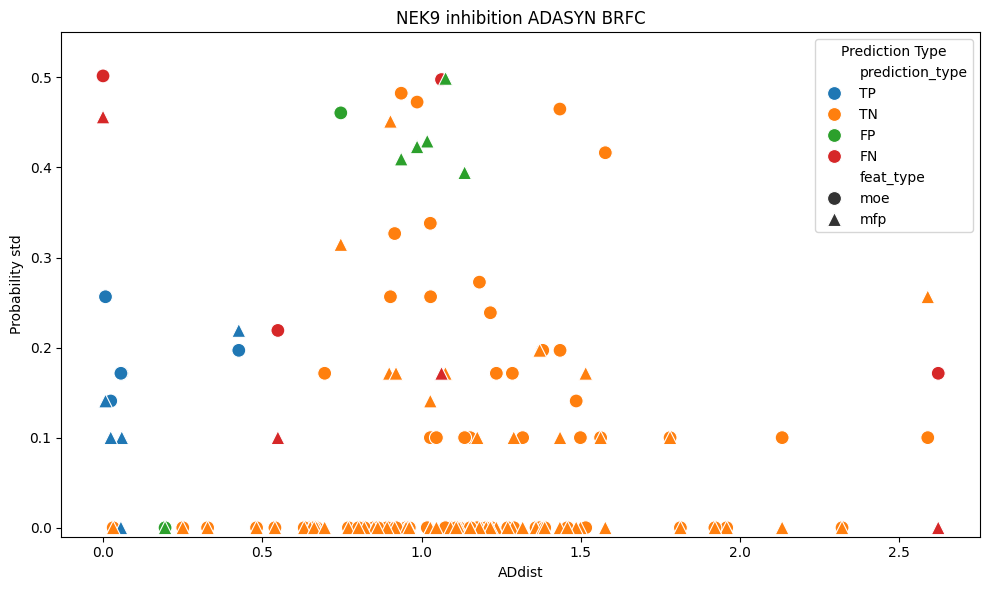

NEK9 ADASYN BRFC_BCW


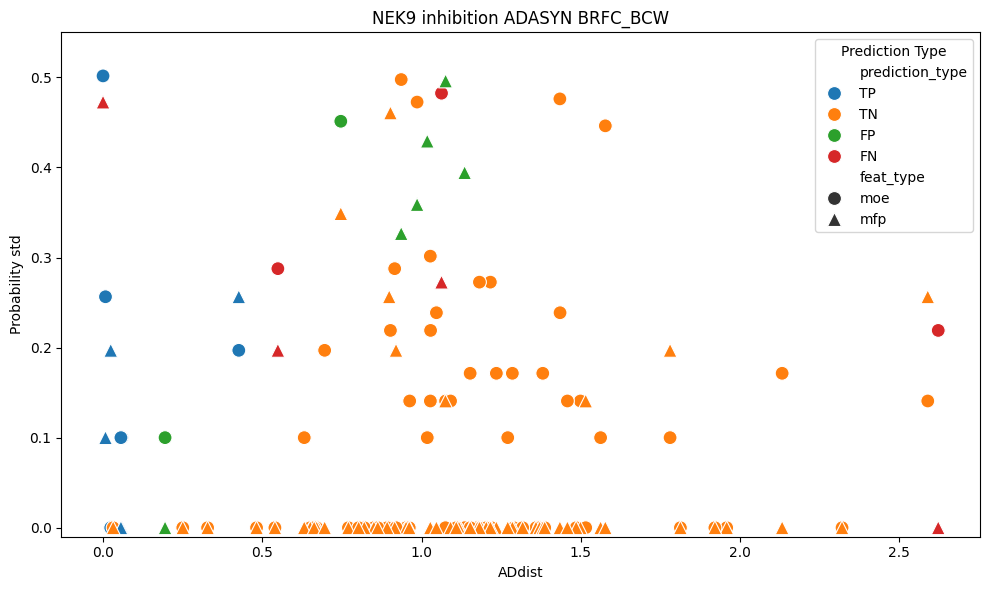

NEK9 scaled RF


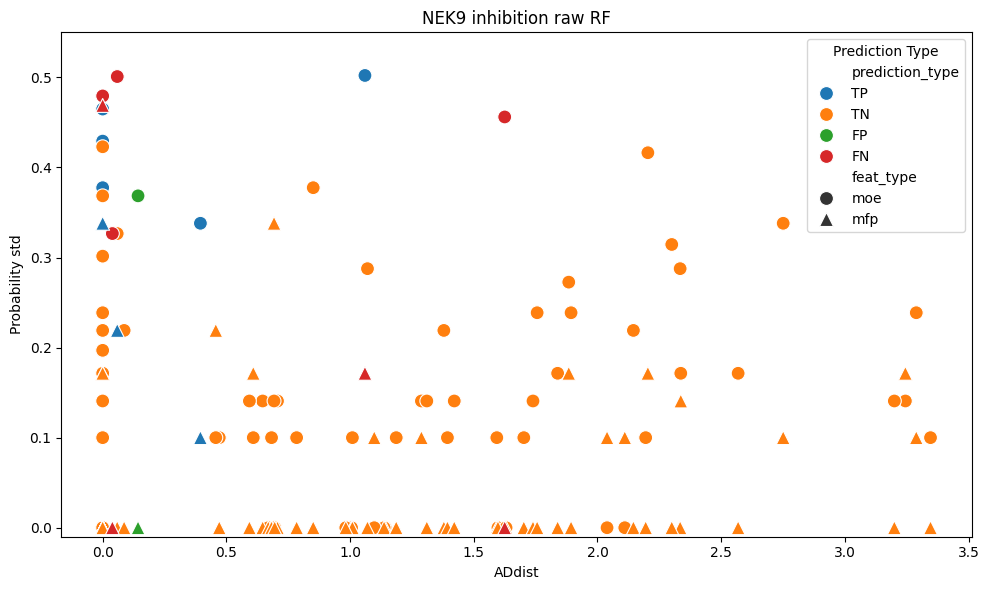

NEK9 scaled RF_BCW


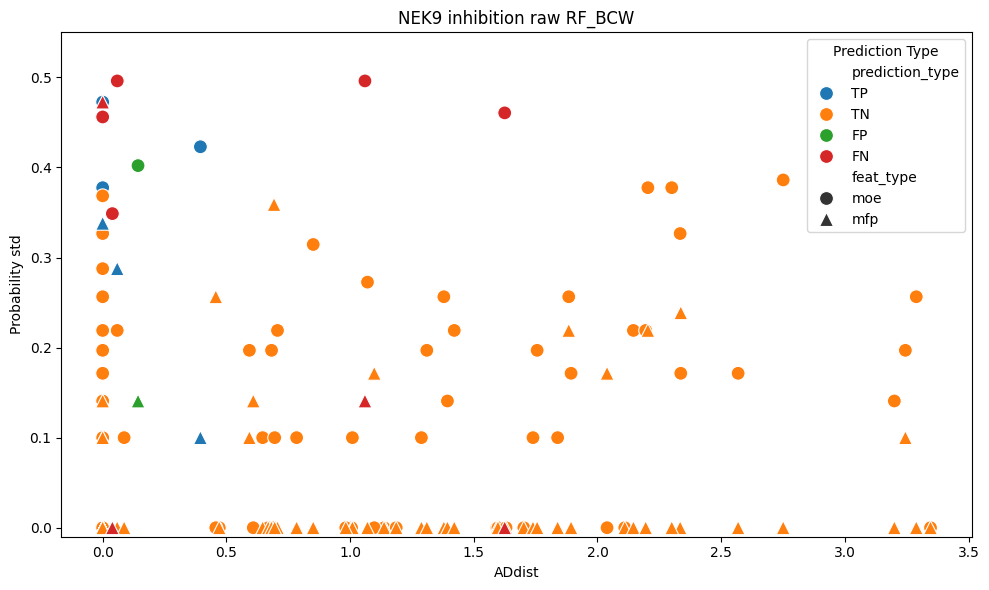

NEK9 scaled BRFC


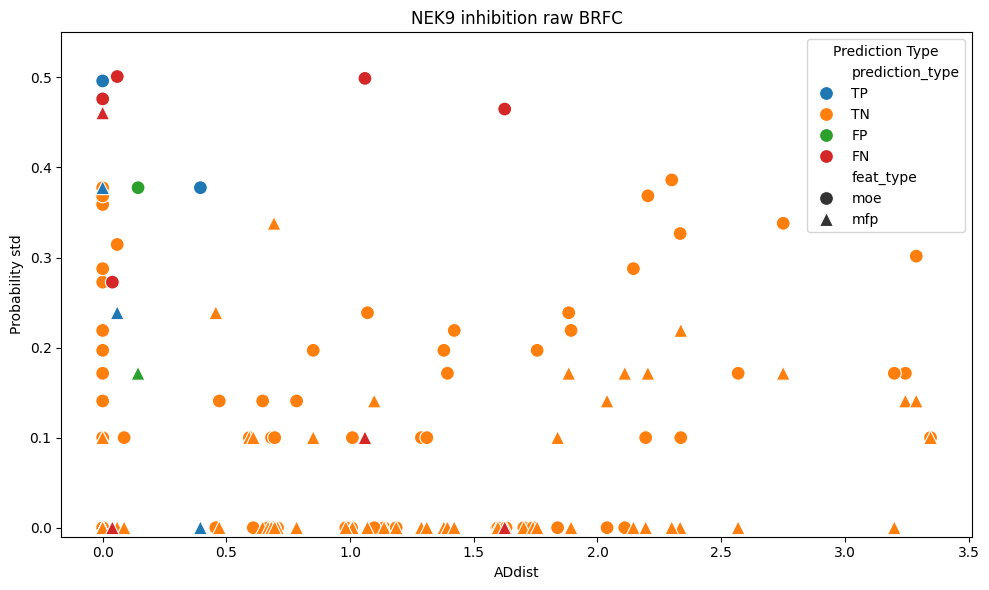

NEK9 scaled BRFC_BCW


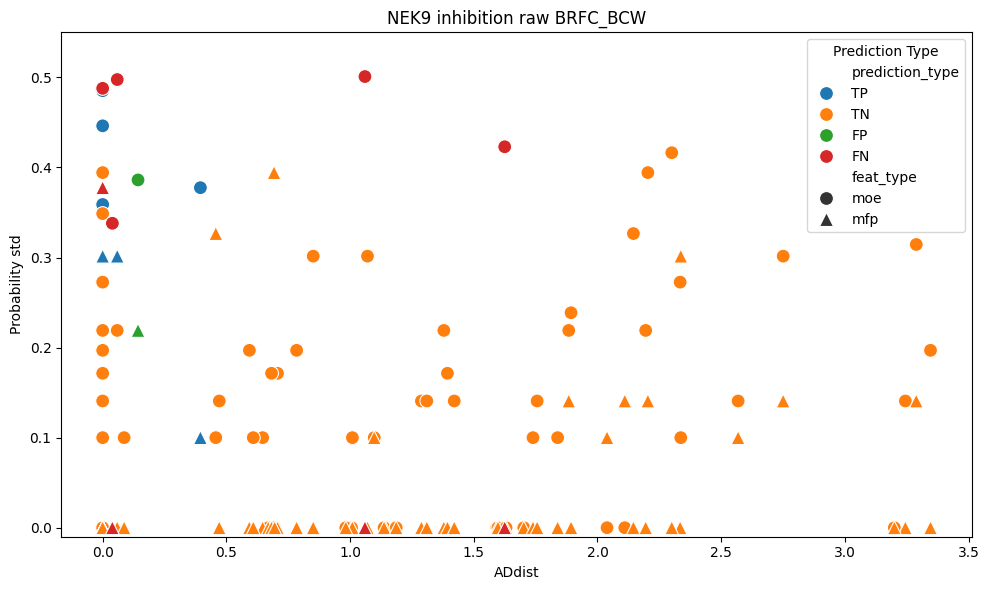

NEK9 UNDER RF


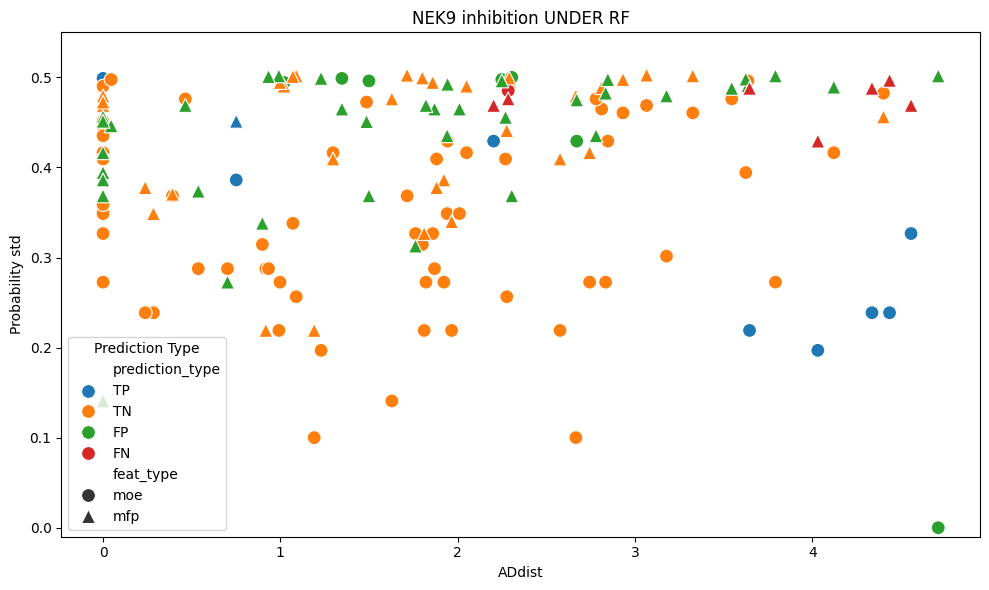

NEK9 UNDER RF_BCW


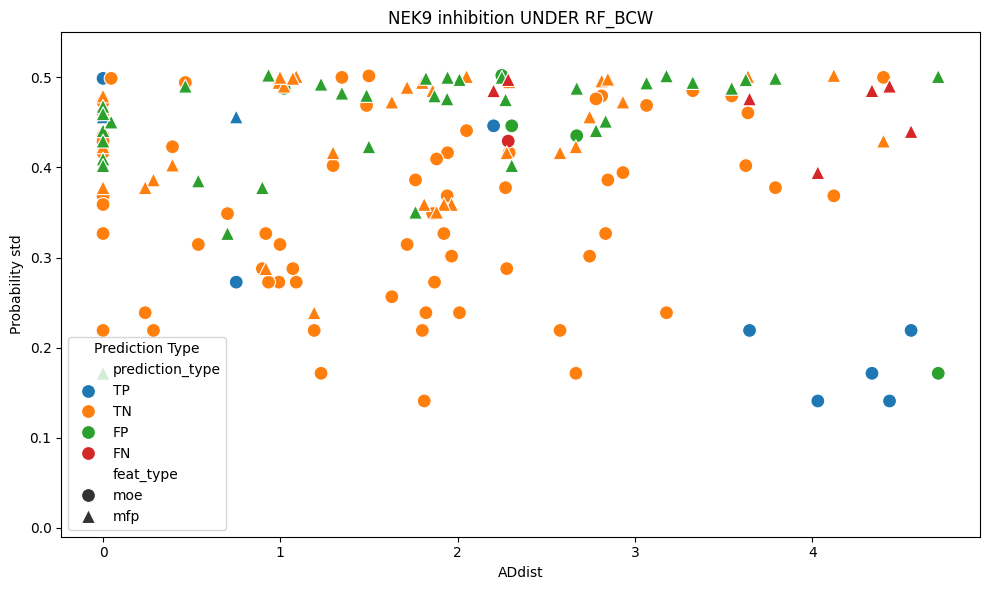

NEK9 UNDER BRFC


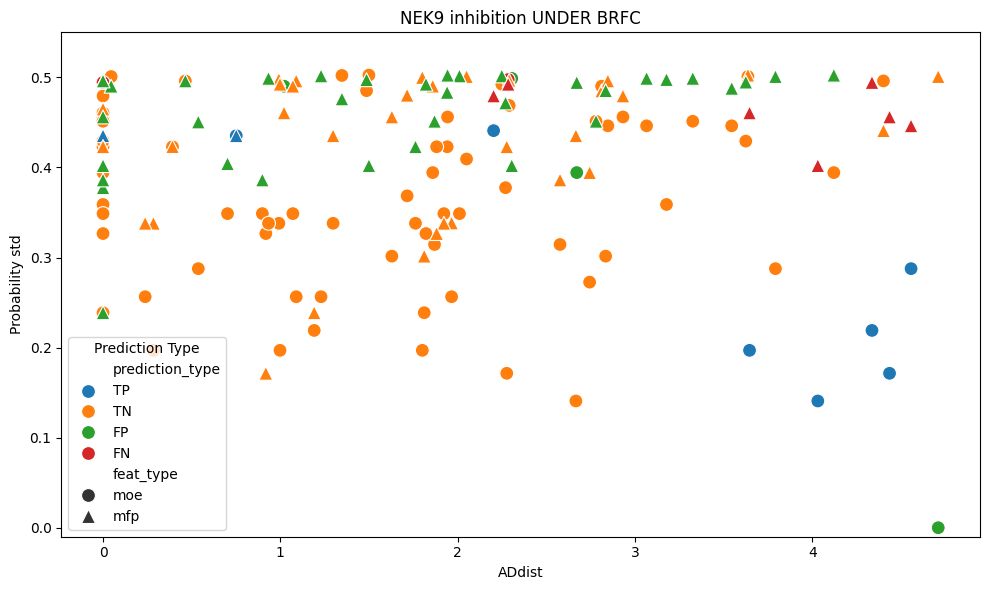

NEK9 UNDER BRFC_BCW


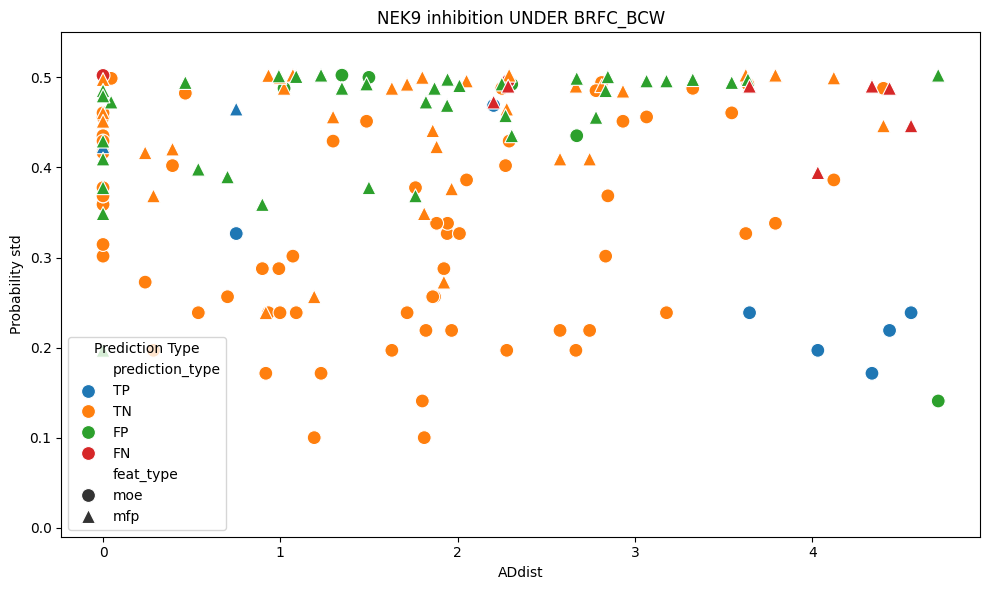

NEK9 SMOTE RF


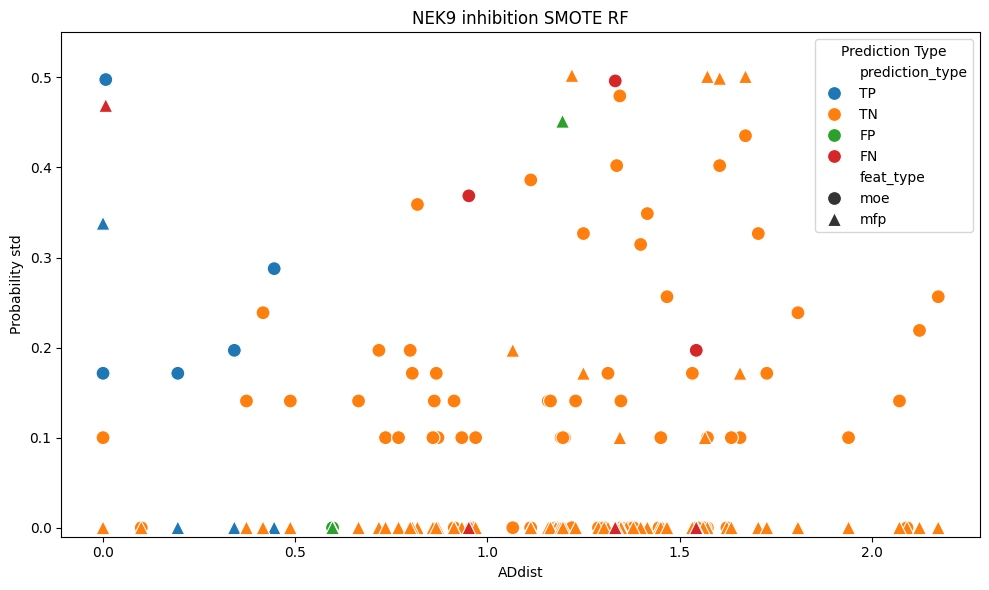

NEK9 SMOTE RF_BCW


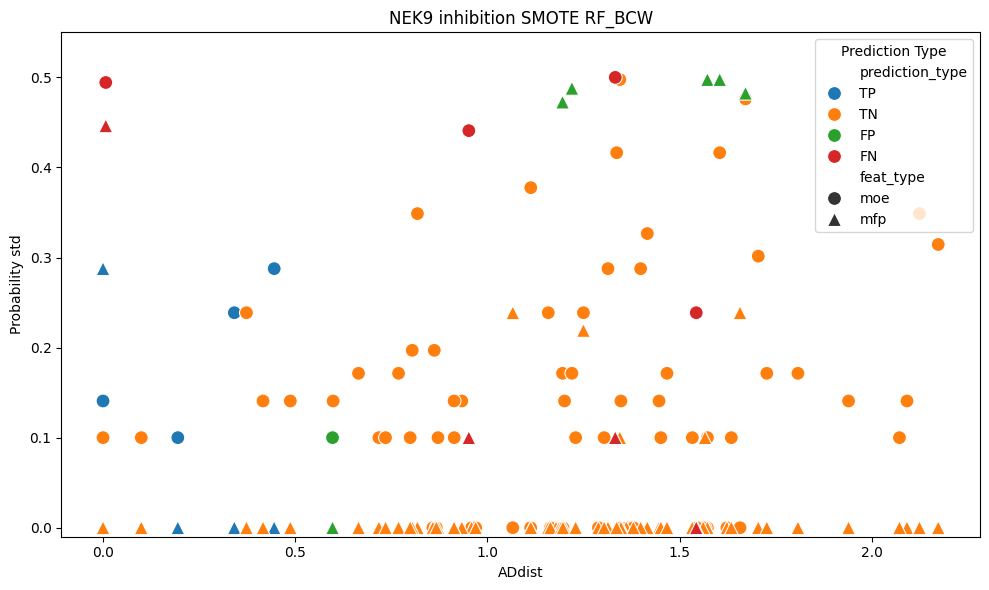

NEK9 SMOTE BRFC


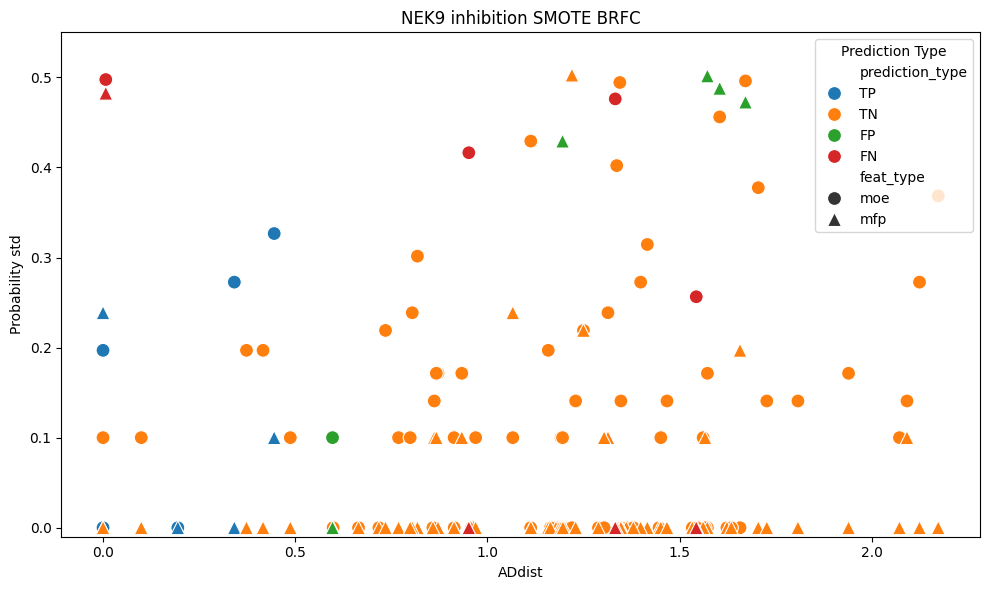

NEK9 SMOTE BRFC_BCW


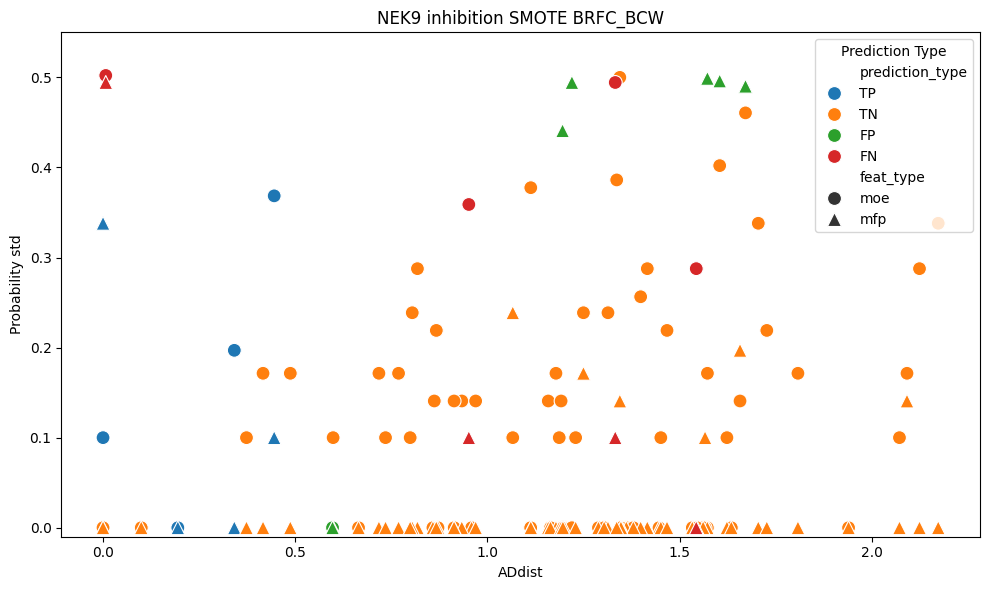

NEK9 ADASYN RF


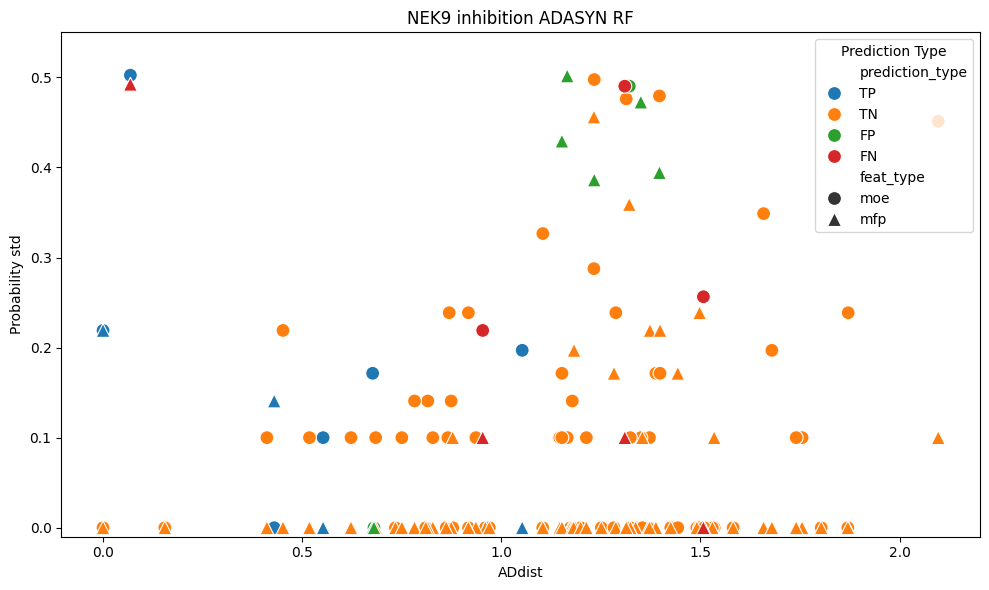

NEK9 ADASYN RF_BCW


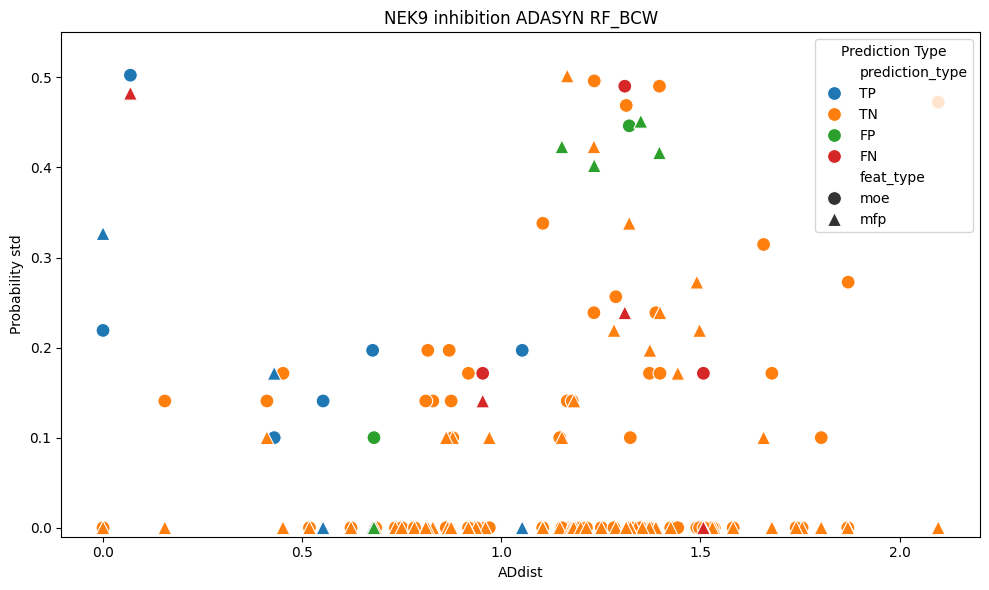

NEK9 ADASYN BRFC


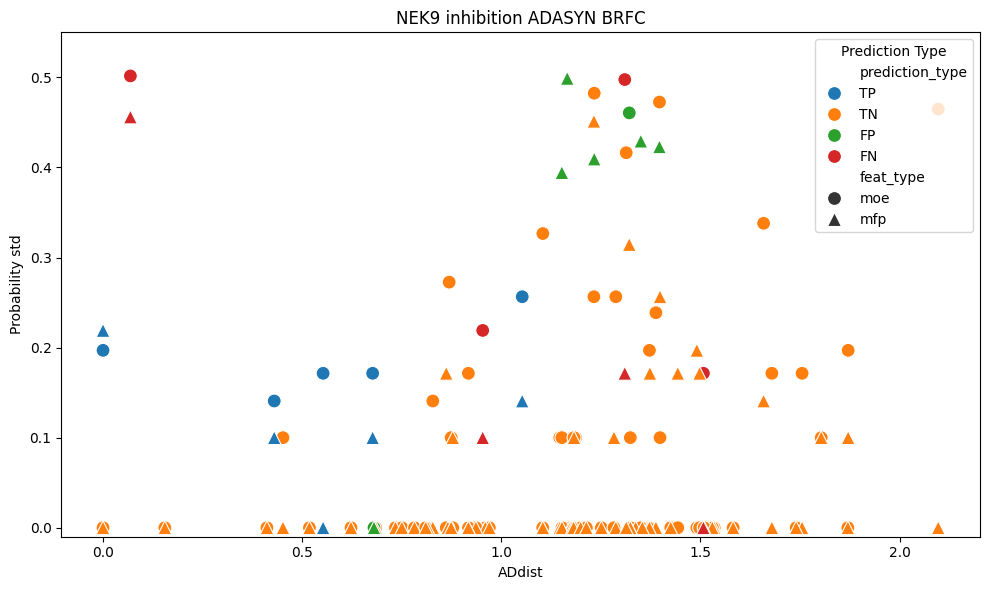

NEK9 ADASYN BRFC_BCW


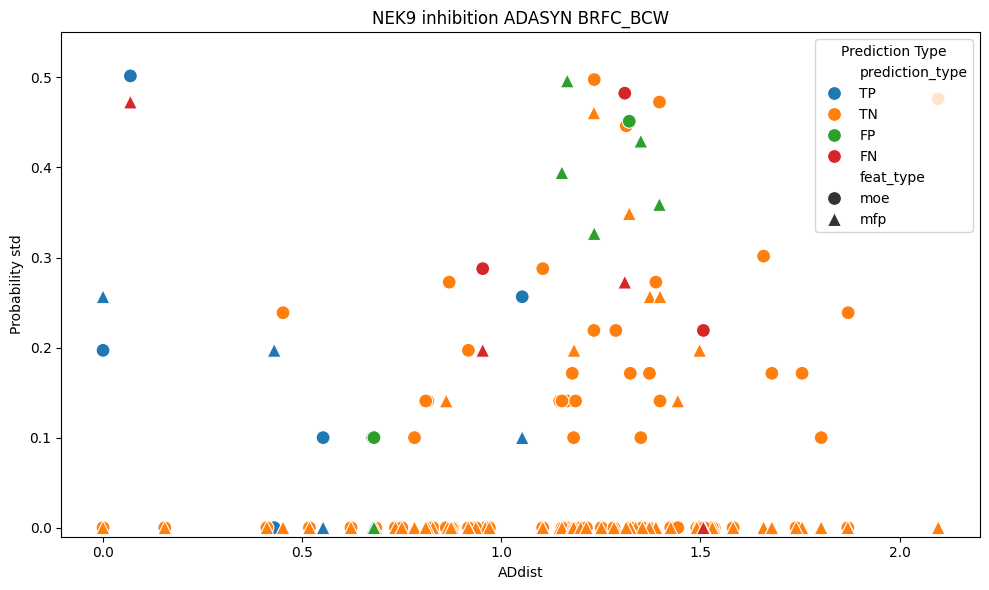

In [85]:

nek_list=[]
col_names = ['prediction_type', 'ADdist', 'model_type']
for nek in nek_list:
    for feat in feat_types: 
        for samp in samplings: 
            df_path = f'/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/NEK{nek}/bind/'
            full_df = pd.read_csv(f'{df_path}NEK{nek}_binding_{feat}_{samp}_df.csv') 
            train_df = full_df[full_df['subset'] == 'train'].select_dtypes(include=numerics).drop(columns=['active'])
            test_df = full_df[full_df['subset'] == 'test'].select_dtypes(include=numerics).drop(columns=['active'])
            test_dist = calc_AD_kmean_dist(train_df, test_df, k)
            train_dist = calc_AD_kmean_dist(train_df, train_df, k)
            
            for rf in RF_types:
                print(f'NEK{nek} {samp} {rf}')

                moe_pred = pd.read_csv(f'{result_path}NEK{nek}_binding_moe_{samp}_{rf}_test.csv')
                mfp_pred = pd.read_csv(f'{result_path}NEK{nek}_binding_mfp_{samp}_{rf}_test.csv')
                stdprobs = pd.read_csv(f'{prob_path}NEK{nek}_binding_std_prob_{samp}_{rf}.csv')
                std0_moe = stdprobs['std0_moe'].to_numpy()
                std1_moe = stdprobs['std1_moe'].to_numpy()
                std0_mfp = stdprobs['std0_mfp'].to_numpy()
                std1_mfp  = stdprobs['std1_mfp'].to_numpy()
                moe_preds = moe_pred['prediction']
                mfp_preds = mfp_pred['prediction']
                
                true_labels =moe_pred['y'].to_numpy()
                moe_tp = np.where((moe_preds == 1) & (true_labels == 1).flatten())[0] 
                moe_tn = np.where((moe_preds == 0) & (true_labels == 0).flatten())[0]
                moe_fp = np.where((moe_preds == 1) & (true_labels == 0).flatten())[0] 
                moe_fn = np.where((moe_preds == 0) & (true_labels == 1).flatten())[0] 
                # print(len(moe_tp), len(moe_tn), len(moe_fp), len(moe_fn))

                moe_df = pd.DataFrame({'prediction': moe_preds, 'category': moe_pred['prediction_type'], 'std0': std0_moe, 'std1': std1_moe, 'ADdist': test_dist})
                mfp_df = pd.DataFrame({'prediction': mfp_preds, 'category': mfp_pred['prediction_type'], 'std0': std0_mfp, 'std1': std1_mfp, 'ADdist': test_dist})
                moe_df['feat_type'] = 'moe'
                mfp_df['feat_type']= 'mfp' 
                df = pd.concat([moe_df, mfp_df])
                if (samp=='scaled'): 
                    samp='raw'
      
        
                # swarm_stdprob_AD4_jitter(df,true_labels,f'NEK{nek} binding {samp} {rf} (GS)', figure_pathmoemfp,f'NEK{nek}_binding_{samp}_{rf}_GS_AD_stdprob' )
                RF_stdprob_AD_scatter_moemfp(df,true_labels,f'NEK{nek} binding {samp} {rf}')
                if (samp=='raw'): 
                    samp='scaled'

# DO IT FOR INHIBITION
for nek in ['2','9']:
    for feat in feat_types: 
        for samp in samplings: 
            df_path = f'/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/NEK{nek}/inhib/'
            full_df = pd.read_csv(f'{df_path}NEK{nek}_inhibition_{feat}_{samp}_df.csv') 
            train_df = full_df[full_df['subset'] == 'train'].select_dtypes(include=numerics).drop(columns=['active'])
            test_df = full_df[full_df['subset'] == 'test'].select_dtypes(include=numerics).drop(columns=['active'])
            test_dist = calc_AD_kmean_dist(train_df, test_df, k)
            train_dist = calc_AD_kmean_dist(train_df, train_df, k)
            for rf in RF_types:
                print(f'NEK{nek} {samp} {rf}')

                moe_pred = pd.read_csv(f'{result_path}NEK{nek}_inhibition_moe_{samp}_{rf}_test.csv')
                mfp_pred = pd.read_csv(f'{result_path}NEK{nek}_inhibition_mfp_{samp}_{rf}_test.csv')
                stdprobs = pd.read_csv(f'{prob_path}NEK{nek}_inhibition_std_prob_{samp}_{rf}.csv')
                std0_moe = stdprobs['std0_moe'].to_numpy()
                std1_moe = stdprobs['std1_moe'].to_numpy()
                std0_mfp = stdprobs['std0_mfp'].to_numpy()
                std1_mfp  = stdprobs['std1_mfp'].to_numpy()
                moe_preds = moe_pred['prediction']
                mfp_preds = mfp_pred['prediction']
                true_labels =moe_pred['y'].to_numpy()
                # print(moe_preds.shape, mfp_preds.shape, stdprobs.shape, std0_moe.shape, std1_moe.shape,std0_mfp.shape,std1_mfp.shape)

                moe_df = pd.DataFrame({'prediction': moe_preds, 'category': moe_pred['prediction_type'], 'std0': std0_moe, 'std1': std1_moe, 'ADdist': test_dist})
                mfp_df = pd.DataFrame({'prediction': mfp_preds, 'category': mfp_pred['prediction_type'], 'std0': std0_mfp, 'std1': std1_mfp, 'ADdist': test_dist})
                moe_df['feat_type'] = 'moe'
                mfp_df['feat_type']= 'mfp' 
                moe_df = moe_df.reset_index(drop=True)
                mfp_df = mfp_df.reset_index(drop=True)
                df = pd.concat([moe_df, mfp_df])
                if (samp=='scaled'): 
                    samp='raw'

                # swarm_stdprob_AD4_jitter(df,true_labels,f'NEK{nek} inhibition {samp} {rf} (GS)', figure_pathmoemfp,f'NEK{nek}_inhibition_{samp}_{rf}_GS_AD_stdprob' )
                RF_stdprob_AD_scatter_moemfp(df,true_labels,f'NEK{nek} inhibition {samp} {rf}')
                if (samp=='raw'): 
                    samp='scaled'